In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from keras import layers

%run C:\Projects\Stock_price_prediction\Experiments\data_processing_functions.ipynb
%run C:\Projects\Stock_price_prediction\Experiments\feature_engineering.ipynb
%run C:\Projects\Stock_price_prediction\Experiments\training_functions.ipynb
%run C:\Projects\Stock_price_prediction\Experiments\simulation_functions.ipynb
%run C:\Projects\Stock_price_prediction\Experiments\CNN_Class.ipynb

import random
import math
import gc

In [2]:
# Check if GPU is connected
print(tf.config.list_physical_devices('GPU'))
print(tf.config.list_physical_devices('CPU'))

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')]


In [3]:
# For importing pre-processed data and further process here
data_path = 'C:/Projects/Stock_price_prediction/Experiments/WRDS_processed_20190101-20240531.csv'
TBill_path = 'C:/Projects/Stock_price_prediction/3monthTBill_2006-03-01_2024-07-12.csv'
sic_code_path = 'C:/Projects/Stock_price_prediction/Experiments/tickers&sics_20200101-20240531.csv'

# For importing processed data
processed_data_path = 'C:/Projects/Stock_price_prediction/Experiments/processed_data_20190101-20240531_40factors.csv'

# Prepare data

In [4]:
basic_factors = ['cshoc', 'cshtrd', 'prccd', 'prchd', 'prcld', 'prcod', 'dol_vol', 'Mom_2day', 'Mom_3day', 'Mom_5day',
                 'MA_5day', 'MA_10day', 'close/MA10', 'close/MA5', 'open/MA10', 'open/MA5', 'STD_10day', 'H-L', 'RSI',
                 'MACD', 'mkt_cap']

TA_factors = [# Momentum indicators
              'momentum_stoch_rsi', 'momentum_stoch', 'momentum_ao', 'momentum_pvo', 'momentum_kama', 'momentum_wr',
              # Volume indicators
              'volume_adi', 'volume_em', 'volume_fi', 'volume_cmf', 'volume_vpt',
              # Volatility indicators
              'volatility_atr', 'volatility_bbh', 'volatility_dcw', 'volatility_ui',
              # Trend indicators
              'trend_adx', 'trend_aroon_up', 'trend_aroon_down', 'trend_ichimoku_a',
              # Other indicators
              'others_dr'
]

# Remove mkt_cap because it's not part of ML input
basic_factors.remove('mkt_cap')

# Remove factors that have low variance
basic_factors.remove('cshoc')
basic_factors.remove('dol_vol')

# Remove factors that have high correlation with the prcod
basic_factors.remove('prccd')
basic_factors.remove('prcld')
basic_factors.remove('prchd')
basic_factors.remove('MA_10day')
TA_factors.remove('trend_ichimoku_a')
TA_factors.remove('volatility_bbh')
TA_factors.remove('momentum_kama')

# Remove factors that have high correlation with momentum_stoch
TA_factors.remove('momentum_wr')

factors = basic_factors + TA_factors
print(f'There are {len(basic_factors)} basic factors')
print(f'There are {len(TA_factors)} TA factors')
print(f'There are {len(factors)} factors')

data = pd.read_csv(processed_data_path)
data = data.drop(columns=['Unnamed: 0'])
num_of_tokens = data.sic.nunique()
num_to_tic_dict, tic_to_num_dict = num_tic_dicts(data)

data = data.drop(columns=['DistinctRank', 'rank'])
data = portfolio(data)

data = data[['datadate', 'tic', 'conm', 'ret_d', 'TBill3m', 'excess_ret_d', 'rel_ret_d', 'sic', 'rank'] + factors]
data

# 2. Different binning technique using 1% and 5% cutoff
# data = data.drop(columns=['DistinctRank', 'rank'])
# data = portfolio(data)

# 3. One model predicts the size of movement of the stock
# Another predicts on the direction (up/down/steady)

There are 14 basic factors
There are 16 TA factors
There are 30 factors


,datadate,tic,conm,ret_d,TBill3m,excess_ret_d,rel_ret_d,sic,rank,cshtrd,...,volume_fi,volume_cmf,volume_vpt,volatility_atr,volatility_dcw,volatility_ui,trend_adx,trend_aroon_up,trend_aroon_down,others_dr
0,2019-01-02,A,AGILENT TECHNOLOGIES INC,-0.021975,0.000096,-0.022071,-0.024338,0.0,-1,2078511.0,...,0.000000e+00,0.889764,0.000000e+00,0.000000,1.909774,0.000000,0.000000,0.0,0.0,0.000000
1,2019-01-03,A,AGILENT TECHNOLOGIES INC,0.024185,0.000095,0.024090,0.000941,0.0,1,5383926.0,...,-5.222408e+06,0.873863,-7.853245e+04,0.000000,6.922669,0.000000,0.000000,0.0,4.0,-1.458647
2,2019-01-04,A,AGILENT TECHNOLOGIES INC,0.029707,0.000094,0.029613,0.009853,0.0,1,3119738.0,...,-5.118125e+06,0.321428,-1.470877e+05,0.000000,6.990618,0.000000,0.000000,0.0,4.0,-2.197467
3,2019-01-07,A,AGILENT TECHNOLOGIES INC,0.009025,0.000095,0.008930,0.000826,0.0,0,3221344.0,...,-3.673666e+06,0.020760,-6.918029e+04,0.000000,8.290037,0.000000,0.000000,12.0,4.0,2.418474
4,2019-01-08,A,AGILENT TECHNOLOGIES INC,0.012463,0.000095,0.012368,0.013571,0.0,1,1578055.0,...,-2.709256e+06,0.036975,-2.230023e+04,0.000000,9.427661,0.000000,0.000000,16.0,4.0,2.970750
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3128080,2024-05-24,ZYME,ZYMEWORKS INC,-0.029545,0.000208,-0.029754,-0.012262,10.0,-1,310059.0,...,-8.559001e+03,-0.136613,1.795507e+07,0.464809,15.306476,3.658292,17.373844,68.0,20.0,-3.111111
3128081,2024-05-28,ZYME,ZYMEWORKS INC,-0.010539,0.000208,-0.010747,-0.010960,10.0,-1,319136.0,...,-3.689018e+03,-0.098893,1.795800e+07,0.443828,15.149861,4.035618,16.784768,64.0,16.0,0.917431
3128082,2024-05-29,ZYME,ZYMEWORKS INC,-0.014201,0.000208,-0.014409,-0.022240,10.0,-1,314990.0,...,-1.486164e+04,-0.038112,1.794869e+07,0.437445,13.350025,4.738244,16.989557,60.0,12.0,-2.954545
3128083,2024-05-30,ZYME,ZYMEWORKS INC,0.000000,0.000208,-0.000208,0.000000,10.0,0,284470.0,...,-1.639602e+04,0.001738,1.794569e+07,0.409701,13.692239,5.459606,17.277894,56.0,8.0,-1.053864


In [5]:
# Rank is movement rank (1% and 3% cutoff)
data['rank'].value_counts()

rank
 0    1438350
 1     596928
-1     554257
 2     272211
-2     266339
Name: count, dtype: int64

In [6]:
for val in [-2, -1, 0, 1, 2]:
    print(f"mean value for class {val} is {data[data['rank']==val]['ret_d'].mean()}")

mean value for class -2 is -0.05429615547134081
mean value for class -1 is -0.017934190963808317
mean value for class 0 is 0.00021006376058117397
mean value for class 1 is 0.017778411045588378
mean value for class 2 is 0.05692974493717346


In [7]:
data.columns

Index(['datadate', 'tic', 'conm', 'ret_d', 'TBill3m', 'excess_ret_d',
       'rel_ret_d', 'sic', 'rank', 'cshtrd', 'prcod', 'Mom_2day', 'Mom_3day',
       'Mom_5day', 'MA_5day', 'close/MA10', 'close/MA5', 'open/MA10',
       'open/MA5', 'STD_10day', 'H-L', 'RSI', 'MACD', 'momentum_stoch_rsi',
       'momentum_stoch', 'momentum_ao', 'momentum_pvo', 'volume_adi',
       'volume_em', 'volume_fi', 'volume_cmf', 'volume_vpt', 'volatility_atr',
       'volatility_dcw', 'volatility_ui', 'trend_adx', 'trend_aroon_up',
       'trend_aroon_down', 'others_dr'],
      dtype='object')

# First Training

## Set parameters

In [8]:
# Whether to save the model after every training
save = True

# Set Seed
seed = 120

all_days = list(data['datadate'].unique())
num_of_ts = len(all_days)
batch_size = 4096 # Only for model.predict()
print(f'There are {num_of_ts} days in the dataset')

tickers = list(data.tic.unique())
nt = len(tickers)
print(f'There are {nt} tickers')
assert len(tickers) * num_of_ts == data.shape[0]

seq_length = 20 # Length of time-series
train_length = 100 # Length of training data
ftd = train_length # First train day
ltd = ftd+train_length-1 # Last train day
num_stocks = 10 # Choose the top {num_stocks} each day
num_of_models = 3

num_iters = math.floor((num_of_ts - 2*train_length) / seq_length)
print(f'There are {num_iters} iterations')

There are 1363 days in the dataset
There are 2295 tickers
There are 58 iterations


In [9]:
# %run C:\Projects\Stock_price_prediction\Experiments\training_functions.ipynb
data_train, x_train, y_train, data_test, x_test, y_test, ret_d_train, ret_d_test, sic_train, sic_test = prep_train_test_data(data, seq_length, ftd, ltd, all_days)

Standardization data are from 2019-01-02 to 2019-05-24
Training data are from 2019-05-28 to 2019-10-16
Testing data are from 2019-09-20 to 2019-11-13
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)


In [10]:
# data_train.head(50)

In [11]:
model_params = {
    # For training and validation
    'num_models': 3,
    'train_patience': 20,
    'plateau_patience': 5,
    'retrain_patience': 20,
    'validation_split': 0.2,
    'learning_rate': 1e-2,
    'epochs': 500,
    'batch_size': 1024,
#     'class_weight_loss': [3/7, 1/7, 3/7],
    # Model inputs
    'target': keras.layers.Input(shape=1),
    'direction': keras.layers.Input(shape=1),
    'ret_d': keras.layers.Input(shape=1),
    'sic_input': keras.layers.Input(shape=1),
    # Categorical input dimension
    'embedding_dim': 128,
    # Convolution parameters
    'num_of_tokens': num_of_tokens,
    'filter_dims': [30],
    'kernel_sizes': [5],
#     'pool_sizes': [5],
#     'strides': [2],
#     'padding': "valid",
    # Dense layer parameters
    'layer_dims': [64, 16],
    'output_dim': 5,
    'activation': "leaky_relu",
    # Regularization parameter
#     'dropout_conv': 0.15,
    'dropout_dense': 0.3
}

In [12]:
# %run C:\Projects\Stock_price_prediction\Experiments\CNN_Class.ipynb
CNN_model = CNN(x_train.shape[1:], seed, **model_params)

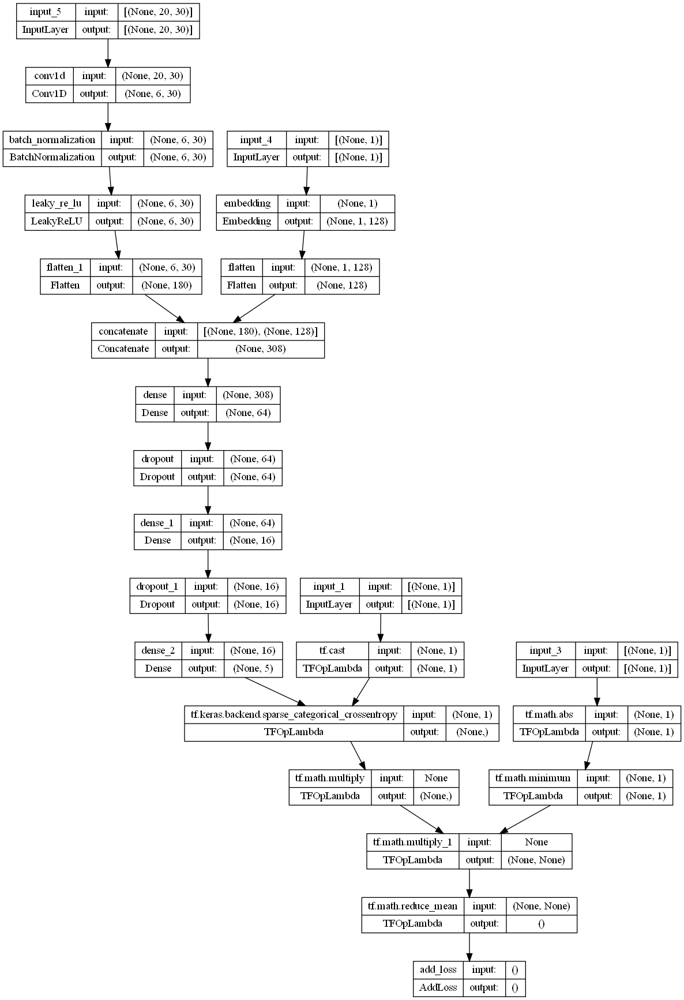

In [13]:
keras.utils.plot_model(CNN_model.model_dict[0], "pic.png", show_shapes=True)

In [14]:
# Save previous weights to compare with next trained weights
old_weights = {}
for i in range(num_of_models):
    old_weights[i] = CNN_model.model_dict[i].get_weights()

In [15]:
# %run C:\Projects\Stock_price_prediction\Experiments\CNN_Class.ipynb
gc.collect()
CNN_model.compile_model()
CNN_model.train_model(x_train, y_train, ret_d_train, sic_train) 
CNN_model.evaluate_model(x_train, y_train, ret_d_train, sic_train, x_test, y_test, ret_d_test, sic_test, batch_size)

if save:
    for i in range(model_params['num_models']):
        CNN_model.model_dict[i].save(f"models/model_{i}_{all_days[ftd]}_{all_days[ltd]}.keras")

gc.collect()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 20, 30)]     0           []                               
                                                                                                  
 conv1d (Conv1D)                (None, 6, 30)        4500        ['input_5[0][0]']                
                                                                                                  
 batch_normalization (BatchNorm  (None, 6, 30)       120         ['conv1d[0][0]']                 
 alization)                                                                                       
                                                                                                  
 input_4 (InputLayer)           [(None, 1)]          0           []                           

Epoch 20/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0165 - val_loss: 0.0175 - lr: 0.0012
Epoch 21/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0165 - val_loss: 0.0175 - lr: 0.0012
Epoch 22/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0165 - val_loss: 0.0176 - lr: 0.0012
Epoch 23/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0164 - val_loss: 0.0175 - lr: 0.0010
Epoch 24/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0164 - val_loss: 0.0174 - lr: 0.0010
Epoch 25/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0164 - val_loss: 0.0176 - lr: 0.0010
Epoch 26/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0164 - val_loss: 0.0176 - lr: 0.0010
Epoch 27/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0164 - val_loss: 0.0176 - lr: 0.0010
Epoch 28/500
146/146 [==============================] - 1s 5ms/step - loss: 0.01

Epoch 12/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0170 - val_loss: 0.0176 - lr: 0.0050
Epoch 13/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0169 - val_loss: 0.0177 - lr: 0.0050
Epoch 14/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0169 - val_loss: 0.0176 - lr: 0.0050
Epoch 15/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0166 - val_loss: 0.0179 - lr: 0.0025
Epoch 16/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0166 - val_loss: 0.0178 - lr: 0.0025
Epoch 17/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0166 - val_loss: 0.0177 - lr: 0.0025
Epoch 18/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0166 - val_loss: 0.0175 - lr: 0.0025
Epoch 19/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0166 - val_loss: 0.0175 - lr: 0.0025
Epoch 20/500
146/146 [==============================] - 1s 4ms/step - loss: 0.01

6407

In [16]:
y = CNN_model.model_dict[0].predict([y_test, x_test, ret_d_test, sic_test], batch_size=4096, verbose=0)
print(np.mean(y, axis=0))
print(np.std(y, axis=0))
# Save trained weights to compare with old weights
new_weights = {}
for i in range(num_of_models):
    new_weights[i] = CNN_model.model_dict[i].get_weights()
    print(np.corrcoef(old_weights[i][0][0][0], new_weights[i][0][0][0])[0, 1])
    x = old_weights[i][-1]
    y = new_weights[i][-1]
    print(np.corrcoef(x.reshape(80, ), y.reshape(80, ))[0, 1])
    
# Now set the new weights to old weights
old_weights = new_weights.copy()

[0.06830197 0.17537166 0.515995   0.17653261 0.06379748]
[0.06616104 0.08236542 0.21152195 0.08648992 0.0645556 ]
0.21844274617250975
0.592734357025749
0.2658356361503168
0.6003821030511869
0.2440221851976144
0.7145562156875869


## Simulating

Testing data from 2019-09-20 to 2019-10-17 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2019-10-18 are ['BHP', 'CAL', 'KODK', 'SPB', 'PUMP', 'BYON', 'BKE', 'MRO', 'ZOM', 'DRIP']
Total asset on 2019-10-21 will be 1.0027648056085299
It should be the same as 1.0027648056085299
top_stocks by model 1 to buy on 2019-10-18 are ['DK', 'PCRX', 'GSAT', 'BKE', 'NOV', 'THO', 'GES', 'ACB', 'ATI', 'TOON']
Total asset on 2019-10-21 will be 0.9987712784963023
It should be the same as 0.9987712784963025
top_stocks by model 2 to buy on 2019-10-18 are ['FNKO', 'GES', 'TSCO', 'PM', 'NVR', 'BTAI', 'CENN', 'CAL', 'BIDU', 'DRIP']
Total asset on 2019-10-21 will be 1.0101076783467022
It should be the same as 1.0101076783467025
top_stocks by return weighted ensemble to buy on 2019-10-18 are ['TSCO', 'SAVA', 'BTAI', 'GES', 'SPB', 'FND', 'BIDU', 'CAL', 'BKE', 'DRIP']
Total asset on 2019-10-21 will be 1.0056237251930567
It should be the same as 1.0056237251930569
top_stocks by equal weighted 

Total asset on 2019-10-29 will be 1.0361068499012365
It should be the same as 1.0361068499012371
Testing data from 2019-10-01 to 2019-10-28 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2019-10-29 are ['SUNWQ', 'CRON', 'MXL', 'FOLD', 'NKE', 'POOL', 'ACB', 'NKTR', 'BB', 'VCYT']
Total asset on 2019-10-30 will be 1.0701405037724063
It should be the same as 1.070140503772406
top_stocks by model 1 to buy on 2019-10-29 are ['OLED', 'YEXT', 'CSIQ', 'BB', 'MCHP', 'EXTR', 'WM', 'POOL', 'ACB', 'ASTH']
Total asset on 2019-10-30 will be 1.006076486176251
It should be the same as 1.006076486176252
top_stocks by model 2 to buy on 2019-10-29 are ['WDFC', 'UEC', 'ALK', 'MCHP', 'DE', 'RYAAY', 'NKE', 'AMRC', 'CAL', 'DRIP']
Total asset on 2019-10-30 will be 1.0391113387596
It should be the same as 1.039111338759599
top_stocks by return weighted ensemble to buy on 2019-10-29 are ['RYAAY', 'CSIQ', 'BB', 'VCYT', 'AMRC', 'MCHP', 'ASTH', 'NKE', 'POOL', 'ACB']
Total asset on 2019-10-30 wil

Testing data from 2019-10-10 to 2019-11-06 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2019-11-07 are ['FLS', 'SFNC', 'WCN', 'VNET', 'SRNE', 'AR', 'WRB', 'GPRO', 'TDS', 'NFG']
Total asset on 2019-11-08 will be 1.16088960496308
It should be the same as 1.16088960496308
top_stocks by model 1 to buy on 2019-11-07 are ['AHT', 'CVE', 'MAC', 'CXW', 'UNFI', 'TENB', 'NNDM', 'GPRO', 'TDS', 'ANY']
Total asset on 2019-11-08 will be 1.0665016535626715
It should be the same as 1.0665016535626737
top_stocks by model 2 to buy on 2019-11-07 are ['EAF', 'SFNC', 'UEC', 'GTLS', 'NOVT', 'NNDM', 'CXW', 'GPRO', 'PSTG', 'TDS']
Total asset on 2019-11-08 will be 1.0754169878783704
It should be the same as 1.07541698787837
top_stocks by return weighted ensemble to buy on 2019-11-07 are ['SFNC', 'UEC', 'ANY', 'CVE', 'UNFI', 'CXW', 'NNDM', 'NFG', 'GPRO', 'TDS']
Total asset on 2019-11-08 will be 1.0873298234521716
It should be the same as 1.0873298234521722
top_stocks by equal weighted ensem

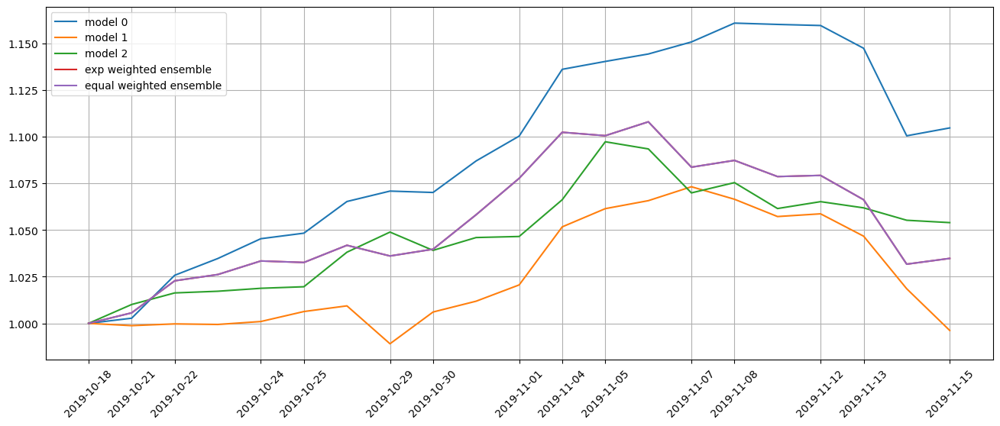

In [18]:
%run C:\Projects\Stock_price_prediction\Experiments\simulation_functions.ipynb
ftd = 100
ltd = 199
first_run = True
total_dict = {}
total_asset_dict = {}
position_dict_all = {}
num_iter = 0
for i in range(num_of_models):
    total_dict[i] = 1
    total_asset_dict[i] = [1]
    position_dict_all[i] = {}
total_dict['ensemble_weighted'] = 1
total_asset_dict['ensemble_weighted'] = [1]
position_dict_all['ensemble_weighted'] = {}
total_dict['ensemble_equal'] = 1
total_asset_dict['ensemble_equal'] = [1]
position_dict_all['ensemble_equal'] = {}

return_dict = {}
total_asset_dict, total_dict, position_dict_all, return_dict = simulate(ftd, ltd, total_dict, first_run, num_stocks, total_asset_dict, position_dict_all, return_dict)

In [ ]:
# pd.DataFrame(CNN_model.model_dict[0].predict([y_test, x_test, ret_d_test, sic_test], batch_size=4096, verbose=0)).to_csv('test0.csv')
# pd.DataFrame(CNN_model.model_dict[1].predict([y_test, x_test, ret_d_test, sic_test], batch_size=4096, verbose=0)).to_csv('test1.csv')
# pd.DataFrame(CNN_model.model_dict[2].predict([y_test, x_test, ret_d_test, sic_test], batch_size=4096, verbose=0)).to_csv('test2.csv')

# Retraining

In [ ]:
# Reproduce interrupted simulations
# for i in range(3):
#     CNN_model.model_dict[i] = keras.models.load_model(f'models/model_{i}_2019-05-28_2019-10-16.keras')
# ftd = 100
# ltd = 199
# first_run = True
# total_dict = {}
# total_asset_dict = {}
# position_dict_all = {}
# num_iter = 0
# for i in range(num_of_models):
#     total_dict[i] = 1
#     total_asset_dict[i] = [1]
#     position_dict_all[i] = {}
# total_dict['ensemble_weighted'] = 1
# total_asset_dict['ensemble_weighted'] = [1]
# position_dict_all['ensemble_weighted'] = {}
# total_dict['ensemble_equal'] = 1
# total_asset_dict['ensemble_equal'] = [1]
# position_dict_all['ensemble_equal'] = {}


# return_dict = {}
# total_asset_dict, total_dict, position_dict_all, return_dict = simulate(ftd, ltd, total_dict, first_run, total_asset_dict, position_dict_all, return_dict)

# prev_weights = {}
# for i in range(3):
#     prev_weights[i] = CNN_model.model_dict[i].get_weights()
    
# ftd = 100
# ltd = 199
# print(f'Running {num_iters} iterations; first iteration already completed.')
# first_run = False

# for num_iter in range(1, 2):
#     ftd += seq_length
#     ltd += seq_length
#     data_train, x_train, y_train, data_test, x_test, y_test, ret_d_train, ret_d_test, sic_train, sic_test = prep_train_test_data(data, seq_length, ftd, ltd, all_days)
#     print(f'Running iteration {num_iter+1} out of {num_iters} iterations')
    
#     for i in range(3):
#         CNN_model.model_dict[i] = keras.models.load_model(f'models/model_{i}_2019-06-25_2019-11-13.keras')
    
#     total_asset_dict, total_dict, position_dict_all, return_dict = simulate(ftd, ltd, total_dict, first_run, total_asset_dict, 
#                                                                             position_dict_all, return_dict)

Running 58 iterations; first iteration already completed.
Standardization data are from 2019-01-31 to 2019-06-24
Training data are from 2019-06-25 to 2019-11-13
Testing data are from 2019-10-18 to 2019-12-12
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 2 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0183 - val_loss: 0.0179 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0181 - val_loss: 0.0182 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0180 - val_loss: 0.0182 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0179 - val_loss: 0.0182 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0178 - val_loss: 0.0181 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0

146/146 [==============================] - 1s 4ms/step - loss: 0.0165 - val_loss: 0.0180 - lr: 0.0010
Epoch 34/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0166 - val_loss: 0.0179 - lr: 0.0010
Epoch 35/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0165 - val_loss: 0.0180 - lr: 0.0010
Epoch 36/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0166 - val_loss: 0.0179 - lr: 0.0010
Epoch 37/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0166 - val_loss: 0.0179 - lr: 0.0010
Epoch 38/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0165 - val_loss: 0.0180 - lr: 0.0010
Epoch 39/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0165 - val_loss: 0.0180 - lr: 0.0010
Epoch 40/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0165 - val_loss: 0.0179 - lr: 0.0010
Epoch 41/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0165 - val_loss

146/146 [==============================] - 1s 4ms/step - loss: 0.0165 - val_loss: 0.0180 - lr: 0.0010
Epoch 44/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0166 - val_loss: 0.0178 - lr: 0.0010
Epoch 45/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0165 - val_loss: 0.0179 - lr: 0.0010
Epoch 46/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0166 - val_loss: 0.0179 - lr: 0.0010
Epoch 47/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0165 - val_loss: 0.0179 - lr: 0.0010
Epoch 48/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0165 - val_loss: 0.0180 - lr: 0.0010
Epoch 49/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0165 - val_loss: 0.0179 - lr: 0.0010
Epoch 50/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0165 - val_loss: 0.0179 - lr: 0.0010
Epoch 51/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0165 - val_loss

Total asset on 2019-11-21 will be 1.0334856986890146
It should be the same as 1.0334856986890144
Testing data from 2019-10-24 to 2019-11-20 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2019-11-21 are ['GFI', 'SUNWQ', 'WBA', 'PJT', 'NAIL', 'DCPH', 'EXTR', 'SUN', 'AEHR', 'IBIO']
Total asset on 2019-11-22 will be 1.070095836062345
It should be the same as 1.0700958360623447
top_stocks by model 1 to buy on 2019-11-21 are ['ATRC', 'DEO', 'MAT', 'WBA', 'SUN', 'TPIC', 'CCEP', 'SUNWQ', 'PRPL', 'TRIP']
Total asset on 2019-11-22 will be 0.9632751558709872
It should be the same as 0.9632751558709901
top_stocks by model 2 to buy on 2019-11-21 are ['KALU', 'PJT', 'WBA', 'ATRC', 'QSR', 'LGIH', 'TSEM', 'GFI', 'ANY', 'SUN']
Total asset on 2019-11-22 will be 1.0285269596931645
It should be the same as 1.0285269596931639
top_stocks by return weighted ensemble to buy on 2019-11-21 are ['CCEP', 'PZZA', 'MAT', 'ATRC', 'SUNWQ', 'TSEM', 'PJT', 'GFI', 'WBA', 'SUN']
Total asset on 2019-11

Testing data from 2019-11-04 to 2019-12-02 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2019-12-03 are ['TDC', 'MUR', 'WCC', 'DDS', 'NYCB', 'FTGC', 'FTSM', 'AMKR', 'TNK', 'IBIO']
Total asset on 2019-12-04 will be 1.2138029453236372
It should be the same as 1.213802945323638
top_stocks by model 1 to buy on 2019-12-03 are ['WCC', 'UNG', 'VNET', 'NIU', 'FTSM', 'DDS', 'IBIO', 'PR', 'AMKR', 'TNK']
Total asset on 2019-12-04 will be 1.0482189040777024
It should be the same as 1.048218904077706
top_stocks by model 2 to buy on 2019-12-03 are ['ENLC', 'SUNWQ', 'NIU', 'DDS', 'VNET', 'EPD', 'AMKR', 'TNK', 'BOIL', 'UNG']
Total asset on 2019-12-04 will be 1.053444351710094
It should be the same as 1.0534443517100938
top_stocks by return weighted ensemble to buy on 2019-12-03 are ['WCC', 'TPIC', 'NIU', 'FTGC', 'FTSM', 'UNG', 'VNET', 'DDS', 'AMKR', 'TNK']
Total asset on 2019-12-04 will be 1.1237457031302398
It should be the same as 1.1237457031302394
top_stocks by equal weighted 

top_stocks by model 0 to buy on 2019-12-12 are ['BKE', 'BBWI', 'PTGX', 'BAP', 'TPIC', 'GGB', 'GOGO', 'ENLC', 'ARWR', 'IBIO']
Total asset on 2019-12-13 will be 1.2908542606774769
It should be the same as 1.2908542606774773
top_stocks by model 1 to buy on 2019-12-12 are ['WES', 'ENLC', 'GOGO', 'BAP', 'ACB', 'ETRN', 'NNDM', 'AM', 'CGC', 'IBIO']
Total asset on 2019-12-13 will be 1.0876879855696029
It should be the same as 1.0876879855696064
top_stocks by model 2 to buy on 2019-12-12 are ['PTGX', 'ADNT', 'ACMR', 'WES', 'BKE', 'VTLE', 'GOGO', 'CGC', 'AM', 'IBIO']
Total asset on 2019-12-13 will be 1.095297597364452
It should be the same as 1.0952975973644525
top_stocks by return weighted ensemble to buy on 2019-12-12 are ['BKE', 'WES', 'BAP', 'ETRN', 'ENLC', 'ARWR', 'GOGO', 'AM', 'CGC', 'IBIO']
Total asset on 2019-12-13 will be 1.1805842678860157
It should be the same as 1.1805842678860163
top_stocks by equal weighted ensemble to buy on 2019-12-12 are ['BKE', 'WES', 'BAP', 'ETRN', 'ENLC', 'AR

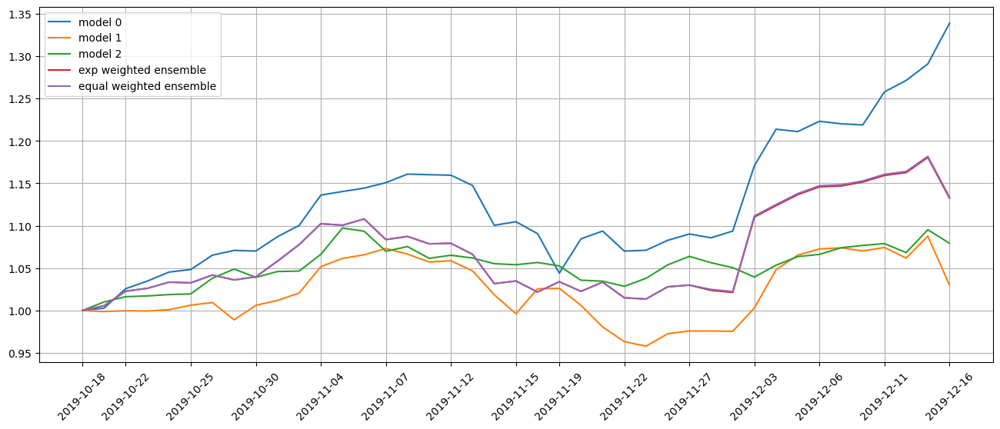

Standardization data are from 2019-03-01 to 2019-07-23
Training data are from 2019-07-24 to 2019-12-12
Testing data are from 2019-11-15 to 2020-01-13
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 3 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0167 - val_loss: 0.0153 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0166 - val_loss: 0.0150 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0164 - val_loss: 0.0151 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0164 - val_loss: 0.0152 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0163 - val_loss: 0.0153 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0163 - val_loss: 0.0151 - lr: 0.0100
Epoch 7/500
146/146 [=

146/146 [==============================] - 1s 4ms/step - loss: 0.0154 - val_loss: 0.0150 - lr: 0.0025
Epoch 21/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0155 - val_loss: 0.0150 - lr: 0.0025
Epoch 22/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0155 - val_loss: 0.0150 - lr: 0.0025
Epoch 23/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0154 - val_loss: 0.0149 - lr: 0.0012
Epoch 24/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0153 - val_loss: 0.0149 - lr: 0.0012
Epoch 25/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0153 - val_loss: 0.0148 - lr: 0.0012
Epoch 26/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0153 - val_loss: 0.0150 - lr: 0.0012
Epoch 27/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0153 - val_loss: 0.0149 - lr: 0.0012
Epoch 28/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0152 - val_loss

12/12 [==============================] - 0s 3ms/step
Model 2 test loss 0.01963488943874836
Correlations between old and new weights
0.9633726433555841
0.985717349182821
0.9594430400714112
0.9857862481081836
0.9759896926471343
0.9803181227952725
Weight of model 0 is 0.39908185393703915
Weight of model 1 is 0.2930500123769224
Weight of model 2 is 0.30786813368603844
Testing data from 2019-11-15 to 2019-12-13 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2019-12-16 are ['DBI', 'TRN', 'SKT', 'SENS', 'FL', 'GPS', 'TRIP', 'AUPH', 'URBN', 'KOD']
Total asset on 2019-12-17 will be 1.338313066570468
It should be the same as 1.338313066570469
top_stocks by model 1 to buy on 2019-12-16 are ['BCS', 'FL', 'PBR', 'PRMW', 'MVIS', 'GPS', 'TBT', 'WWW', 'BGFV', 'SENS']
Total asset on 2019-12-17 will be 1.013921884828527
It should be the same as 1.0139218848285305
top_stocks by model 2 to buy on 2019-12-16 are ['SAN', 'TRIP', 'ITUB', 'CNX', 'GPS', 'URBN', 'FL', 'WOLF', 'MOD', 'IBIO']


Total asset on 2019-12-26 will be 1.201115860190946
It should be the same as 1.2011158601909453
Testing data from 2019-11-26 to 2019-12-24 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2019-12-26 are ['RILY', 'GPI', 'AUPH', 'QD', 'SPDN', 'LZB', 'WIX', 'PSTG', 'PTGX', 'TNK']
Total asset on 2019-12-27 will be 1.3967778323832505
It should be the same as 1.396777832383251
top_stocks by model 1 to buy on 2019-12-26 are ['WIX', 'SAGE', 'EPI', 'SNBR', 'VSTO', 'LZB', 'PSTG', 'KOD', 'PTGX', 'TNK']
Total asset on 2019-12-27 will be 1.0545964817293958
It should be the same as 1.0545964817294002
top_stocks by model 2 to buy on 2019-12-26 are ['SMCI', 'NGVT', 'SAGE', 'WIX', 'SPDN', 'LZB', 'ADT', 'PSTG', 'CORT', 'TNK']
Total asset on 2019-12-27 will be 1.1480810078939705
It should be the same as 1.1480810078939707
top_stocks by return weighted ensemble to buy on 2019-12-26 are ['NGVT', 'QD', 'SWBI', 'MVIS', 'SPDN', 'WIX', 'LZB', 'PSTG', 'PTGX', 'TNK']
Total asset on 2019-12-27 w

Total asset on 2020-01-07 will be 1.1370125538436997
It should be the same as 1.137012553843701
top_stocks by equal weighted ensemble to buy on 2020-01-06 are ['BA', 'SLB', 'BECN', 'IRTC', 'NGVT', 'YEXT', 'KOS', 'BPMC', 'CCJ', 'SAVA']
Total asset on 2020-01-07 will be 1.1263338847035436
It should be the same as 1.1263338847035433
Testing data from 2019-12-06 to 2020-01-06 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2020-01-07 are ['SNDX', 'PTGX', 'EXPI', 'RGLD', 'RUSHA', 'AGI', 'VANI', 'TNK', 'AXSM', 'KOD']
Total asset on 2020-01-08 will be 1.263361711735861
It should be the same as 1.263361711735861
top_stocks by model 1 to buy on 2020-01-07 are ['PTGX', 'SCHW', 'NNDM', 'BVN', 'PEN', 'RYTM', 'ALLK', 'VANI', 'SGOL', 'KOD']
Total asset on 2020-01-08 will be 0.9885449159599943
It should be the same as 0.9885449159599988
top_stocks by model 2 to buy on 2020-01-07 are ['SPR', 'ITCI', 'SWBI', 'GPRE', 'CPRI', 'BAP', 'ALLO', 'GIII', 'AXSM', 'VANI']
Total asset on 2020-0

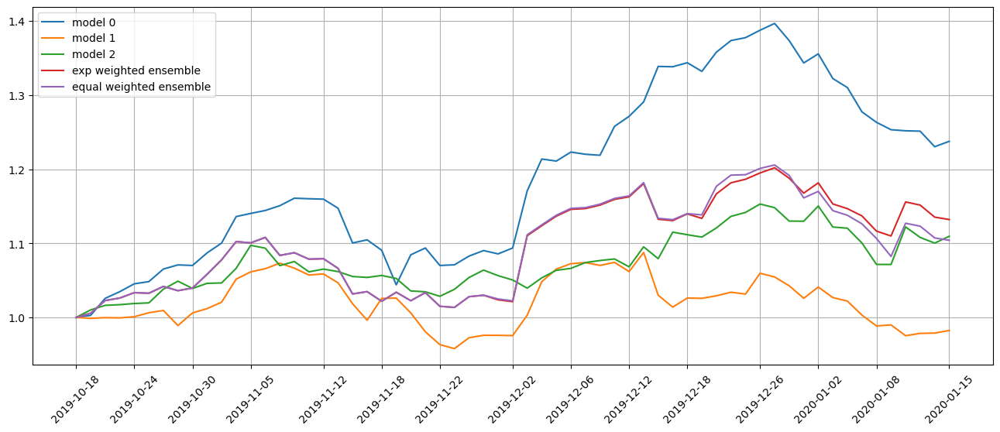

Standardization data are from 2019-03-29 to 2019-08-20
Training data are from 2019-08-21 to 2020-01-13
Testing data are from 2019-12-16 to 2020-02-11
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 4 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0148 - val_loss: 0.0126 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0147 - val_loss: 0.0128 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0146 - val_loss: 0.0128 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0145 - val_loss: 0.0127 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0145 - val_loss: 0.0130 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0145 - val_loss: 0.0127 - lr: 0.0100
Epoch 7/500
146/146 [=

146/146 [==============================] - 1s 4ms/step - loss: 0.0140 - val_loss: 0.0125 - lr: 0.0025
Epoch 16/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0140 - val_loss: 0.0124 - lr: 0.0025
Epoch 17/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0140 - val_loss: 0.0124 - lr: 0.0025
Epoch 18/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0138 - val_loss: 0.0123 - lr: 0.0012
Epoch 19/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0138 - val_loss: 0.0124 - lr: 0.0012
Epoch 20/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0139 - val_loss: 0.0123 - lr: 0.0012
Epoch 21/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0139 - val_loss: 0.0123 - lr: 0.0012
Epoch 22/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0138 - val_loss: 0.0125 - lr: 0.0012
Epoch 23/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0138 - val_loss

46/46 [==============================] - 0s 3ms/step
Model 1 training loss 0.02082362025976181
12/12 [==============================] - 0s 3ms/step
Model 1 test loss 0.03430899605154991
46/46 [==============================] - 0s 4ms/step
Model 2 training loss 0.020675692707300186
12/12 [==============================] - 0s 3ms/step
Model 2 test loss 0.03397957608103752
Correlations between old and new weights
0.9724980939126797
0.986562104003556
0.9781081788191716
0.988123601873027
0.9714065051326033
0.9928711413758418
Weight of model 0 is 0.37673063055396055
Weight of model 1 is 0.29185775812578235
Weight of model 2 is 0.33141161132025704
Testing data from 2019-12-16 to 2020-01-14 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2020-01-15 are ['DHR', 'ENR', 'NCLH', 'IOVA', 'ARWR', 'ZOM', 'ALLK', 'QTWO', 'TCBI', 'KOD']
Total asset on 2020-01-16 will be 1.23908292856731
It should be the same as 1.2390829285673104
top_stocks by model 1 to buy on 2020-01-15 are ['QTWO'

top_stocks by model 2 to buy on 2020-01-24 are ['ATHM', 'MLI', 'SXT', 'RIO', 'PRO', 'CSIQ', 'TNK', 'AXSM', 'KOD', 'APT']
Total asset on 2020-01-27 will be 1.0807932437740548
It should be the same as 1.0807932437740546
top_stocks by return weighted ensemble to buy on 2020-01-24 are ['QURE', 'SXT', 'SGH', 'ITCI', 'PRO', 'CSIQ', 'TNK', 'KOD', 'AXSM', 'APT']
Total asset on 2020-01-27 will be 1.0771525699605866
It should be the same as 1.0771525699605877
top_stocks by equal weighted ensemble to buy on 2020-01-24 are ['RIO', 'SXT', 'SGH', 'ITCI', 'PRO', 'TNK', 'CSIQ', 'AXSM', 'KOD', 'APT']
Total asset on 2020-01-27 will be 1.041515748842035
It should be the same as 1.041515748842035
Testing data from 2019-12-26 to 2020-01-24 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2020-01-27 are ['AZN', 'OIH', 'AG', 'LBRT', 'NCLH', 'DVAX', 'KOD', 'HMY', 'AXSM', 'APT']
Total asset on 2020-01-28 will be 1.2231378662178056
It should be the same as 1.2231378662178065
top_stocks by mode

top_stocks by model 1 to buy on 2020-02-04 are ['OXM', 'NVR', 'CODX', 'AAP', 'CLNE', 'SUN', 'HBI', 'ITCI', 'MTDR', 'IBIO']
Total asset on 2020-02-05 will be 0.8424210764956065
It should be the same as 0.8424210764956117
top_stocks by model 2 to buy on 2020-02-04 are ['AEO', 'URBN', 'ASB', 'GSAT', 'NVR', 'NVDA', 'AXSM', 'PAGS', 'GUSH', 'IBIO']
Total asset on 2020-02-05 will be 1.076393745516393
It should be the same as 1.0763937455163934
top_stocks by return weighted ensemble to buy on 2020-02-04 are ['GBX', 'ESGU', 'CODX', 'URBN', 'MTDR', 'PAGS', 'NVR', 'GUSH', 'AXSM', 'IBIO']
Total asset on 2020-02-05 will be 1.0368095257133596
It should be the same as 1.036809525713362
top_stocks by equal weighted ensemble to buy on 2020-02-04 are ['GBX', 'GSAT', 'CODX', 'URBN', 'MTDR', 'PAGS', 'NVR', 'GUSH', 'AXSM', 'IBIO']
Total asset on 2020-02-05 will be 0.9874823519196885
It should be the same as 0.987482351919689
Testing data from 2020-01-07 to 2020-02-04 have shape (2295, 20, 30), (2295,)
top_

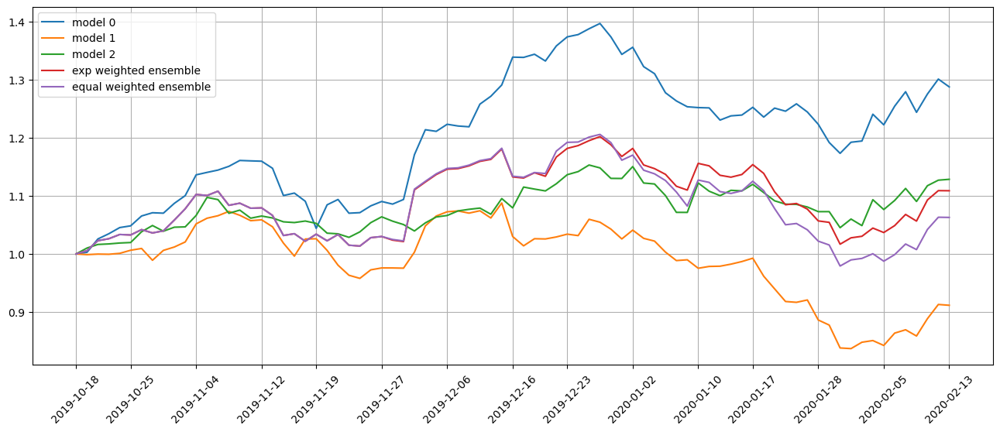

Standardization data are from 2019-04-29 to 2019-09-18
Training data are from 2019-09-19 to 2020-02-11
Testing data are from 2020-01-15 to 2020-03-11
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 5 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0140 - val_loss: 0.0255 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0138 - val_loss: 0.0253 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0137 - val_loss: 0.0246 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0136 - val_loss: 0.0263 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0136 - val_loss: 0.0250 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0136 - val_loss: 0.0260 - lr: 0.0100
Epoch 7/500
146/146 [=

146/146 [==============================] - 1s 4ms/step - loss: 0.0131 - val_loss: 0.0251 - lr: 0.0012
Epoch 22/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0130 - val_loss: 0.0256 - lr: 0.0012
Epoch 22: early stopping
46/46 [==============================] - 0s 4ms/step
Model 0 training loss 0.024713290855288506
12/12 [==============================] - 0s 4ms/step
Model 0 test loss 0.08254764974117279
46/46 [==============================] - 0s 4ms/step
Model 1 training loss 0.024674613028764725
12/12 [==============================] - 0s 3ms/step
Model 1 test loss 0.08257671445608139
46/46 [==============================] - 0s 3ms/step
Model 2 training loss 0.024222681298851967
12/12 [==============================] - 0s 3ms/step
Model 2 test loss 0.0787658542394638
Correlations between old and new weights
0.9967835774851911
0.9709600222895758
0.9939201718534065
0.9764063880660911
0.9972257822879864
0.9749772378028151
Weight of model 0 is 0.3937665959839421
Wei

top_stocks by model 0 to buy on 2020-02-24 are ['INCY', 'MGPI', 'PRTA', 'AMBA', 'CACC', 'SWN', 'NXE', 'AR', 'NSP', 'APT']
Total asset on 2020-02-25 will be 1.2786525401682551
It should be the same as 1.2786525401682578
top_stocks by model 1 to buy on 2020-02-24 are ['ASR', 'NSP', 'LGF.A', 'AMR', 'AMBA', 'SIGA', 'AMZN', 'INCY', 'RELX', 'APT']
Total asset on 2020-02-25 will be 0.9372564332386543
It should be the same as 0.9372564332386593
top_stocks by model 2 to buy on 2020-02-24 are ['CLDX', 'ZOM', 'ESPR', 'APPF', 'KOD', 'ACB', 'APT', 'SAVA', 'AUPH', 'VXRT']
Total asset on 2020-02-25 will be 1.2137952260384473
It should be the same as 1.2137952260384473
top_stocks by return weighted ensemble to buy on 2020-02-24 are ['CLDX', 'NOW', 'INCY', 'SWN', 'NSP', 'ESPR', 'RELX', 'AMBA', 'APPF', 'APT']
Total asset on 2020-02-25 will be 1.1746779050039942
It should be the same as 1.174677905003997
top_stocks by equal weighted ensemble to buy on 2020-02-24 are ['CLDX', 'NOW', 'SWN', 'INCY', 'NSP', 

Total asset on 2020-03-04 will be 1.0341202748517435
It should be the same as 1.0341202748517442
Testing data from 2020-02-04 to 2020-03-03 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2020-03-04 are ['MAC', 'CGC', 'IBIO', 'TT', 'HZO', 'BTAI', 'INO', 'NNDM', 'TNK', 'APT']
Total asset on 2020-03-05 will be 1.747488036206888
It should be the same as 1.7474880362068912
top_stocks by model 1 to buy on 2020-03-04 are ['KN', 'SMAR', 'ZYME', 'PTC', 'SGRY', 'RYAAY', 'HZO', 'MNKD', 'INO', 'APT']
Total asset on 2020-03-05 will be 0.8251984869017532
It should be the same as 0.8251984869017585
top_stocks by model 2 to buy on 2020-03-04 are ['KOD', 'CODX', 'TNK', 'BTAI', 'IBIO', 'ZOM', 'INO', 'AUPH', 'SAVA', 'VXRT']
Total asset on 2020-03-05 will be 1.5080488941222352
It should be the same as 1.5080488941222354
top_stocks by return weighted ensemble to buy on 2020-03-04 are ['CGC', 'HZO', 'MVIS', 'BTAI', 'TNK', 'TT', 'NNDM', 'IBIO', 'APT', 'INO']
Total asset on 2020-03-05 will

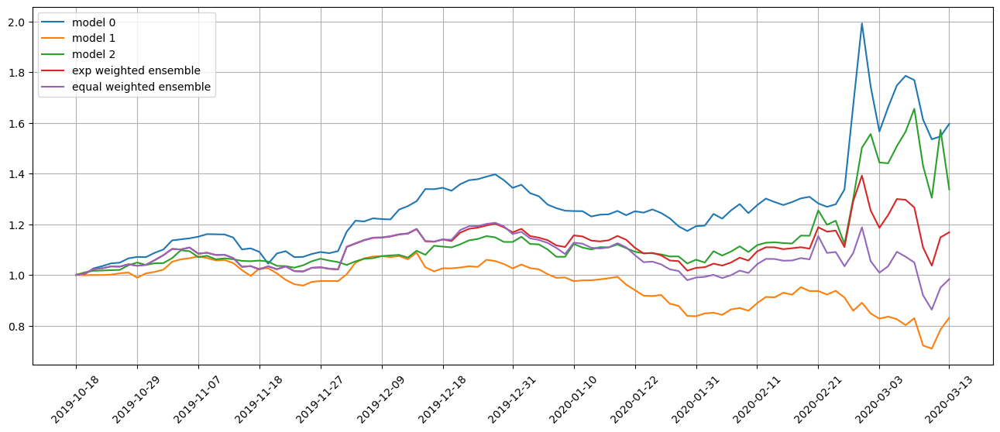

Standardization data are from 2019-05-28 to 2019-10-16
Training data are from 2019-10-17 to 2020-03-11
Testing data are from 2020-02-13 to 2020-04-08
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 6 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0151 - val_loss: 0.0843 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0149 - val_loss: 0.0891 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0148 - val_loss: 0.0863 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0147 - val_loss: 0.0896 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0146 - val_loss: 0.0874 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0146 - val_loss: 0.0930 - lr: 0.0100
Epoch 7/500
146/146 [=

46/46 [==============================] - 0s 3ms/step
Model 0 training loss 0.036187272518873215
12/12 [==============================] - 0s 3ms/step
Model 0 test loss 0.0955919474363327
46/46 [==============================] - 0s 3ms/step
Model 1 training loss 0.03570886701345444
12/12 [==============================] - 0s 3ms/step
Model 1 test loss 0.10098198056221008
46/46 [==============================] - 0s 4ms/step
Model 2 training loss 0.03403240814805031
12/12 [==============================] - 0s 3ms/step
Model 2 test loss 0.10440745949745178
Correlations between old and new weights
0.9976348736277986
0.9798672541517526
0.9983464356287277
0.983461412719858
0.9862743067930587
0.977342858816196
Weight of model 0 is 0.44691771685243087
Weight of model 1 is 0.20800514775264017
Weight of model 2 is 0.345077135394929
Testing data from 2020-02-13 to 2020-03-12 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2020-03-13 are ['SHM', 'SPIB', 'FPE', 'SPAB', 'HYMB', 'ITM

top_stocks by model 1 to buy on 2020-03-23 are ['ICSH', 'IGSB', 'ERY', 'PULS', 'MINT', 'JPST', 'GSY', 'NEAR', 'BIL', 'FTSM']
Total asset on 2020-03-24 will be 0.9407234079484547
It should be the same as 0.9407234079484603
top_stocks by model 2 to buy on 2020-03-23 are ['SLQD', 'FPE', 'FLRN', 'JPST', 'GSY', 'BIL', 'APT', 'NEAR', 'FTSM', 'FLOT']
Total asset on 2020-03-24 will be 1.3710291090397217
It should be the same as 1.371029109039723
top_stocks by return weighted ensemble to buy on 2020-03-23 are ['FMB', 'SPIB', 'SPSB', 'PULS', 'IGSB', 'APT', 'GSY', 'BIL', 'JPST', 'FTSM']
Total asset on 2020-03-24 will be 1.2801907154648542
It should be the same as 1.2801907154648582
top_stocks by equal weighted ensemble to buy on 2020-03-23 are ['SPIB', 'FMB', 'SPSB', 'APT', 'IGSB', 'PULS', 'GSY', 'BIL', 'JPST', 'FTSM']
Total asset on 2020-03-24 will be 1.1020264817130687
It should be the same as 1.1020264817130685
Testing data from 2020-02-25 to 2020-03-23 have shape (2295, 20, 30), (2295,)
top_s

top_stocks by model 0 to buy on 2020-04-01 are ['PMT', 'SRLN', 'FTSL', 'ERY', 'BKLN', 'FTSM', 'INO', 'MFA', 'FPE', 'FLOT']
Total asset on 2020-04-02 will be 2.1390081048577576
It should be the same as 2.13900810485776
top_stocks by model 1 to buy on 2020-04-01 are ['PAGP', 'JMST', 'ABR', 'STWD', 'RDN', 'FPE', 'PMT', 'CIM', 'BIL', 'ERY']
Total asset on 2020-04-02 will be 1.1172751096080624
It should be the same as 1.1172751096080673
top_stocks by model 2 to buy on 2020-04-01 are ['BXMT', 'JMST', 'CIM', 'JPST', 'INO', 'PMT', 'BIL', 'ERY', 'FPE', 'FLOT']
Total asset on 2020-04-02 will be 1.3785761698705403
It should be the same as 1.3785761698705425
top_stocks by return weighted ensemble to buy on 2020-04-01 are ['BXMT', 'BKLN', 'JMST', 'FLOT', 'CIM', 'BIL', 'PMT', 'INO', 'FPE', 'ERY']
Total asset on 2020-04-02 will be 1.5445853883252718
It should be the same as 1.5445853883252767
top_stocks by equal weighted ensemble to buy on 2020-04-01 are ['BXMT', 'ABR', 'STWD', 'JMST', 'INO', 'CIM', 

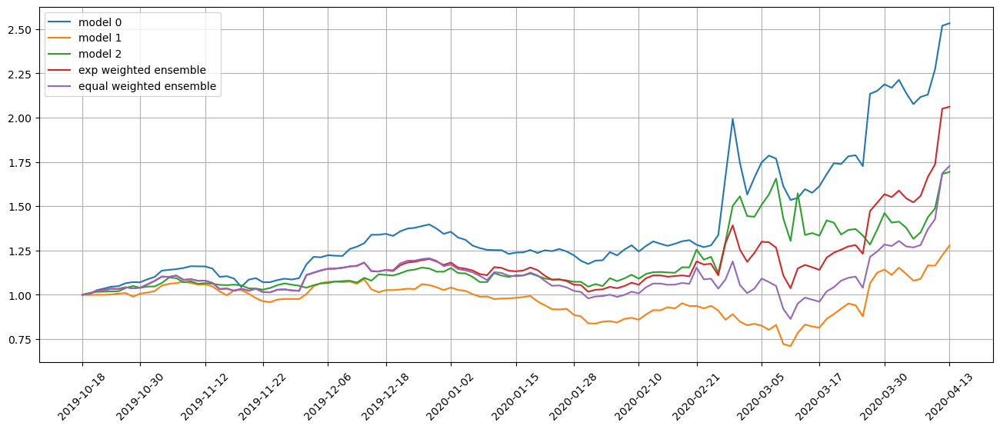

Standardization data are from 2019-06-25 to 2019-11-13
Training data are from 2019-11-14 to 2020-04-08
Testing data are from 2020-03-13 to 2020-05-07
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 7 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0316 - val_loss: 0.0965 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0302 - val_loss: 0.0960 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0297 - val_loss: 0.1006 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0295 - val_loss: 0.0973 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0292 - val_loss: 0.0906 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0291 - val_loss: 0.0892 - lr: 0.0100
Epoch 7/500
146/146 [=

146/146 [==============================] - 1s 4ms/step - loss: 0.0271 - val_loss: 0.1190 - lr: 0.0012
Epoch 19/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0270 - val_loss: 0.1271 - lr: 0.0012
Epoch 20/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0270 - val_loss: 0.1192 - lr: 0.0012
Epoch 21/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0270 - val_loss: 0.1232 - lr: 0.0012
Epoch 22/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0270 - val_loss: 0.1185 - lr: 0.0012
Epoch 22: early stopping
46/46 [==============================] - 0s 3ms/step
Model 0 training loss 0.04692653566598892
12/12 [==============================] - 0s 3ms/step
Model 0 test loss 0.04951092228293419
46/46 [==============================] - 0s 4ms/step
Model 1 training loss 0.044076014310121536
12/12 [==============================] - 0s 4ms/step
Model 1 test loss 0.050275858491659164
46/46 [==============================] 

Testing data from 2020-03-23 to 2020-04-20 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2020-04-21 are ['NYMT', 'JPST', 'MINT', 'NEAR', 'PULS', 'MFA', 'FLRN', 'FLOT', 'FTSM', 'APT']
Total asset on 2020-04-22 will be 2.651644465767423
It should be the same as 2.6516444657674256
top_stocks by model 1 to buy on 2020-04-21 are ['SRLN', 'PULS', 'MINT', 'PMT', 'IVR', 'RWT', 'NYMT', 'MFA', 'APT', 'FTSM']
Total asset on 2020-04-22 will be 1.3625326713158996
It should be the same as 1.362532671315905
top_stocks by model 2 to buy on 2020-04-21 are ['PULS', 'FTSM', 'GSY', 'NEAR', 'IVR', 'RWT', 'NYMT', 'FLRN', 'MINT', 'FLOT']
Total asset on 2020-04-22 will be 1.7912880295689089
It should be the same as 1.7912880295689118
top_stocks by return weighted ensemble to buy on 2020-04-21 are ['GSY', 'JPST', 'RWT', 'NEAR', 'PULS', 'FLRN', 'NYMT', 'MINT', 'FLOT', 'FTSM']
Total asset on 2020-04-22 will be 2.123345448904941
It should be the same as 2.1233454489049457
top_stocks by equal 

Total asset on 2020-05-01 will be 2.6417485771143974
It should be the same as 2.6417485771143996
top_stocks by model 1 to buy on 2020-04-30 are ['FPE', 'GSY', 'MINT', 'INO', 'FLRN', 'MFA', 'NEAR', 'FTSM', 'FLOT', 'APT']
Total asset on 2020-05-01 will be 1.3144383081535351
It should be the same as 1.3144383081535411
top_stocks by model 2 to buy on 2020-04-30 are ['TNK', 'ELAN', 'RIOT', 'GSY', 'LSCC', 'CODX', 'PULS', 'FLRN', 'MINT', 'FLOT']
Total asset on 2020-05-01 will be 1.7489663336721892
It should be the same as 1.7489663336721926
top_stocks by return weighted ensemble to buy on 2020-04-30 are ['FPE', 'GSY', 'PULS', 'MFA', 'FTSM', 'MINT', 'FLRN', 'NEAR', 'APT', 'FLOT']
Total asset on 2020-05-01 will be 2.1225092911717023
It should be the same as 2.122509291171708
top_stocks by equal weighted ensemble to buy on 2020-04-30 are ['MFA', 'FPE', 'PULS', 'GSY', 'FTSM', 'MINT', 'FLRN', 'NEAR', 'APT', 'FLOT']
Total asset on 2020-05-01 will be 1.859588651845774
It should be the same as 1.8595

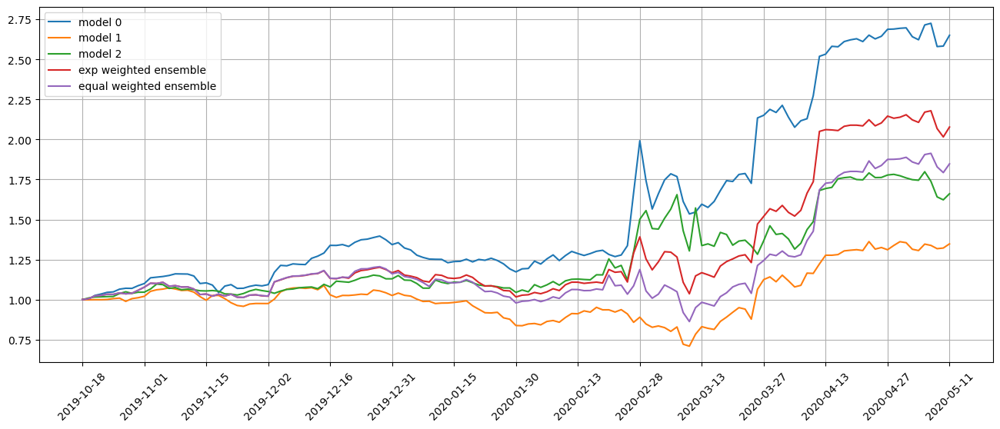

Standardization data are from 2019-07-24 to 2019-12-12
Training data are from 2019-12-13 to 2020-05-07
Testing data are from 2020-04-13 to 2020-06-05
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 8 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0491 - val_loss: 0.0476 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0467 - val_loss: 0.0470 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0463 - val_loss: 0.0479 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0462 - val_loss: 0.0476 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0457 - val_loss: 0.0475 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0454 - val_loss: 0.0471 - lr: 0.0100
Epoch 7/500
146/146 [=

146/146 [==============================] - 1s 4ms/step - loss: 0.0466 - val_loss: 0.0475 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0459 - val_loss: 0.0478 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0456 - val_loss: 0.0475 - lr: 0.0100
Epoch 7/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0446 - val_loss: 0.0468 - lr: 0.0050
Epoch 8/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0445 - val_loss: 0.0470 - lr: 0.0050
Epoch 9/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0443 - val_loss: 0.0479 - lr: 0.0050
Epoch 10/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0440 - val_loss: 0.0480 - lr: 0.0050
Epoch 11/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0438 - val_loss: 0.0477 - lr: 0.0050
Epoch 12/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0438 - val_loss: 0.0

Testing data from 2020-04-17 to 2020-05-14 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2020-05-15 are ['HYMB', 'JETS', 'INO', 'PDI', 'ZOM', 'TOON', 'ALT', 'MFA', 'CODX', 'APT']
Total asset on 2020-05-18 will be 2.9478661586082935
It should be the same as 2.9478661586082957
top_stocks by model 1 to buy on 2020-05-15 are ['FTSM', 'NEAR', 'HUBG', 'DRIP', 'DXD', 'MSGS', 'AAOI', 'GLPG', 'MVIS', 'ERY']
Total asset on 2020-05-18 will be 1.3118844606101265
It should be the same as 1.311884460610134
top_stocks by model 2 to buy on 2020-05-15 are ['MSGS', 'VTEB', 'PDI', 'PSQ', 'SCO', 'PZA', 'LMBS', 'SRLN', 'ITM', 'VNLA']
Total asset on 2020-05-18 will be 1.5292321593012674
It should be the same as 1.5292321593012712
top_stocks by return weighted ensemble to buy on 2020-05-15 are ['TOON', 'MSGS', 'FTSM', 'ERY', 'VNLA', 'PDI', 'ALT', 'CODX', 'APT', 'MFA']
Total asset on 2020-05-18 will be 2.1916518146642914
It should be the same as 2.1916518146642963
top_stocks by equal weig

top_stocks by model 0 to buy on 2020-05-27 are ['FTSM', 'CLX', 'HYMB', 'ZOM', 'INO', 'JETS', 'ALT', 'MFA', 'CODX', 'APT']
Total asset on 2020-05-28 will be 3.2266302076467226
It should be the same as 3.2266302076467257
top_stocks by model 1 to buy on 2020-05-27 are ['SH', 'SRTY', 'DXD', 'DOG', 'JETS', 'RWM', 'ERY', 'TZA', 'TWM', 'FAZ']
Total asset on 2020-05-28 will be 1.3040133894766976
It should be the same as 1.3040133894767048
top_stocks by model 2 to buy on 2020-05-27 are ['SPDN', 'DXD', 'VANI', 'RWM', 'ZOM', 'TZA', 'FAZ', 'LMBS', 'TWM', 'ERY']
Total asset on 2020-05-28 will be 1.5714768268142938
It should be the same as 1.571476826814297
top_stocks by return weighted ensemble to buy on 2020-05-27 are ['TWM', 'INO', 'LMBS', 'FAZ', 'MFA', 'ALT', 'ERY', 'JETS', 'CODX', 'APT']
Total asset on 2020-05-28 will be 2.2058448106056905
It should be the same as 2.205844810605694
top_stocks by equal weighted ensemble to buy on 2020-05-27 are ['DXD', 'CODX', 'JETS', 'RWM', 'LMBS', 'TZA', 'APT'

Total asset on 2020-06-08 will be 3.456817679506265
It should be the same as 3.4568176795062655
top_stocks by model 1 to buy on 2020-06-05 are ['GSK', 'RGNX', 'HMC', 'CBU', 'TFIN', 'EURN', 'STNG', 'ZOM', 'INSW', 'JETS']
Total asset on 2020-06-08 will be 1.438583245661864
It should be the same as 1.4385832456618717
top_stocks by model 2 to buy on 2020-06-05 are ['SCO', 'FIBK', 'INSW', 'ASB', 'ABCB', 'AUB', 'WTM', 'HMC', 'TFIN', 'AMN']
Total asset on 2020-06-08 will be 1.928435855375333
It should be the same as 1.9284358553753358
top_stocks by return weighted ensemble to buy on 2020-06-05 are ['CBU', 'STNG', 'INSW', 'AGO', 'TFIN', 'MFA', 'APT', 'CODX', 'ZOM', 'JETS']
Total asset on 2020-06-08 will be 2.5968329432418784
It should be the same as 2.596832943241882
top_stocks by equal weighted ensemble to buy on 2020-06-05 are ['TM', 'AMN', 'AGO', 'HMC', 'CBU', 'STNG', 'TFIN', 'INSW', 'ZOM', 'JETS']
Total asset on 2020-06-08 will be 2.0867835774078762
It should be the same as 2.0867835774078

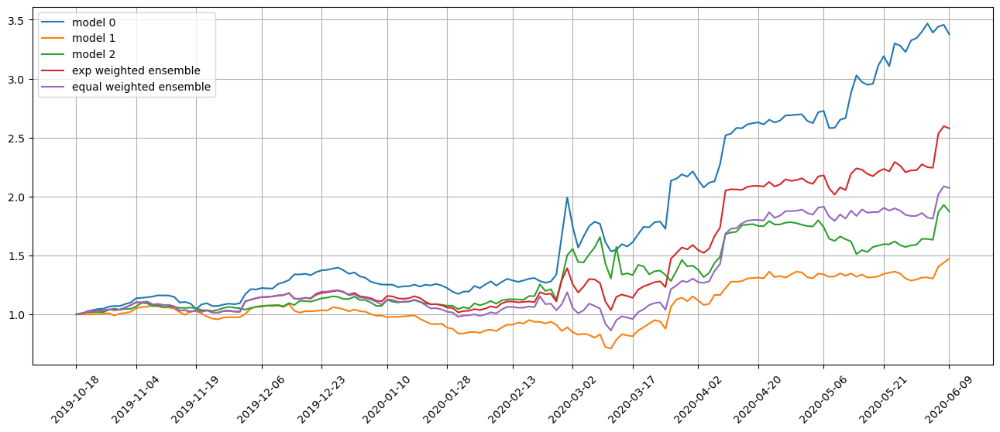

Standardization data are from 2019-08-21 to 2020-01-13
Training data are from 2020-01-14 to 2020-06-05
Testing data are from 2020-05-11 to 2020-07-06
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 9 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0552 - val_loss: 0.0466 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0542 - val_loss: 0.0491 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0536 - val_loss: 0.0468 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0533 - val_loss: 0.0486 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0525 - val_loss: 0.0466 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0523 - val_loss: 0.0459 - lr: 0.0100
Epoch 7/500
146/146 [=

146/146 [==============================] - 1s 5ms/step - loss: 0.0502 - val_loss: 0.0462 - lr: 0.0050
Epoch 12/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0501 - val_loss: 0.0462 - lr: 0.0050
Epoch 13/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0498 - val_loss: 0.0462 - lr: 0.0050
Epoch 14/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0496 - val_loss: 0.0462 - lr: 0.0050
Epoch 15/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0491 - val_loss: 0.0457 - lr: 0.0025
Epoch 16/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0490 - val_loss: 0.0462 - lr: 0.0025
Epoch 17/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0489 - val_loss: 0.0456 - lr: 0.0025
Epoch 18/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0489 - val_loss: 0.0463 - lr: 0.0025
Epoch 19/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0488 - val_loss

top_stocks by model 2 to buy on 2020-06-15 are ['EVH', 'LBRDA', 'PSQ', 'SRNE', 'UL', 'BOIL', 'UNG', 'MRK', 'BDX', 'ZOM']
Total asset on 2020-06-16 will be 1.7898932670089838
It should be the same as 1.7898932670089867
top_stocks by return weighted ensemble to buy on 2020-06-15 are ['SRNE', 'NVS', 'LSXMA', 'ASML', 'MRK', 'UNG', 'GEF', 'MDT', 'SCO', 'BDX']
Total asset on 2020-06-16 will be 2.440209945215521
It should be the same as 2.4402099452155266
top_stocks by equal weighted ensemble to buy on 2020-06-15 are ['ZUO', 'LIN', 'ASML', 'DVAX', 'UNG', 'NVS', 'MDT', 'MRK', 'SCO', 'BDX']
Total asset on 2020-06-16 will be 1.9332432337953613
It should be the same as 1.9332432337953607
Testing data from 2020-05-18 to 2020-06-15 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2020-06-16 are ['PARR', 'RTX', 'LSXMK', 'WFC', 'MTG', 'SYY', 'MFA', 'RDN', 'PFGC', 'USFD']
Total asset on 2020-06-17 will be 3.2320725533540524
It should be the same as 3.2320725533540546
top_stocks by mo

top_stocks by model 1 to buy on 2020-06-24 are ['FXN', 'TWM', 'NG', 'DXD', 'TZA', 'VANI', 'RWM', 'SRTY', 'DOG', 'DRIP']
Total asset on 2020-06-25 will be 1.363058298733809
It should be the same as 1.3630582987338165
top_stocks by model 2 to buy on 2020-06-24 are ['M', 'XELA', 'ARCH', 'LC', 'CENN', 'TELL', 'DRIP', 'VANI', 'ZOM', 'JETS']
Total asset on 2020-06-25 will be 1.6207949881837838
It should be the same as 1.6207949881837866
top_stocks by return weighted ensemble to buy on 2020-06-24 are ['NOG', 'AGO', 'CENN', 'NG', 'LC', 'M', 'RGA', 'IVR', 'DRIP', 'VANI']
Total asset on 2020-06-25 will be 2.252285146034562
It should be the same as 2.25228514603457
top_stocks by equal weighted ensemble to buy on 2020-06-24 are ['CXW', 'XELA', 'LC', 'CENN', 'NG', 'RGA', 'M', 'IVR', 'DRIP', 'VANI']
Total asset on 2020-06-25 will be 1.7911406375836207
It should be the same as 1.7911406375836187
Testing data from 2020-05-28 to 2020-06-24 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy

Total asset on 2020-07-07 will be 1.456089402420971
It should be the same as 1.4560894024209794
top_stocks by model 2 to buy on 2020-07-06 are ['SRTY', 'SPDN', 'TZA', 'DXD', 'SDS', 'SH', 'DOG', 'RWM', 'TWM', 'JETS']
Total asset on 2020-07-07 will be 1.6499794055041408
It should be the same as 1.6499794055041448
top_stocks by return weighted ensemble to buy on 2020-07-06 are ['DOG', 'SPDN', 'DXD', 'SDS', 'SH', 'TZA', 'TWM', 'RWM', 'TOON', 'JETS']
Total asset on 2020-07-07 will be 2.2414689090366533
It should be the same as 2.2414689090366595
top_stocks by equal weighted ensemble to buy on 2020-07-06 are ['SPXU', 'DOG', 'DXD', 'TZA', 'SDS', 'SPDN', 'SH', 'TWM', 'RWM', 'JETS']
Total asset on 2020-07-07 will be 1.879513458364989
It should be the same as 1.8795134583649882
Testing data from 2020-06-08 to 2020-07-06 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2020-07-07 are ['ALLY', 'EXP', 'HTGC', 'WFC', 'COF', 'VVV', 'DRI', 'TWO', 'APT', 'ZOM']
Total asset on 2020-07-

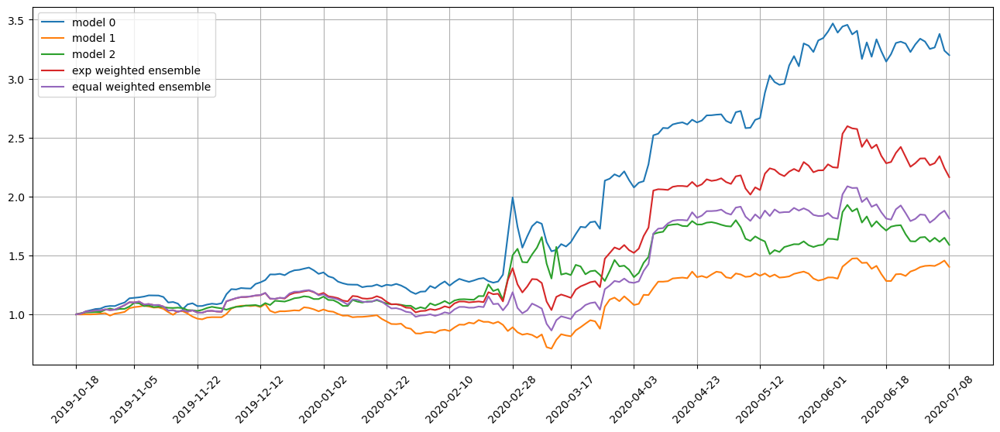

Standardization data are from 2019-09-19 to 2020-02-11
Training data are from 2020-02-12 to 2020-07-06
Testing data are from 2020-06-09 to 2020-08-03
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 10 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0515 - val_loss: 0.0433 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0501 - val_loss: 0.0439 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0495 - val_loss: 0.0454 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0492 - val_loss: 0.0443 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0489 - val_loss: 0.0445 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0488 - val_loss: 0.0442 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 4ms/step - loss: 0.0465 - val_loss: 0.0427 - lr: 0.0025
Epoch 18/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0465 - val_loss: 0.0436 - lr: 0.0025
Epoch 19/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0465 - val_loss: 0.0432 - lr: 0.0025
Epoch 20/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0463 - val_loss: 0.0428 - lr: 0.0012
Epoch 21/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0462 - val_loss: 0.0432 - lr: 0.0012
Epoch 22/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0462 - val_loss: 0.0431 - lr: 0.0012
Epoch 23/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0462 - val_loss: 0.0431 - lr: 0.0012
Epoch 24/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0462 - val_loss: 0.0432 - lr: 0.0012
Epoch 25/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0461 - val_loss

Total asset on 2020-07-15 will be 1.8950388797050455
It should be the same as 1.8950388797050446
Testing data from 2020-06-16 to 2020-07-14 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2020-07-15 are ['IDEX', 'SPXU', 'QID', 'SQQQ', 'GEVO', 'PSEC', 'AHT', 'DRIP', 'JETS', 'MFA']
Total asset on 2020-07-16 will be 3.3799989145293137
It should be the same as 3.37999891452932
top_stocks by model 1 to buy on 2020-07-15 are ['GSAT', 'SPXS', 'PSEC', 'QID', 'GEVO', 'SQQQ', 'PSQ', 'SPXU', 'TOON', 'JETS']
Total asset on 2020-07-16 will be 1.4760515455600558
It should be the same as 1.476051545560066
top_stocks by model 2 to buy on 2020-07-15 are ['SCO', 'BTU', 'DBA', 'BVN', 'MLKN', 'ORA', 'CZR', 'RYTM', 'ZD', 'JJSF']
Total asset on 2020-07-16 will be 1.5855415909741957
It should be the same as 1.585541590974199
top_stocks by return weighted ensemble to buy on 2020-07-15 are ['JJSF', 'SPXU', 'SQQQ', 'QID', 'PSQ', 'AHT', 'PSEC', 'MFA', 'GEVO', 'JETS']
Total asset on 2020-07-16 

Testing data from 2020-06-25 to 2020-07-23 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2020-07-24 are ['ZD', 'AER', 'SABR', 'ARMK', 'CIM', 'PLAY', 'NYMT', 'DRIP', 'JETS', 'MFA']
Total asset on 2020-07-27 will be 3.2058937709412554
It should be the same as 3.2058937709412607
top_stocks by model 1 to buy on 2020-07-24 are ['SPXS', 'SDOW', 'SPXU', 'FAZ', 'ZD', 'PGRE', 'WB', 'SRTY', 'TZA', 'AHT']
Total asset on 2020-07-27 will be 1.4893881290552704
It should be the same as 1.4893881290552795
top_stocks by model 2 to buy on 2020-07-24 are ['AMC', 'SPDN', 'SDS', 'DXD', 'AER', 'SDOW', 'EAT', 'GNW', 'WB', 'ALT']
Total asset on 2020-07-27 will be 1.6308921260374
It should be the same as 1.6308921260374034
top_stocks by return weighted ensemble to buy on 2020-07-24 are ['HST', 'ARMK', 'AAT', 'XHR', 'PGRE', 'GNW', 'AHT', 'JETS', 'ZD', 'AER']
Total asset on 2020-07-27 will be 2.200185488816561
It should be the same as 2.200185488816569
top_stocks by equal weighted ensemble t

Total asset on 2020-08-04 will be 1.8812680889381734
It should be the same as 1.8812680889381732
Testing data from 2020-07-07 to 2020-08-03 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2020-08-04 are ['CIM', 'ARMK', 'AHT', 'SABR', 'JETS', 'EPR', 'NYMT', 'KODK', 'MFA', 'KNDI']
Total asset on 2020-08-05 will be 3.1797656598341355
It should be the same as 3.1797656598341395
top_stocks by model 1 to buy on 2020-08-04 are ['SVC', 'IVR', 'JETS', 'USFD', 'AWI', 'CCL', 'SABR', 'PK', 'AHT', 'KODK']
Total asset on 2020-08-05 will be 1.5840809360426074
It should be the same as 1.5840809360426151
top_stocks by model 2 to buy on 2020-08-04 are ['SDOW', 'SITC', 'AWI', 'AER', 'DRI', 'CCL', 'LW', 'BCO', 'RCL', 'KODK']
Total asset on 2020-08-05 will be 1.683521854025622
It should be the same as 1.6835218540256238
top_stocks by return weighted ensemble to buy on 2020-08-04 are ['MFA', 'IVR', 'HXL', 'AWI', 'LW', 'SABR', 'USFD', 'AHT', 'PK', 'KODK']
Total asset on 2020-08-05 will be 

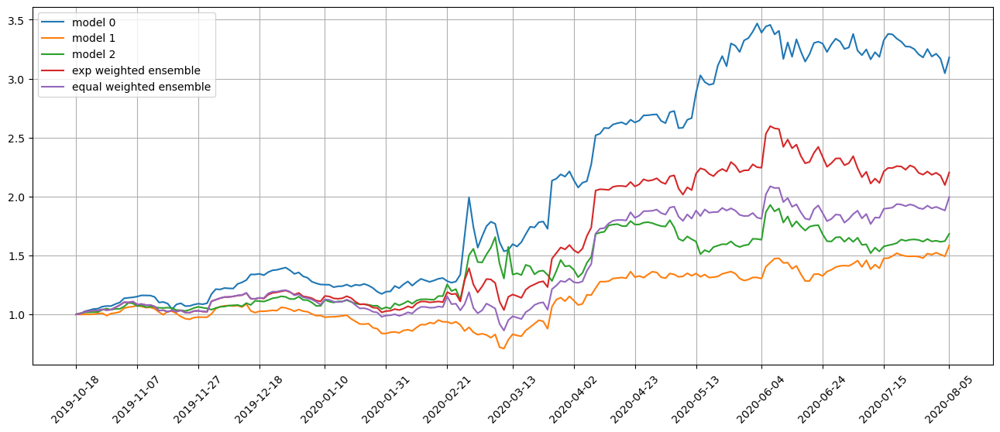

Standardization data are from 2019-10-17 to 2020-03-11
Training data are from 2020-03-12 to 2020-08-03
Testing data are from 2020-07-08 to 2020-08-31
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 11 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0396 - val_loss: 0.0281 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0381 - val_loss: 0.0279 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0375 - val_loss: 0.0280 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0373 - val_loss: 0.0285 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0371 - val_loss: 0.0278 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0367 - val_loss: 0.0277 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 4ms/step - loss: 0.0347 - val_loss: 0.0280 - lr: 0.0010
Epoch 26/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0347 - val_loss: 0.0283 - lr: 0.0010
Epoch 27/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0346 - val_loss: 0.0281 - lr: 0.0010
Epoch 28/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0346 - val_loss: 0.0283 - lr: 0.0010
Epoch 29/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0346 - val_loss: 0.0282 - lr: 0.0010
Epoch 30/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0346 - val_loss: 0.0283 - lr: 0.0010
Epoch 31/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0346 - val_loss: 0.0283 - lr: 0.0010
Epoch 32/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0346 - val_loss: 0.0282 - lr: 0.0010
Epoch 33/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0346 - val_loss

top_stocks by return weighted ensemble to buy on 2020-08-06 are ['HPP', 'HSBC', 'BCO', 'CVI', 'AVA', 'BKD', 'SNV', 'BKU', 'MARA', 'KODK']
Total asset on 2020-08-07 will be 2.209720351826105
It should be the same as 2.209720351826111
top_stocks by equal weighted ensemble to buy on 2020-08-06 are ['MATX', 'VLO', 'HSBC', 'SNV', 'BKD', 'BKU', 'CVI', 'KNDI', 'MARA', 'KODK']
Total asset on 2020-08-07 will be 2.015553565396396
It should be the same as 2.015553565396396
Testing data from 2020-07-10 to 2020-08-06 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2020-08-07 are ['TCBI', 'CORT', 'CUBI', 'ENR', 'ACLS', 'ODP', 'GOLF', 'OIH', 'NBR', 'KODK']
Total asset on 2020-08-10 will be 3.1039435217440854
It should be the same as 3.103943521744089
top_stocks by model 1 to buy on 2020-08-07 are ['FE', 'TDOC', 'ALT', 'NAVI', 'ASX', 'ACLS', 'ENR', 'GOLF', 'KODK', 'KNDI']
Total asset on 2020-08-10 will be 1.5170477751250029
It should be the same as 1.5170477751250109
top_stocks by m

Total asset on 2020-08-18 will be 2.1086359903382306
It should be the same as 2.1086359903382372
top_stocks by equal weighted ensemble to buy on 2020-08-17 are ['CSCO', 'BPOP', 'NMIH', 'ZD', 'ICUI', 'FHB', 'CRS', 'CUBI', 'MCRB', 'NBR']
Total asset on 2020-08-18 will be 1.8328538601788937
It should be the same as 1.8328538601788953
Testing data from 2020-07-21 to 2020-08-17 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2020-08-18 are ['AIR', 'CUBI', 'BGC', 'PLAY', 'HA', 'ZD', 'DAL', 'LUV', 'CHEF', 'DFEN']
Total asset on 2020-08-19 will be 3.076280963197625
It should be the same as 3.07628096319763
top_stocks by model 1 to buy on 2020-08-18 are ['HXL', 'AER', 'JJSF', 'HA', 'BGC', 'GPI', 'DFEN', 'CHEF', 'SEM', 'MCRB']
Total asset on 2020-08-19 will be 1.4325799769715741
It should be the same as 1.432579976971582
top_stocks by model 2 to buy on 2020-08-18 are ['PARR', 'ICLR', 'WRK', 'OMC', 'SUNWQ', 'TTE', 'MDU', 'SEM', 'MARA', 'MCRB']
Total asset on 2020-08-19 will be 

Testing data from 2020-07-30 to 2020-08-26 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2020-08-27 are ['PODD', 'GGAL', 'OUNZ', 'SBAC', 'BWXT', 'AAPL', 'VCEL', 'ZD', 'CNK', 'GNW']
Total asset on 2020-08-28 will be 3.1133552373576907
It should be the same as 3.1133552373576965
top_stocks by model 1 to buy on 2020-08-27 are ['HII', 'PAA', 'AFG', 'PFGC', 'CVBF', 'HSBC', 'HDB', 'POR', 'ZD', 'KODK']
Total asset on 2020-08-28 will be 1.470635463301887
It should be the same as 1.4706354633018959
top_stocks by model 2 to buy on 2020-08-27 are ['FL', 'CNK', 'HSBC', 'BMA', 'BWXT', 'HDB', 'GGAL', 'POR', 'KNDI', 'KODK']
Total asset on 2020-08-28 will be 1.6105117004857255
It should be the same as 1.6105117004857288
top_stocks by return weighted ensemble to buy on 2020-08-27 are ['VCEL', 'PFGC', 'HDB', 'KODK', 'GGAL', 'BWXT', 'ZD', 'POR', 'CNK', 'GNW']
Total asset on 2020-08-28 will be 2.104570500310023
It should be the same as 2.1045705003100283
top_stocks by equal weighted e

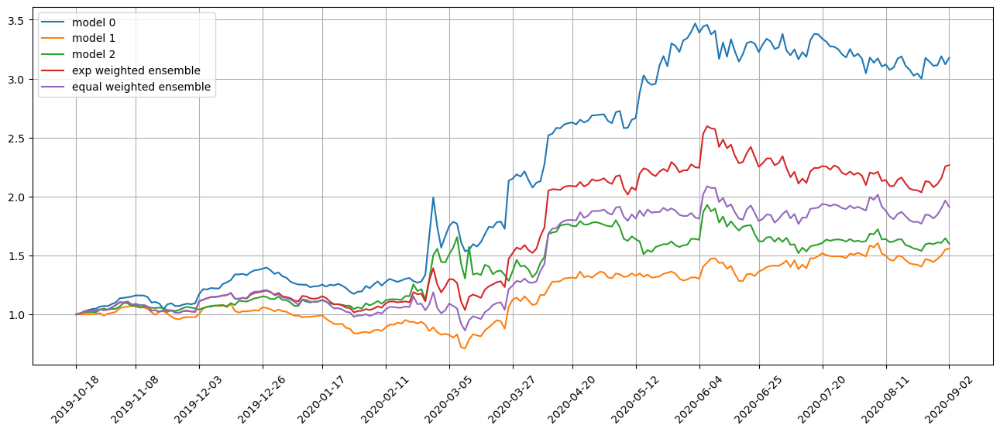

Standardization data are from 2019-11-14 to 2020-04-08
Training data are from 2020-04-09 to 2020-08-31
Testing data are from 2020-08-05 to 2020-09-29
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 12 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0338 - val_loss: 0.0236 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0330 - val_loss: 0.0234 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0329 - val_loss: 0.0238 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0327 - val_loss: 0.0235 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0326 - val_loss: 0.0241 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0324 - val_loss: 0.0235 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 4ms/step - loss: 0.0307 - val_loss: 0.0230 - lr: 0.0010
Epoch 31/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0306 - val_loss: 0.0229 - lr: 0.0010
Epoch 32/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0306 - val_loss: 0.0231 - lr: 0.0010
Epoch 32: early stopping
Epoch 1/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0337 - val_loss: 0.0233 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0330 - val_loss: 0.0232 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0330 - val_loss: 0.0240 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0327 - val_loss: 0.0239 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0325 - val_loss: 0.0233 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss

Total asset on 2020-09-08 will be 1.4718903073547613
It should be the same as 1.47189030735477
top_stocks by model 2 to buy on 2020-09-04 are ['BMO', 'PSX', 'SSTK', 'XRAY', 'SID', 'OIH', 'ESNT', 'LNT', 'GNW', 'GOGL']
Total asset on 2020-09-08 will be 1.5479052623583363
It should be the same as 1.5479052623583396
top_stocks by return weighted ensemble to buy on 2020-09-04 are ['BMO', 'BHF', 'FHB', 'EXK', 'WTFC', 'ANF', 'KNDI', 'KODK', 'AGO', 'GNW']
Total asset on 2020-09-08 will be 2.152975058454579
It should be the same as 2.1529750584545844
top_stocks by equal weighted ensemble to buy on 2020-09-04 are ['LNT', 'BMO', 'ANF', 'BHF', 'FHB', 'EXK', 'WTFC', 'GOGL', 'AGO', 'GNW']
Total asset on 2020-09-08 will be 1.8749254265325752
It should be the same as 1.8749254265325774
Testing data from 2020-08-10 to 2020-09-04 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2020-09-08 are ['AZPN', 'ALT', 'IBN', 'PII', 'MSTR', 'ICUI', 'KNDI', 'KODK', 'MCRB', 'MARA']
Total asset on 2

top_stocks by model 1 to buy on 2020-09-16 are ['BCO', 'AAL', 'QFIN', 'VRE', 'GEVO', 'BKE', 'MARA', 'LVS', 'BYON', 'KNDI']
Total asset on 2020-09-17 will be 1.6078907626678953
It should be the same as 1.607890762667905
top_stocks by model 2 to buy on 2020-09-16 are ['CZR', 'CINF', 'BKU', 'TNL', 'RTX', 'HWM', 'BKE', 'SBH', 'WYNN', 'LVS']
Total asset on 2020-09-17 will be 1.5289670945722047
It should be the same as 1.5289670945722091
top_stocks by return weighted ensemble to buy on 2020-09-16 are ['KBR', 'BKE', 'VRNT', 'AAL', 'WYNN', 'VRE', 'MARA', 'KNDI', 'BYON', 'LVS']
Total asset on 2020-09-17 will be 2.274731417694813
It should be the same as 2.2747314176948183
top_stocks by equal weighted ensemble to buy on 2020-09-16 are ['RTX', 'VRNT', 'KBR', 'HWM', 'TNL', 'BKE', 'VRE', 'WYNN', 'BYON', 'LVS']
Total asset on 2020-09-17 will be 1.9786001897210277
It should be the same as 1.9786001897210304
Testing data from 2020-08-19 to 2020-09-16 have shape (2295, 20, 30), (2295,)
top_stocks by mo

top_stocks by model 1 to buy on 2020-09-25 are ['AR', 'SUNWQ', 'ECPG', 'GEVO', 'RILY', 'SRNE', 'KNDI', 'MCRB', 'MARA', 'KODK']
Total asset on 2020-09-28 will be 1.5285432186578485
It should be the same as 1.5285432186578585
top_stocks by model 2 to buy on 2020-09-25 are ['HESM', 'SSNC', 'SVXY', 'HDB', 'TAK', 'DBO', 'QFIN', 'COO', 'OIH', 'KODK']
Total asset on 2020-09-28 will be 1.4257901726210205
It should be the same as 1.4257901726210256
top_stocks by return weighted ensemble to buy on 2020-09-25 are ['SFIX', 'SRNE', 'BYON', 'ARKQ', 'GBX', 'RILY', 'MARA', 'KNDI', 'MCRB', 'KODK']
Total asset on 2020-09-28 will be 2.3170873256730116
It should be the same as 2.317087325673016
top_stocks by equal weighted ensemble to buy on 2020-09-25 are ['SMFG', 'MARA', 'MCRB', 'SRNE', 'OIH', 'ARKQ', 'GBX', 'KNDI', 'RILY', 'KODK']
Total asset on 2020-09-28 will be 1.904256887087233
It should be the same as 1.904256887087237
Testing data from 2020-08-28 to 2020-09-25 have shape (2295, 20, 30), (2295,)
t

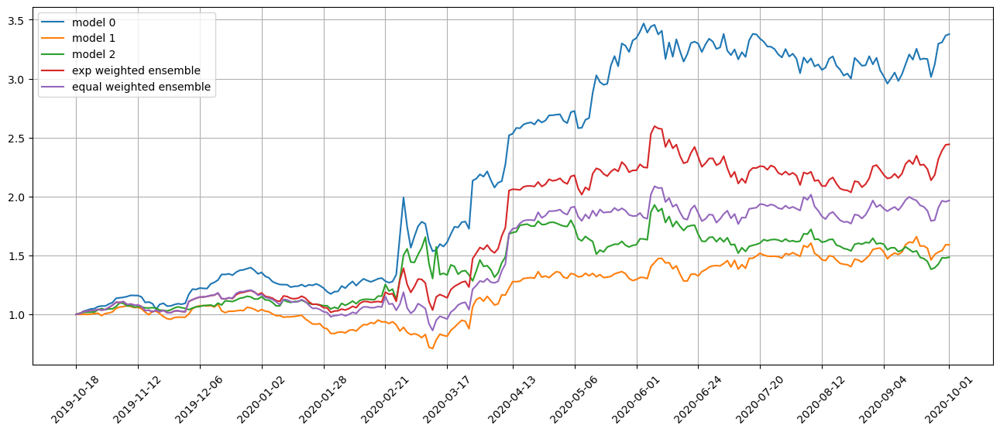

Standardization data are from 2019-12-13 to 2020-05-07
Training data are from 2020-05-08 to 2020-09-29
Testing data are from 2020-09-02 to 2020-10-27
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 13 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0290 - val_loss: 0.0308 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0285 - val_loss: 0.0300 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0284 - val_loss: 0.0307 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0282 - val_loss: 0.0302 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0280 - val_loss: 0.0304 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0280 - val_loss: 0.0302 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 4ms/step - loss: 0.0267 - val_loss: 0.0311 - lr: 0.0012
Epoch 20/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0266 - val_loss: 0.0312 - lr: 0.0012
Epoch 21/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0267 - val_loss: 0.0311 - lr: 0.0012
Epoch 22/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0266 - val_loss: 0.0313 - lr: 0.0012
Epoch 22: early stopping
46/46 [==============================] - 0s 3ms/step
Model 0 training loss 0.031848885118961334
12/12 [==============================] - 0s 3ms/step
Model 0 test loss 0.036110080778598785
46/46 [==============================] - 0s 4ms/step
Model 1 training loss 0.030359741300344467
12/12 [==============================] - 0s 2ms/step
Model 1 test loss 0.034250933676958084
46/46 [==============================] - 0s 3ms/step
Model 2 training loss 0.0309095811098814
12/12 [==============================] - 0s 2ms/step
Model

Total asset on 2020-10-09 will be 2.119946444456704
It should be the same as 2.1199464444567084
Testing data from 2020-09-11 to 2020-10-08 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2020-10-09 are ['GOOG', 'SIVR', 'PPLT', 'CAL', 'MLKN', 'PSLV', 'IQ', 'IART', 'AMGN', 'UNG']
Total asset on 2020-10-12 will be 3.761562228352205
It should be the same as 3.7615622283522137
top_stocks by model 1 to buy on 2020-10-09 are ['TQQQ', 'SHO', 'QQQ', 'XBI', 'ADBE', 'QLD', 'FI', 'IART', 'DOMO', 'LABU']
Total asset on 2020-10-12 will be 1.6933182244235787
It should be the same as 1.6933182244235883
top_stocks by model 2 to buy on 2020-10-09 are ['ESRT', 'LABU', 'IQ', 'SHO', 'EVRI', 'IART', 'UNG', 'MAR', 'MLKN', 'SAVA']
Total asset on 2020-10-12 will be 1.5712534656224808
It should be the same as 1.571253465622486
top_stocks by return weighted ensemble to buy on 2020-10-09 are ['QQQ', 'QLD', 'TQQQ', 'AMGN', 'SHO', 'SAVA', 'IQ', 'LABU', 'UNG', 'IART']
Total asset on 2020-10-12 wil

top_stocks by model 0 to buy on 2020-10-20 are ['MAR', 'ILMN', 'MUR', 'UHS', 'RL', 'NKE', 'TCOM', 'MLCO', 'MSTR', 'MDRX']
Total asset on 2020-10-21 will be 3.7791117311386135
It should be the same as 3.779111731138622
top_stocks by model 1 to buy on 2020-10-20 are ['MSTR', 'RELX', 'PCRX', 'MAR', 'JNJ', 'GWRE', 'ADC', 'RYAAY', 'GSK', 'NKE']
Total asset on 2020-10-21 will be 1.6943510658739607
It should be the same as 1.694351065873969
top_stocks by model 2 to buy on 2020-10-20 are ['RL', 'ILMN', 'HTH', 'SNN', 'RELX', 'RYAAY', 'GSK', 'NKE', 'TCOM', 'MDRX']
Total asset on 2020-10-21 will be 1.566786850877805
It should be the same as 1.5667868508778102
top_stocks by return weighted ensemble to buy on 2020-10-20 are ['ADC', 'ILMN', 'RELX', 'MAR', 'TCOM', 'MSTR', 'GSK', 'RYAAY', 'MDRX', 'NKE']
Total asset on 2020-10-21 will be 2.63159887901034
It should be the same as 2.6315988790103466
top_stocks by equal weighted ensemble to buy on 2020-10-20 are ['ADC', 'MAR', 'ILMN', 'RELX', 'TCOM', 'MST

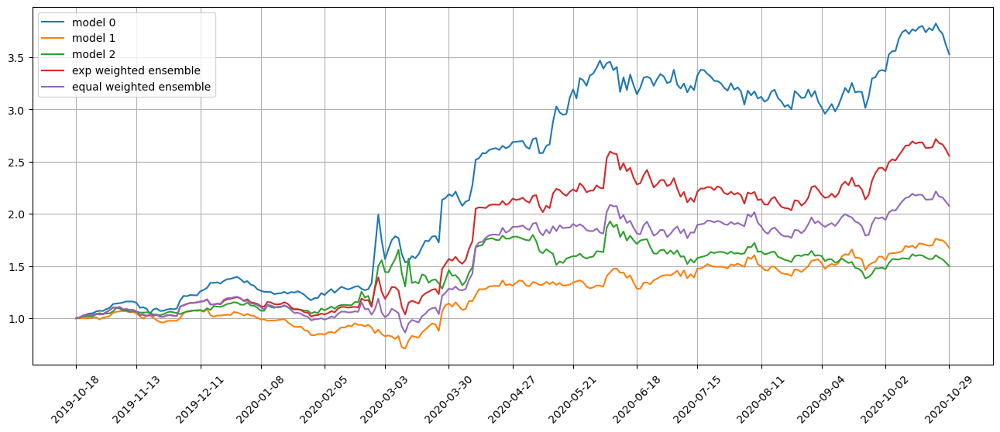

Standardization data are from 2020-01-14 to 2020-06-05
Training data are from 2020-06-08 to 2020-10-27
Testing data are from 2020-10-01 to 2020-11-24
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 14 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0264 - val_loss: 0.0271 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0261 - val_loss: 0.0272 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0258 - val_loss: 0.0272 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0257 - val_loss: 0.0278 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0257 - val_loss: 0.0273 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0254 - val_loss: 0.0268 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 4ms/step - loss: 0.0244 - val_loss: 0.0280 - lr: 0.0050
Epoch 19/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0240 - val_loss: 0.0275 - lr: 0.0025
Epoch 20/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0239 - val_loss: 0.0275 - lr: 0.0025
Epoch 21/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0240 - val_loss: 0.0281 - lr: 0.0025
Epoch 22/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0239 - val_loss: 0.0281 - lr: 0.0025
Epoch 23/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0239 - val_loss: 0.0275 - lr: 0.0025
Epoch 24/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0237 - val_loss: 0.0275 - lr: 0.0012
Epoch 25/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0237 - val_loss: 0.0277 - lr: 0.0012
Epoch 26/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0237 - val_loss

Total asset on 2020-11-05 will be 2.21372135474168
It should be the same as 2.213721354741687
Testing data from 2020-10-08 to 2020-11-04 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2020-11-05 are ['BBD', 'HELE', 'OZK', 'ZTO', 'UHS', 'SNA', 'ARCH', 'AXS', 'KOLD', 'HSBC']
Total asset on 2020-11-06 will be 3.909691237377758
It should be the same as 3.9096912373777677
top_stocks by model 1 to buy on 2020-11-05 are ['BKU', 'AXS', 'WAFD', 'EBAY', 'HOMB', 'SBSW', 'ONB', 'LAUR', 'ORA', 'NOK']
Total asset on 2020-11-06 will be 1.880403524975426
It should be the same as 1.8804035249754352
top_stocks by model 2 to buy on 2020-11-05 are ['PBA', 'SNA', 'DPST', 'CLDX', 'VTNR', 'UHS', 'UNG', 'SUNWQ', 'GEVO', 'KODK']
Total asset on 2020-11-06 will be 1.5918734785809705
It should be the same as 1.5918734785809763
top_stocks by return weighted ensemble to buy on 2020-11-05 are ['ARCH', 'FFIN', 'AIN', 'LAUR', 'BBVA', 'ONB', 'AXS', 'UHS', 'NOK', 'KOLD']
Total asset on 2020-11-06 wil

Testing data from 2020-10-19 to 2020-11-13 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2020-11-16 are ['TQQQ', 'VRNS', 'XLC', 'QLD', 'ARKW', 'SCHG', 'IGV', 'MCHI', 'FDN', 'SUPN']
Total asset on 2020-11-17 will be 3.949278622869104
It should be the same as 3.949278622869116
top_stocks by model 1 to buy on 2020-11-16 are ['CCK', 'CDNS', 'ARCT', 'BIO', 'MNST', 'FIVN', 'FOXF', 'TWOU', 'POOL', 'MKTX']
Total asset on 2020-11-17 will be 2.0021813398037924
It should be the same as 2.0021813398038018
top_stocks by model 2 to buy on 2020-11-16 are ['IGV', 'QLD', 'FDN', 'ITB', 'SCHG', 'NAIL', 'SOXL', 'TWOU', 'GEVO', 'KODK']
Total asset on 2020-11-17 will be 1.818798648116078
It should be the same as 1.8187986481160843
top_stocks by return weighted ensemble to buy on 2020-11-16 are ['TQQQ', 'QLD', 'NAIL', 'MKTX', 'SCHG', 'IGV', 'CDNS', 'FIVN', 'FDN', 'TWOU']
Total asset on 2020-11-17 will be 3.158855145817165
It should be the same as 3.1588551458171743
top_stocks by equal we

Total asset on 2020-11-27 will be 4.0765401909695775
It should be the same as 4.07654019096959
top_stocks by model 1 to buy on 2020-11-25 are ['PRGO', 'GRFS', 'GMED', 'ASB', 'MUFG', 'FNB', 'SMFG', 'BAX', 'ORA', 'UBSI']
Total asset on 2020-11-27 will be 2.0287844063155656
It should be the same as 2.0287844063155758
top_stocks by model 2 to buy on 2020-11-25 are ['BDX', 'JNUG', 'BAX', 'TREE', 'FE', 'PRGO', 'ORA', 'SUNWQ', 'GEVO', 'KODK']
Total asset on 2020-11-27 will be 2.111436178678766
It should be the same as 2.1114361786787716
top_stocks by return weighted ensemble to buy on 2020-11-25 are ['NYCB', 'SMFG', 'GRFS', 'MUFG', 'FE', 'TREE', 'BAX', 'PRGO', 'GMED', 'ORA']
Total asset on 2020-11-27 will be 3.266114514014208
It should be the same as 3.26611451401422
top_stocks by equal weighted ensemble to buy on 2020-11-25 are ['NYCB', 'SMFG', 'GRFS', 'MUFG', 'TREE', 'FE', 'BAX', 'GMED', 'PRGO', 'ORA']
Total asset on 2020-11-27 will be 2.698015132067396
It should be the same as 2.6980151320

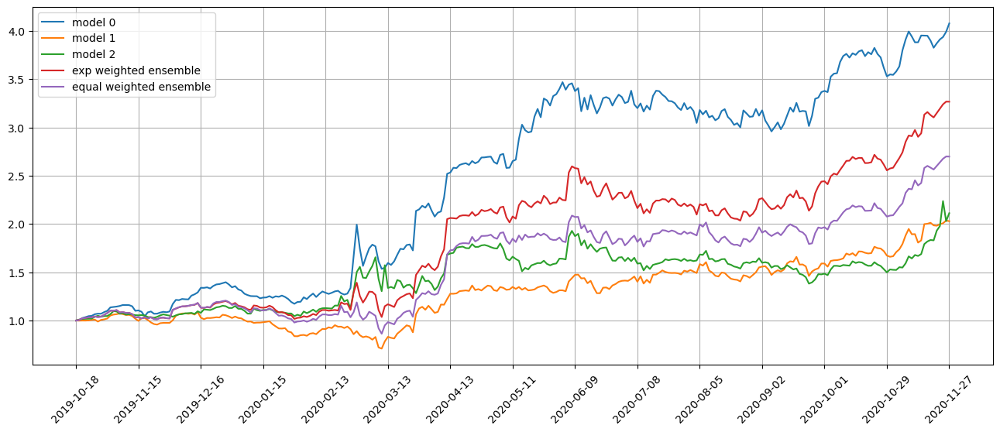

Standardization data are from 2020-02-12 to 2020-07-06
Training data are from 2020-07-07 to 2020-11-24
Testing data are from 2020-10-29 to 2020-12-23
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 15 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0258 - val_loss: 0.0397 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0255 - val_loss: 0.0385 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0253 - val_loss: 0.0401 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0251 - val_loss: 0.0396 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0250 - val_loss: 0.0384 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0249 - val_loss: 0.0412 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 4ms/step - loss: 0.0236 - val_loss: 0.0399 - lr: 0.0012
Epoch 21/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0236 - val_loss: 0.0398 - lr: 0.0012
Epoch 22/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0235 - val_loss: 0.0405 - lr: 0.0010
Epoch 23/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0235 - val_loss: 0.0399 - lr: 0.0010
Epoch 24/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0235 - val_loss: 0.0400 - lr: 0.0010
Epoch 25/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0234 - val_loss: 0.0401 - lr: 0.0010
Epoch 26/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0235 - val_loss: 0.0401 - lr: 0.0010
Epoch 27/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0234 - val_loss: 0.0401 - lr: 0.0010
Epoch 28/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0234 - val_loss

Total asset on 2020-12-04 will be 2.7682360737832123
It should be the same as 2.7682360737832203
Testing data from 2020-11-05 to 2020-12-03 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2020-12-04 are ['CSGS', 'TBT', 'NEU', 'BB', 'UNG', 'WLY', 'TBF', 'HCSG', 'BOIL', 'GFF']
Total asset on 2020-12-07 will be 4.213770899677374
It should be the same as 4.213770899677387
top_stocks by model 1 to buy on 2020-12-04 are ['GLNG', 'TBT', 'FFIN', 'HOMB', 'VRE', 'CVBF', 'SMFG', 'SFBS', 'UBSI', 'AIV']
Total asset on 2020-12-07 will be 2.0778474929010415
It should be the same as 2.0778474929010513
top_stocks by model 2 to buy on 2020-12-04 are ['LIVN', 'UNG', 'CVBF', 'HCSG', 'TBF', 'BOIL', 'BIL', 'TBT', 'TMV', 'DDS']
Total asset on 2020-12-07 will be 2.134745256865129
It should be the same as 2.134745256865137
top_stocks by return weighted ensemble to buy on 2020-12-04 are ['CVBF', 'UBSI', 'NEU', 'UNG', 'AIV', 'TMV', 'HCSG', 'BOIL', 'TBF', 'TBT']
Total asset on 2020-12-07 will b

top_stocks by model 1 to buy on 2020-12-15 are ['USFR', 'IAG', 'TREE', 'CAKE', 'MCHI', 'EQX', 'AG', 'TFLO', 'BURL', 'CHTR']
Total asset on 2020-12-16 will be 2.0745110022667355
It should be the same as 2.074511002266747
top_stocks by model 2 to buy on 2020-12-15 are ['NOG', 'EW', 'PBF', 'WYNN', 'AXNX', 'LNTH', 'WU', 'BLKB', 'MSI', 'CRI']
Total asset on 2020-12-16 will be 2.023800007156785
It should be the same as 2.023800007156793
top_stocks by return weighted ensemble to buy on 2020-12-15 are ['TFLO', 'BURL', 'AXNX', 'WU', 'WYNN', 'EW', 'BLKB', 'LNTH', 'CRI', 'CENN']
Total asset on 2020-12-16 will be 3.1737065067181858
It should be the same as 3.1737065067182004
top_stocks by equal weighted ensemble to buy on 2020-12-15 are ['WTM', 'CMPR', 'AXNX', 'EW', 'WU', 'WYNN', 'BLKB', 'LNTH', 'CRI', 'CENN']
Total asset on 2020-12-16 will be 2.6163126052946053
It should be the same as 2.616312605294612
Testing data from 2020-11-17 to 2020-12-15 have shape (2295, 20, 30), (2295,)
top_stocks by mo

top_stocks by model 1 to buy on 2020-12-24 are ['TECL', 'AIV', 'LII', 'EA', 'HSBC', 'VRSK', 'BZUN', 'SNY', 'UNG', 'KNX']
Total asset on 2020-12-28 will be 2.1531290756475476
It should be the same as 2.1531290756475614
top_stocks by model 2 to buy on 2020-12-24 are ['BIL', 'DLR', 'GSHD', 'ROL', 'SITE', 'HSBC', 'DRIP', 'NIO', 'EGP', 'APPS']
Total asset on 2020-12-28 will be 2.0390220553438407
It should be the same as 2.039022055343848
top_stocks by return weighted ensemble to buy on 2020-12-24 are ['EGP', 'APPS', 'SITE', 'PPLT', 'CSGP', 'ROL', 'HSBC', 'VRSK', 'TECL', 'KNX']
Total asset on 2020-12-28 will be 3.2918046135049512
It should be the same as 3.2918046135049646
top_stocks by equal weighted ensemble to buy on 2020-12-24 are ['PPLT', 'EGP', 'CSGP', 'SITE', 'HSBC', 'VRSK', 'ROL', 'TECL', 'APPS', 'KNX']
Total asset on 2020-12-28 will be 2.701754678949101
It should be the same as 2.701754678949107
Model 0 changed 15.687060703020952 percent from 2020-07-08 to 2020-12-28
Model 1 changed

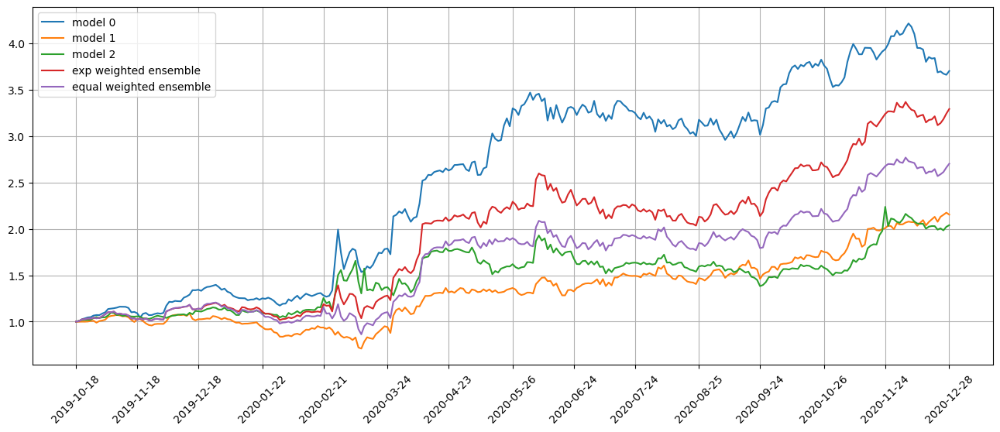

Standardization data are from 2020-03-12 to 2020-08-03
Training data are from 2020-08-04 to 2020-12-23
Testing data are from 2020-11-27 to 2021-01-25
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 16 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0277 - val_loss: 0.0252 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0271 - val_loss: 0.0253 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0269 - val_loss: 0.0249 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0267 - val_loss: 0.0253 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0266 - val_loss: 0.0252 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0265 - val_loss: 0.0255 - lr: 0.0100
Epoch 7/500
146/146 [

46/46 [==============================] - 0s 3ms/step
Model 0 training loss 0.03055483102798462
12/12 [==============================] - 0s 3ms/step
Model 0 test loss 0.035847265273332596
46/46 [==============================] - 0s 3ms/step
Model 1 training loss 0.03305235132575035
12/12 [==============================] - 0s 2ms/step
Model 1 test loss 0.03617509454488754
46/46 [==============================] - 0s 4ms/step
Model 2 training loss 0.031859032809734344
12/12 [==============================] - 0s 4ms/step
Model 2 test loss 0.03652888163924217
Correlations between old and new weights
0.9899208222421406
0.9931874329226201
0.996575742728628
0.9871544885524806
0.9988549954949343
0.9906132248084657
Weight of model 0 is 0.27820899246264297
Weight of model 1 is 0.406265949298768
Weight of model 2 is 0.31552505823858895
Testing data from 2020-11-27 to 2020-12-24 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2020-12-28 are ['EQX', 'COP', 'PAAS', 'DQ', 'TCOM', 'AG

top_stocks by model 1 to buy on 2021-01-06 are ['INDB', 'CELH', 'IQ', 'APPS', 'NTLA', 'RIOT', 'EDIT', 'TWST', 'AIV', 'PACB']
Total asset on 2021-01-07 will be 2.167596427044134
It should be the same as 2.1675964270441477
top_stocks by model 2 to buy on 2021-01-06 are ['SBS', 'MCRB', 'CDNA', 'MGNI', 'MARA', 'RIOT', 'APPN', 'TWST', 'NOG', 'PACB']
Total asset on 2021-01-07 will be 2.0939869413642214
It should be the same as 2.0939869413642302
top_stocks by return weighted ensemble to buy on 2021-01-06 are ['CTAS', 'SBS', 'FRHC', 'VGR', 'TUP', 'AIV', 'NOG', 'RIOT', 'TWST', 'PACB']
Total asset on 2021-01-07 will be 3.2127190869566653
It should be the same as 3.212719086956678
top_stocks by equal weighted ensemble to buy on 2021-01-06 are ['NYT', 'SBS', 'FRHC', 'TUP', 'VGR', 'AIV', 'RIOT', 'NOG', 'TWST', 'PACB']
Total asset on 2021-01-07 will be 2.6210501492640685
It should be the same as 2.6210501492640734
Testing data from 2020-12-08 to 2021-01-06 have shape (2295, 20, 30), (2295,)
top_sto

top_stocks by model 0 to buy on 2021-01-15 are ['MHO', 'SSYS', 'BABA', 'UNG', 'GNW', 'QGEN', 'BOIL', 'ZOM', 'LLY', 'DDD']
Total asset on 2021-01-19 will be 3.771908118604557
It should be the same as 3.7719081186045735
top_stocks by model 1 to buy on 2021-01-15 are ['FCEL', 'ZOM', 'TPH', 'SUNWQ', 'RIOT', 'PLUG', 'GRWG', 'MARA', 'PACB', 'DDD']
Total asset on 2021-01-19 will be 2.6481458796690855
It should be the same as 2.6481458796691
top_stocks by model 2 to buy on 2021-01-15 are ['SSYS', 'RCKT', 'GRWG', 'PACB', 'GNW', 'MARA', 'DNLI', 'ZOM', 'LLY', 'DDD']
Total asset on 2021-01-19 will be 2.327729416264032
It should be the same as 2.327729416264041
top_stocks by return weighted ensemble to buy on 2021-01-15 are ['MARA', 'UNG', 'BOIL', 'SSYS', 'QGEN', 'GRWG', 'GNW', 'ZOM', 'LLY', 'DDD']
Total asset on 2021-01-19 will be 3.4187567690254403
It should be the same as 3.4187567690254537
top_stocks by equal weighted ensemble to buy on 2021-01-15 are ['TDY', 'UNG', 'BOIL', 'SSYS', 'GRWG', 'QGE

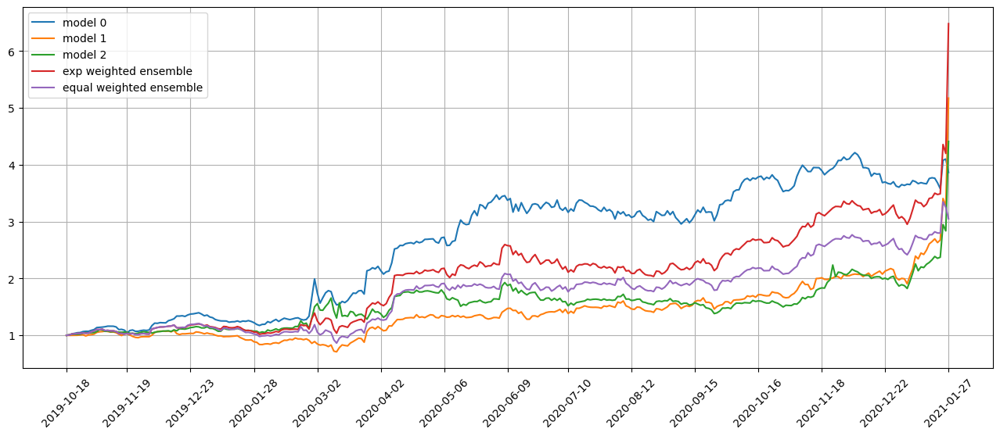

Standardization data are from 2020-04-09 to 2020-08-31
Training data are from 2020-09-01 to 2021-01-25
Testing data are from 2020-12-28 to 2021-02-23
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 17 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0259 - val_loss: 0.0330 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0255 - val_loss: 0.0333 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0253 - val_loss: 0.0328 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0252 - val_loss: 0.0331 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0250 - val_loss: 0.0328 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0249 - val_loss: 0.0330 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 4ms/step - loss: 0.0240 - val_loss: 0.0335 - lr: 0.0012
Epoch 21: early stopping
46/46 [==============================] - 0s 4ms/step
Model 0 training loss 0.03078153170645237
12/12 [==============================] - 0s 3ms/step
Model 0 test loss 0.03517436236143112
46/46 [==============================] - 0s 4ms/step
Model 1 training loss 0.03129272535443306
12/12 [==============================] - 0s 4ms/step
Model 1 test loss 0.0338977575302124
46/46 [==============================] - 0s 4ms/step
Model 2 training loss 0.031410448253154755
12/12 [==============================] - 0s 3ms/step
Model 2 test loss 0.03426628187298775
Correlations between old and new weights
0.9867036322301439
0.9874617737145894
0.9956085306175524
0.9882625821385773
0.9986222306533211
0.991943827015563
Weight of model 0 is 0.0778782175651645
Weight of model 1 is 0.6049711803148936
Weight of model 2 is 0.3171506021199419
Testing data from 2020-12-28 to 2021-01-2

top_stocks by model 0 to buy on 2021-02-04 are ['PACB', 'STT', 'NXPI', 'TRMB', 'FIZZ', 'ERIC', 'AMC', 'SUNWQ', 'EXPRQ', 'GME']
Total asset on 2021-02-05 will be 3.1702916702880155
It should be the same as 3.170291670288033
top_stocks by model 1 to buy on 2021-02-04 are ['ADI', 'STT', 'KWR', 'IXC', 'IMO', 'SU', 'SUNWQ', 'ERIC', 'VET', 'GME']
Total asset on 2021-02-05 will be 4.553549646675201
It should be the same as 4.553549646675217
top_stocks by model 2 to buy on 2021-02-04 are ['STT', 'CIEN', 'IXC', 'VET', 'FMC', 'IMO', 'BP', 'SU', 'TRMB', 'SUNWQ']
Total asset on 2021-02-05 will be 4.156189150958888
It should be the same as 4.156189150958901
top_stocks by return weighted ensemble to buy on 2021-02-04 are ['GME', 'CIEN', 'KWR', 'IXC', 'STT', 'IMO', 'TRMB', 'VET', 'SU', 'SUNWQ']
Total asset on 2021-02-05 will be 5.393966933809267
It should be the same as 5.393966933809281
top_stocks by equal weighted ensemble to buy on 2021-02-04 are ['NXPI', 'ADI', 'FMC', 'IMO', 'FIZZ', 'STT', 'VET',

Total asset on 2021-02-16 will be 2.8776379090507866
It should be the same as 2.8776379090507946
Testing data from 2021-01-15 to 2021-02-12 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2021-02-16 are ['AG', 'BCRX', 'HL', 'DNN', 'MSTR', 'BLOK', 'SENS', 'EXPRQ', 'AVXL', 'GME']
Total asset on 2021-02-17 will be 3.4301460348933133
It should be the same as 3.430146034893333
top_stocks by model 1 to buy on 2021-02-16 are ['AVAV', 'BLOK', 'CDE', 'QCOM', 'YINN', 'VRNT', 'HL', 'GSAT', 'MSTR', 'AVXL']
Total asset on 2021-02-17 will be 4.488394091382571
It should be the same as 4.488394091382589
top_stocks by model 2 to buy on 2021-02-16 are ['FSM', 'AEM', 'CDE', 'UL', 'HL', 'AG', 'WPM', 'VRNT', 'MSTR', 'AVXL']
Total asset on 2021-02-17 will be 4.099250417705016
It should be the same as 4.099250417705027
top_stocks by return weighted ensemble to buy on 2021-02-16 are ['FSM', 'QCOM', 'AG', 'GSAT', 'AEM', 'CDE', 'HL', 'VRNT', 'MSTR', 'AVXL']
Total asset on 2021-02-17 will be 5

Total asset on 2021-02-25 will be 2.7952724876661024
It should be the same as 2.7952724876661117
Model 0 changed 2.542822018477532 percent from 2020-09-02 to 2021-02-25
Model 1 changed 262.8145059923814 percent from 2020-09-02 to 2021-02-25
Model 2 changed 151.15340363275655 percent from 2020-09-02 to 2021-02-25


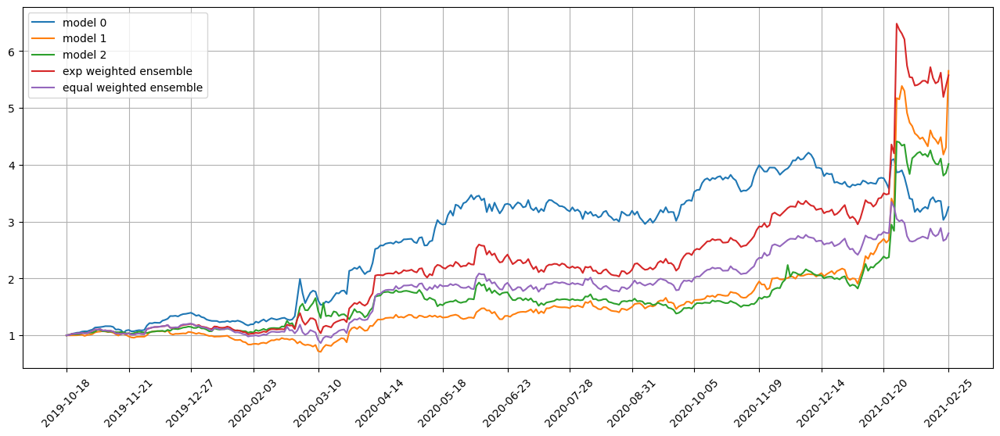

Standardization data are from 2020-05-08 to 2020-09-29
Training data are from 2020-09-30 to 2021-02-23
Testing data are from 2021-01-27 to 2021-03-23
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 18 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0280 - val_loss: 0.0275 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0275 - val_loss: 0.0272 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0273 - val_loss: 0.0278 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0272 - val_loss: 0.0276 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0270 - val_loss: 0.0277 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0268 - val_loss: 0.0283 - lr: 0.0100
Epoch 7/500
146/146 [

46/46 [==============================] - 0s 3ms/step
Model 0 training loss 0.03240782022476196
12/12 [==============================] - 0s 3ms/step
Model 0 test loss 0.03454845771193504
46/46 [==============================] - 0s 3ms/step
Model 1 training loss 0.032748524099588394
12/12 [==============================] - 0s 3ms/step
Model 1 test loss 0.03362394496798515
46/46 [==============================] - 0s 4ms/step
Model 2 training loss 0.0332491360604763
12/12 [==============================] - 0s 3ms/step
Model 2 test loss 0.03412812948226929
Correlations between old and new weights
0.9934677176207027
0.993656978159201
0.9905838969772583
0.9901171570044376
0.9996097483213531
0.990233283314007
Weight of model 0 is 0.05285351687018209
Weight of model 1 is 0.7135418532101241
Weight of model 2 is 0.23360462991969394
Testing data from 2021-01-27 to 2021-02-24 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2021-02-25 are ['WKHS', 'M', 'DDS', 'MSTR', 'SCHZ', 'GME'

Total asset on 2021-03-08 will be 2.953109888327862
It should be the same as 2.9531098883278797
top_stocks by model 1 to buy on 2021-03-05 are ['ROST', 'IRM', 'FTI', 'HMC', 'BAP', 'ASHR', 'TGT', 'BBY', 'YPF', 'SAVA']
Total asset on 2021-03-08 will be 5.024772686826263
It should be the same as 5.024772686826282
top_stocks by model 2 to buy on 2021-03-05 are ['CABO', 'ADC', 'NVDA', 'O', 'SAP', 'EXPRQ', 'FTI', 'YPF', 'SAVA', 'MRIN']
Total asset on 2021-03-08 will be 3.674520697406726
It should be the same as 3.674520697406738
top_stocks by return weighted ensemble to buy on 2021-03-05 are ['BAP', 'ERIC', 'BBY', 'HMC', 'ASHR', 'ROST', 'TGT', 'FTI', 'YPF', 'SAVA']
Total asset on 2021-03-08 will be 5.379716274875352
It should be the same as 5.379716274875361
top_stocks by equal weighted ensemble to buy on 2021-03-05 are ['ATHM', 'TGT', 'ERIC', 'ROST', 'VTRS', 'CABO', 'NBIX', 'FTI', 'YPF', 'SAVA']
Total asset on 2021-03-08 will be 2.723119932367883
It should be the same as 2.7231199323678936


top_stocks by model 0 to buy on 2021-03-16 are ['EXPI', 'BTI', 'QURE', 'EW', 'WEN', 'MVIS', 'WLY', 'MSTR', 'DDD', 'GME']
Total asset on 2021-03-17 will be 3.1384112675351594
It should be the same as 3.1384112675351767
top_stocks by model 1 to buy on 2021-03-16 are ['MKTX', 'KDP', 'COMT', 'BTI', 'HSIC', 'CMS', 'RGR', 'CIEN', 'WEN', 'VANI']
Total asset on 2021-03-17 will be 5.4323127494043595
It should be the same as 5.432312749404379
top_stocks by model 2 to buy on 2021-03-16 are ['EGP', 'STAG', 'HR', 'INVH', 'FR', 'FRO', 'PLD', 'ELS', 'EXPRQ', 'MRIN']
Total asset on 2021-03-17 will be 4.045152113772508
It should be the same as 4.045152113772522
top_stocks by return weighted ensemble to buy on 2021-03-16 are ['ELS', 'KDP', 'CMS', 'PLD', 'COMT', 'HSIC', 'FRO', 'RGR', 'CIEN', 'WEN']
Total asset on 2021-03-17 will be 5.909348041252879
It should be the same as 5.90934804125289
top_stocks by equal weighted ensemble to buy on 2021-03-16 are ['BTI', 'HSIC', 'RGR', 'MKTX', 'WLY', 'CIEN', 'PLD',

Total asset on 2021-03-25 will be 2.5927832365772603
It should be the same as 2.5927832365772705
Model 0 changed -23.249439472829376 percent from 2020-10-01 to 2021-03-25
Model 1 changed 211.32063283989316 percent from 2020-10-01 to 2021-03-25
Model 2 changed 152.78803939817763 percent from 2020-10-01 to 2021-03-25


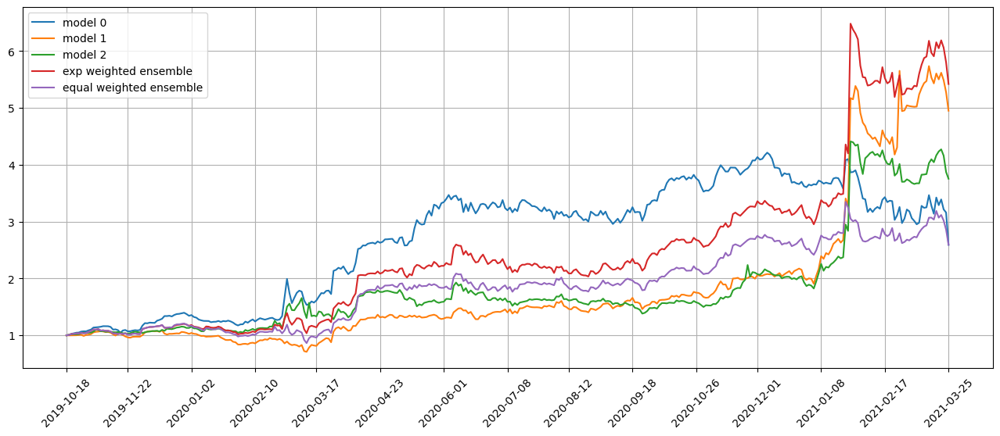

Standardization data are from 2020-06-08 to 2020-10-27
Training data are from 2020-10-28 to 2021-03-23
Testing data are from 2021-02-25 to 2021-04-21
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 19 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0255 - val_loss: 0.0285 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0252 - val_loss: 0.0285 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0249 - val_loss: 0.0284 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0248 - val_loss: 0.0284 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0246 - val_loss: 0.0284 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0246 - val_loss: 0.0288 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 4ms/step - loss: 0.0236 - val_loss: 0.0290 - lr: 0.0012
Epoch 22/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0236 - val_loss: 0.0289 - lr: 0.0012
Epoch 23/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0236 - val_loss: 0.0288 - lr: 0.0012
Epoch 23: early stopping
46/46 [==============================] - 0s 3ms/step
Model 0 training loss 0.03131059184670448
12/12 [==============================] - 0s 3ms/step
Model 0 test loss 0.026298686861991882
46/46 [==============================] - 0s 3ms/step
Model 1 training loss 0.03196544572710991
12/12 [==============================] - 0s 3ms/step
Model 1 test loss 0.026378633454442024
46/46 [==============================] - 0s 4ms/step
Model 2 training loss 0.03241546452045441
12/12 [==============================] - 0s 3ms/step
Model 2 test loss 0.0262586809694767
Correlations between old and new weights
0.9823774759546161
0.9905163072864448
0.998

top_stocks by model 0 to buy on 2021-04-05 are ['TGNA', 'BIDU', 'DVN', 'GSAT', 'SENS', 'DPST', 'FCEL', 'RIOT', 'VANI', 'GME']
Total asset on 2021-04-06 will be 3.1328072183954188
It should be the same as 3.132807218395437
top_stocks by model 1 to buy on 2021-04-05 are ['DBC', 'USO', 'DBO', 'MUFG', 'PDBC', 'BNO', 'FCFS', 'UCO', 'SPTS', 'GME']
Total asset on 2021-04-06 will be 5.690917949009214
It should be the same as 5.690917949009235
top_stocks by model 2 to buy on 2021-04-05 are ['MARA', 'BB', 'MVIS', 'MGNI', 'SENS', 'EXPRQ', 'EDU', 'RIOT', 'VANI', 'GME']
Total asset on 2021-04-06 will be 4.643626901862845
It should be the same as 4.643626901862861
top_stocks by return weighted ensemble to buy on 2021-04-05 are ['PAG', 'PDBC', 'COMT', 'DBO', 'VANI', 'BNO', 'FCFS', 'UCO', 'SPTS', 'GME']
Total asset on 2021-04-06 will be 6.40196957806223
It should be the same as 6.4019695780622445
top_stocks by equal weighted ensemble to buy on 2021-04-05 are ['DVN', 'RIOT', 'DBO', 'PAG', 'GMS', 'FCFS'

Testing data from 2021-03-16 to 2021-04-13 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2021-04-14 are ['RYAAY', 'VUZI', 'MGNI', 'SENS', 'BEN', 'MSTR', 'MVIS', 'RIOT', 'ZOM', 'VANI']
Total asset on 2021-04-15 will be 2.9356326556684356
It should be the same as 2.935632655668455
top_stocks by model 1 to buy on 2021-04-14 are ['ITW', 'SMFG', 'ZOM', 'NEM', 'OMCL', 'SNDX', 'MUFG', 'DOX', 'VANI', 'BEN']
Total asset on 2021-04-15 will be 5.5608297235404365
It should be the same as 5.560829723540461
top_stocks by model 2 to buy on 2021-04-14 are ['MVIS', 'LEN', 'SNDX', 'BB', 'NEM', 'GFI', 'ABBV', 'NVR', 'ZOM', 'VANI']
Total asset on 2021-04-15 will be 4.34850432826796
It should be the same as 4.348504328267978
top_stocks by return weighted ensemble to buy on 2021-04-14 are ['MUFG', 'GFI', 'NVR', 'DOX', 'ABBV', 'NEM', 'SNDX', 'BEN', 'ZOM', 'VANI']
Total asset on 2021-04-15 will be 6.3653588051179835
It should be the same as 6.365358805117993
top_stocks by equal weighted e

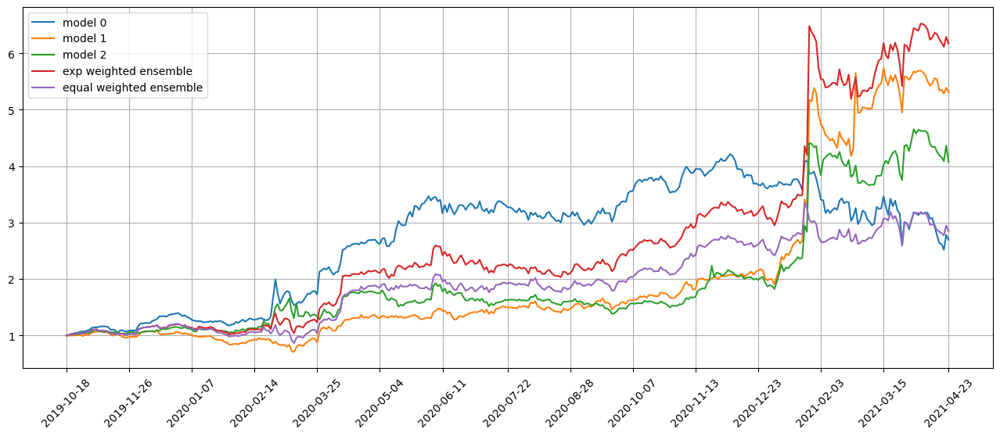

Standardization data are from 2020-07-07 to 2020-11-24
Training data are from 2020-11-25 to 2021-04-21
Testing data are from 2021-03-25 to 2021-05-19
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 20 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0268 - val_loss: 0.0190 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0265 - val_loss: 0.0192 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0263 - val_loss: 0.0191 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0261 - val_loss: 0.0191 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0261 - val_loss: 0.0191 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0260 - val_loss: 0.0189 - lr: 0.0100
Epoch 7/500
146/146 [

Epoch 70/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0246 - val_loss: 0.0186 - lr: 0.0010
Epoch 71/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0245 - val_loss: 0.0187 - lr: 0.0010
Epoch 71: early stopping
Epoch 1/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0273 - val_loss: 0.0191 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0270 - val_loss: 0.0188 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0268 - val_loss: 0.0186 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0266 - val_loss: 0.0187 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0265 - val_loss: 0.0187 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0264 - val_loss: 0.0188 - lr: 0.0100
Epoch 7/500
146/146 [==============================] - 1s 4ms

146/146 [==============================] - 1s 4ms/step - loss: 0.0246 - val_loss: 0.0186 - lr: 0.0010
Epoch 37: early stopping
46/46 [==============================] - 0s 3ms/step
Model 0 training loss 0.028518039733171463
12/12 [==============================] - 0s 3ms/step
Model 0 test loss 0.03489799425005913
46/46 [==============================] - 0s 3ms/step
Model 1 training loss 0.0300190020352602
12/12 [==============================] - 0s 3ms/step
Model 1 test loss 0.033973198384046555
46/46 [==============================] - 0s 3ms/step
Model 2 training loss 0.029764045029878616
12/12 [==============================] - 0s 3ms/step
Model 2 test loss 0.035368774086236954
Correlations between old and new weights
0.9255625709300558
0.9840733587870766
0.9146532667441951
0.9763640151817694
0.9570870250713993
0.9760549156563317
Weight of model 0 is 0.052115321926312
Weight of model 1 is 0.580068625248834
Weight of model 2 is 0.3678160528248541
Testing data from 2021-03-25 to 2021-04

Total asset on 2021-05-04 will be 2.8855421710753806
It should be the same as 2.885542171075402
top_stocks by model 1 to buy on 2021-05-03 are ['FWRD', 'NBR', 'FL', 'GEVO', 'TOL', 'LAZ', 'ARES', 'URBN', 'STM', 'BKE']
Total asset on 2021-05-04 will be 5.840980348337503
It should be the same as 5.840980348337523
top_stocks by model 2 to buy on 2021-05-03 are ['URBN', 'ARES', 'NBR', 'INSW', 'EAT', 'SIX', 'TXRH', 'STM', 'BLMN', 'SOXL']
Total asset on 2021-05-04 will be 4.191609316262675
It should be the same as 4.191609316262692
top_stocks by return weighted ensemble to buy on 2021-05-03 are ['SIX', 'PAYX', 'FL', 'TOL', 'NBR', 'ARES', 'URBN', 'BKE', 'SOXL', 'STM']
Total asset on 2021-05-04 will be 6.6963304025026105
It should be the same as 6.696330402502619
top_stocks by equal weighted ensemble to buy on 2021-05-03 are ['PAYX', 'EAT', 'BLMN', 'SIX', 'ARES', 'NBR', 'BKE', 'URBN', 'SOXL', 'STM']
Total asset on 2021-05-04 will be 3.12518225628745
It should be the same as 3.1251822562874634
T

top_stocks by model 1 to buy on 2021-05-12 are ['MC', 'DHT', 'ZOM', 'GM', 'GUSH', 'PR', 'SCHW', 'DPST', 'TS', 'OMCL']
Total asset on 2021-05-13 will be 5.5079626700570365
It should be the same as 5.507962670057056
top_stocks by model 2 to buy on 2021-05-12 are ['GBX', 'NI', 'PNC', 'FAS', 'OMCL', 'MC', 'UCO', 'EDU', 'DPST', 'RILY']
Total asset on 2021-05-13 will be 3.763693342521093
It should be the same as 3.763693342521112
top_stocks by return weighted ensemble to buy on 2021-05-12 are ['GBX', 'WBS', 'GM', 'RILY', 'GUSH', 'MC', 'SCHW', 'TS', 'DPST', 'OMCL']
Total asset on 2021-05-13 will be 6.230742487054599
It should be the same as 6.230742487054611
top_stocks by equal weighted ensemble to buy on 2021-05-12 are ['GBX', 'SCHW', 'WBS', 'WD', 'GUSH', 'MC', 'RILY', 'TS', 'OMCL', 'DPST']
Total asset on 2021-05-13 will be 2.8770651924337893
It should be the same as 2.877065192433802
Testing data from 2021-04-15 to 2021-05-12 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy o

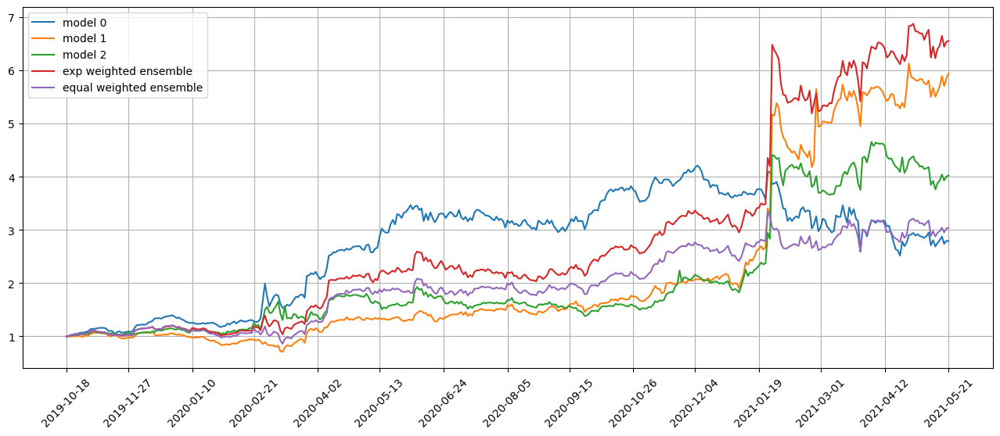

Standardization data are from 2020-08-04 to 2020-12-23
Training data are from 2020-12-24 to 2021-05-19
Testing data are from 2021-04-23 to 2021-06-17
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 21 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0239 - val_loss: 0.0287 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0237 - val_loss: 0.0279 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0236 - val_loss: 0.0282 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0234 - val_loss: 0.0283 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0234 - val_loss: 0.0294 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0233 - val_loss: 0.0279 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 4ms/step - loss: 0.0227 - val_loss: 0.0295 - lr: 0.0025
Epoch 16/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0227 - val_loss: 0.0291 - lr: 0.0025
Epoch 17/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0227 - val_loss: 0.0291 - lr: 0.0025
Epoch 18/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0225 - val_loss: 0.0289 - lr: 0.0012
Epoch 19/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0225 - val_loss: 0.0290 - lr: 0.0012
Epoch 20/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0225 - val_loss: 0.0292 - lr: 0.0012
Epoch 21/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0225 - val_loss: 0.0287 - lr: 0.0012
Epoch 22/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0225 - val_loss: 0.0292 - lr: 0.0012
Epoch 23/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0225 - val_loss

Total asset on 2021-05-28 will be 3.204113978831021
It should be the same as 3.2041139788310344
Testing data from 2021-04-30 to 2021-05-27 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2021-05-28 are ['SQM', 'DY', 'DECK', 'KLIC', 'GME', 'IOVA', 'BDC', 'MLM', 'WK', 'SLCA']
Total asset on 2021-06-01 will be 2.8515485495086104
It should be the same as 2.8515485495086343
top_stocks by model 1 to buy on 2021-05-28 are ['IRBT', 'HWC', 'GRFS', 'MLM', 'CROX', 'FTAI', 'VTNR', 'EL', 'SLCA', 'EDU']
Total asset on 2021-06-01 will be 6.577305000523681
It should be the same as 6.577305000523703
top_stocks by model 2 to buy on 2021-05-28 are ['TECK', 'HUN', 'ABCB', 'CROX', 'EL', 'DECK', 'WRK', 'SLCA', 'SOXL', 'EDU']
Total asset on 2021-06-01 will be 4.112166320228112
It should be the same as 4.112166320228134
top_stocks by return weighted ensemble to buy on 2021-05-28 are ['KMT', 'HWC', 'HUN', 'FTAI', 'DECK', 'CROX', 'MLM', 'EL', 'SLCA', 'EDU']
Total asset on 2021-06-01 will be 6

Testing data from 2021-05-11 to 2021-06-08 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2021-06-09 are ['SLCA', 'DQ', 'DPST', 'PACB', 'PSEC', 'SLM', 'SPWR', 'EVR', 'SAIA', 'GME']
Total asset on 2021-06-10 will be 2.9124648398934245
It should be the same as 2.91246483989345
top_stocks by model 1 to buy on 2021-06-09 are ['KRYS', 'DPST', 'TRIP', 'SITE', 'EVR', 'SAIA', 'GEVO', 'SAVA', 'VCEL', 'GME']
Total asset on 2021-06-10 will be 6.731302604036236
It should be the same as 6.731302604036259
top_stocks by model 2 to buy on 2021-06-09 are ['SMG', 'GEVO', 'SF', 'DPST', 'GBTC', 'EVR', 'THO', 'SOXL', 'EDU', 'GME']
Total asset on 2021-06-10 will be 4.202997573319089
It should be the same as 4.202997573319112
top_stocks by return weighted ensemble to buy on 2021-06-09 are ['KRYS', 'SLCA', 'THO', 'DPST', 'GEVO', 'EVR', 'SAIA', 'SAVA', 'VCEL', 'GME']
Total asset on 2021-06-10 will be 7.101129547753416
It should be the same as 7.101129547753424
top_stocks by equal weighted e

Testing data from 2021-05-20 to 2021-06-17 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2021-06-18 are ['TFIN', 'FCX', 'AGCO', 'CPRI', 'WAL', 'SCCO', 'SAVA', 'COPX', 'SID', 'GME']
Total asset on 2021-06-21 will be 2.719390239429099
It should be the same as 2.7193902394291247
top_stocks by model 1 to buy on 2021-06-18 are ['COPX', 'MT', 'UAA', 'SID', 'WAL', 'WTFC', 'CPRI', 'FCX', 'TFIN', 'GME']
Total asset on 2021-06-21 will be 6.462280784865036
It should be the same as 6.462280784865063
top_stocks by model 2 to buy on 2021-06-18 are ['DFS', 'PB', 'BG', 'FCX', 'ABCB', 'EMN', 'WTFC', 'TFIN', 'SOXL', 'GME']
Total asset on 2021-06-21 will be 4.115338805487031
It should be the same as 4.115338805487053
top_stocks by return weighted ensemble to buy on 2021-06-18 are ['MT', 'COPX', 'UAA', 'DFS', 'CPRI', 'WAL', 'WTFC', 'FCX', 'TFIN', 'GME']
Total asset on 2021-06-21 will be 7.009517737608457
It should be the same as 7.009517737608464
top_stocks by equal weighted ensemble 

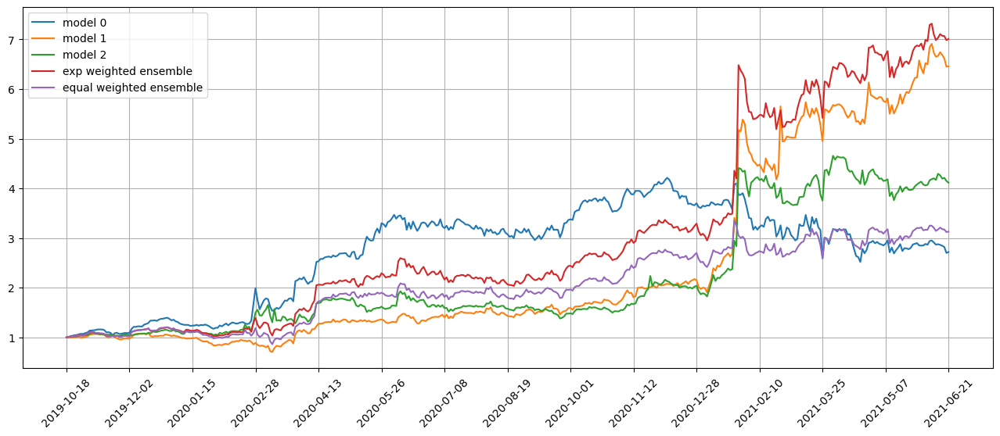

Standardization data are from 2020-09-01 to 2021-01-25
Training data are from 2021-01-26 to 2021-06-17
Testing data are from 2021-05-21 to 2021-07-16
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 22 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0225 - val_loss: 0.0178 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0222 - val_loss: 0.0182 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0221 - val_loss: 0.0177 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0220 - val_loss: 0.0181 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0220 - val_loss: 0.0180 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0218 - val_loss: 0.0183 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 4ms/step - loss: 0.0220 - val_loss: 0.0185 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0220 - val_loss: 0.0182 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0219 - val_loss: 0.0184 - lr: 0.0100
Epoch 7/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0215 - val_loss: 0.0180 - lr: 0.0050
Epoch 8/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0215 - val_loss: 0.0180 - lr: 0.0050
Epoch 9/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0214 - val_loss: 0.0181 - lr: 0.0050
Epoch 10/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0214 - val_loss: 0.0180 - lr: 0.0050
Epoch 11/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0213 - val_loss: 0.0181 - lr: 0.0050
Epoch 12/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0212 - val_loss: 0.0

Total asset on 2021-06-24 will be 3.2898784612822043
It should be the same as 3.2898784612822203
Testing data from 2021-05-26 to 2021-06-23 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2021-06-24 are ['HTHT', 'PKX', 'ATUS', 'SKY', 'CPB', 'TRN', 'GME', 'CCS', 'BAP', 'ERJ']
Total asset on 2021-06-25 will be 2.865692418132935
It should be the same as 2.8656924181329626
top_stocks by model 1 to buy on 2021-06-24 are ['UPBD', 'UNF', 'NOV', 'SFM', 'PKX', 'UCO', 'SID', 'BIG', 'VALE', 'EDU']
Total asset on 2021-06-25 will be 6.831842262629369
It should be the same as 6.8318422626294
top_stocks by model 2 to buy on 2021-06-24 are ['GOLF', 'ASX', 'AG', 'COPX', 'FTDR', 'TEX', 'SAGE', 'SNY', 'ATUS', 'GGB']
Total asset on 2021-06-25 will be 4.3497834249900205
It should be the same as 4.349783424990042
top_stocks by return weighted ensemble to buy on 2021-06-24 are ['ATUS', 'NOV', 'UNF', 'SFM', 'UCO', 'GGB', 'BIG', 'PKX', 'SID', 'VALE']
Total asset on 2021-06-25 will be 7.45327

Testing data from 2021-06-07 to 2021-07-02 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2021-07-06 are ['TTD', 'STAA', 'UCTT', 'UNFI', 'SID', 'MARA', 'AMR', 'MVIS', 'SOXL', 'QFIN']
Total asset on 2021-07-07 will be 2.804035925803766
It should be the same as 2.8040359258037926
top_stocks by model 1 to buy on 2021-07-06 are ['ANGI', 'STAA', 'MARA', 'RIOT', 'EXTR', 'MSTR', 'VTNR', 'SOXL', 'AMC', 'EDU']
Total asset on 2021-07-07 will be 6.769590084473633
It should be the same as 6.7695900844736645
top_stocks by model 2 to buy on 2021-07-06 are ['RIOT', 'SID', 'IRDM', 'EXTR', 'MSTR', 'NVCR', 'UEC', 'MARA', 'VTNR', 'SOXL']
Total asset on 2021-07-07 will be 4.250674134055774
It should be the same as 4.250674134055798
top_stocks by return weighted ensemble to buy on 2021-07-06 are ['UCTT', 'STAA', 'RIOT', 'EXTR', 'MARA', 'EDU', 'MSTR', 'VTNR', 'AMC', 'SOXL']
Total asset on 2021-07-07 will be 7.133261135559194
It should be the same as 7.133261135559201
top_stocks by equal 

Total asset on 2021-07-15 will be 3.2975632795073904
It should be the same as 3.297563279507404
Testing data from 2021-06-16 to 2021-07-14 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2021-07-15 are ['XOP', 'TNA', 'MRO', 'URTY', 'ERX', 'FAS', 'FCG', 'GUSH', 'VRN', 'VCEL']
Total asset on 2021-07-16 will be 2.7322532793803784
It should be the same as 2.7322532793804073
top_stocks by model 1 to buy on 2021-07-15 are ['COPX', 'SLB', 'VRN', 'DVN', 'FCX', 'EVR', 'MT', 'DPST', 'FAS', 'EDU']
Total asset on 2021-07-16 will be 6.66310331426617
It should be the same as 6.663103314266206
top_stocks by model 2 to buy on 2021-07-15 are ['WBS', 'COF', 'ERX', 'OLN', 'VRN', 'LAZ', 'AMC', 'VCEL', 'BYD', 'EVR']
Total asset on 2021-07-16 will be 4.3280790782998695
It should be the same as 4.328079078299892
top_stocks by return weighted ensemble to buy on 2021-07-15 are ['PBF', 'GUSH', 'SYF', 'BYD', 'OLN', 'FCX', 'DPST', 'FAS', 'VRN', 'EVR']
Total asset on 2021-07-16 will be 7.1759319

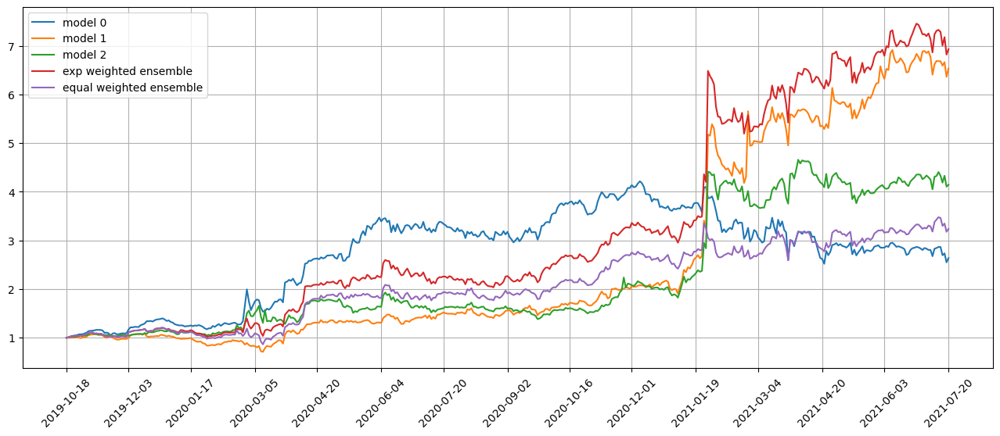

Standardization data are from 2020-09-30 to 2021-02-23
Training data are from 2021-02-24 to 2021-07-16
Testing data are from 2021-06-21 to 2021-08-13
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 23 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0191 - val_loss: 0.0230 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0190 - val_loss: 0.0233 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0188 - val_loss: 0.0230 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0188 - val_loss: 0.0230 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0187 - val_loss: 0.0231 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0187 - val_loss: 0.0228 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 4ms/step - loss: 0.0181 - val_loss: 0.0226 - lr: 0.0050
Epoch 16/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0181 - val_loss: 0.0232 - lr: 0.0050
Epoch 17/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0180 - val_loss: 0.0233 - lr: 0.0050
Epoch 18/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0180 - val_loss: 0.0239 - lr: 0.0050
Epoch 19/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0180 - val_loss: 0.0234 - lr: 0.0050
Epoch 20/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0178 - val_loss: 0.0234 - lr: 0.0025
Epoch 21/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0178 - val_loss: 0.0234 - lr: 0.0025
Epoch 22/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0178 - val_loss: 0.0225 - lr: 0.0025
Epoch 23/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0178 - val_loss

Total asset on 2021-07-27 will be 7.234000601371017
It should be the same as 7.234000601371023
top_stocks by equal weighted ensemble to buy on 2021-07-26 are ['ABEV', 'MCRB', 'IAG', 'GRWG', 'SNBR', 'ATGE', 'GOLD', 'NG', 'AMRC', 'MRIN']
Total asset on 2021-07-27 will be 3.3302622619741395
It should be the same as 3.3302622619741555
Testing data from 2021-06-28 to 2021-07-26 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2021-07-27 are ['EURN', 'MOD', 'TAL', 'COPX', 'ASR', 'HCC', 'CF', 'ITCI', 'PRTA', 'ZLAB']
Total asset on 2021-07-28 will be 2.621342964688224
It should be the same as 2.621342964688253
top_stocks by model 1 to buy on 2021-07-27 are ['COPX', 'SCCO', 'ITCI', 'SID', 'RIO', 'VALE', 'ZLAB', 'NTLA', 'ASTH', 'SOXL']
Total asset on 2021-07-28 will be 6.564283866823569
It should be the same as 6.564283866823603
top_stocks by model 2 to buy on 2021-07-27 are ['CLF', 'VALE', 'CF', 'ESI', 'AGI', 'RIO', 'PRTA', 'TAL', 'BCRX', 'ITCI']
Total asset on 2021-07-28 will

Testing data from 2021-07-08 to 2021-08-04 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2021-08-05 are ['K', 'WU', 'LANC', 'BBWI', 'HBAN', 'PSMT', 'AEHR', 'RPM', 'HCSG', 'SWI']
Total asset on 2021-08-06 will be 2.706724702420292
It should be the same as 2.7067247024203214
top_stocks by model 1 to buy on 2021-08-05 are ['TFX', 'PPC', 'RUSHA', 'ASTH', 'FTGC', 'XPO', 'RDY', 'SWI', 'PSMT', 'SOXL']
Total asset on 2021-08-06 will be 6.68839452415731
It should be the same as 6.6883945241573475
top_stocks by model 2 to buy on 2021-08-05 are ['WU', 'BWXT', 'IMAX', 'SMG', 'APT', 'CNMD', 'HCSG', 'BBWI', 'SWI', 'AEHR']
Total asset on 2021-08-06 will be 4.272672881398156
It should be the same as 4.272672881398182
top_stocks by return weighted ensemble to buy on 2021-08-05 are ['GRBK', 'ABEV', 'WU', 'SMG', 'BBWI', 'CNMD', 'HCSG', 'AEHR', 'PSMT', 'SWI']
Total asset on 2021-08-06 will be 7.2456162581616645
It should be the same as 7.245616258161677
top_stocks by equal weighted en

Testing data from 2021-07-19 to 2021-08-13 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2021-08-16 are ['ONEQ', 'HMY', 'GFI', 'JAZZ', 'AG', 'GOLD', 'EXK', 'NEM', 'ASTH', 'SOXL']
Total asset on 2021-08-17 will be 2.568921369265478
It should be the same as 2.568921369265508
top_stocks by model 1 to buy on 2021-08-16 are ['ITRI', 'KTOS', 'WK', 'NVRO', 'SOXL', 'AEHR', 'AMED', 'GE', 'UCO', 'ASTH']
Total asset on 2021-08-17 will be 6.236993517067832
It should be the same as 6.236993517067869
top_stocks by model 2 to buy on 2021-08-16 are ['GFI', 'USO', 'ACHC', 'ENPH', 'NEM', 'AG', 'UCO', 'EXK', 'EDU', 'ASTH']
Total asset on 2021-08-17 will be 3.9266892478833606
It should be the same as 3.9266892478833886
top_stocks by return weighted ensemble to buy on 2021-08-16 are ['ENPH', 'HMY', 'KTOS', 'AG', 'GFI', 'SOXL', 'EXK', 'NEM', 'UCO', 'ASTH']
Total asset on 2021-08-17 will be 6.600229900752557
It should be the same as 6.600229900752567
top_stocks by equal weighted ensemble

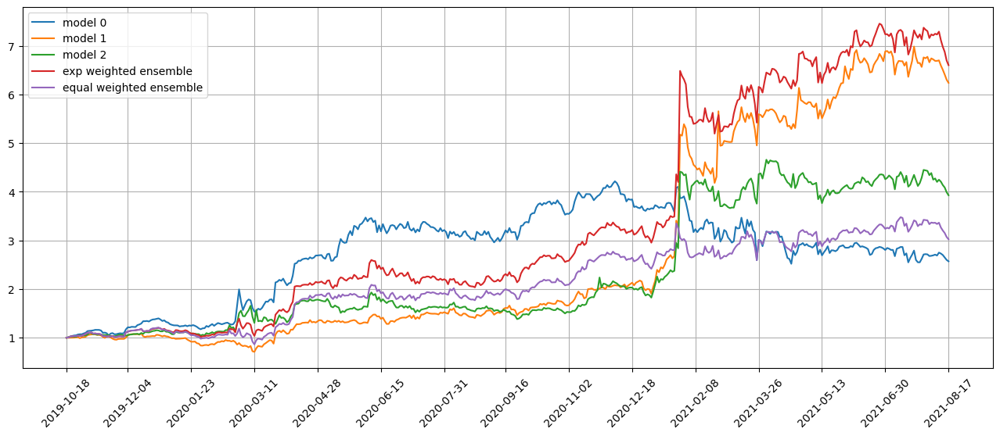

Standardization data are from 2020-10-28 to 2021-03-23
Training data are from 2021-03-24 to 2021-08-13
Testing data are from 2021-07-20 to 2021-09-13
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 24 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0199 - val_loss: 0.0182 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0195 - val_loss: 0.0178 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0193 - val_loss: 0.0175 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0192 - val_loss: 0.0175 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0192 - val_loss: 0.0175 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0190 - val_loss: 0.0175 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 5ms/step - loss: 0.0186 - val_loss: 0.0175 - lr: 0.0100
Epoch 13/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0186 - val_loss: 0.0173 - lr: 0.0100
Epoch 14/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0183 - val_loss: 0.0179 - lr: 0.0050
Epoch 15/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0183 - val_loss: 0.0176 - lr: 0.0050
Epoch 16/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0182 - val_loss: 0.0175 - lr: 0.0050
Epoch 17/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0182 - val_loss: 0.0176 - lr: 0.0050
Epoch 18/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0182 - val_loss: 0.0178 - lr: 0.0050
Epoch 19/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0179 - val_loss: 0.0177 - lr: 0.0025
Epoch 20/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0180 - val_loss

top_stocks by model 2 to buy on 2021-08-23 are ['LC', 'TM', 'AMR', 'DE', 'AMG', 'MRCY', 'PRFT', 'LOVE', 'PFGC', 'VRN']
Total asset on 2021-08-24 will be 4.088650046447559
It should be the same as 4.088650046447587
top_stocks by return weighted ensemble to buy on 2021-08-23 are ['USFD', 'ARCH', 'NUE', 'AMR', 'LOVE', 'DE', 'VRN', 'BTU', 'PFGC', 'MRIN']
Total asset on 2021-08-24 will be 6.842741112257342
It should be the same as 6.842741112257356
top_stocks by equal weighted ensemble to buy on 2021-08-23 are ['USFD', 'ARCH', 'NUE', 'LOVE', 'AMR', 'DE', 'VRN', 'BTU', 'PFGC', 'MRIN']
Total asset on 2021-08-24 will be 3.1336454125000794
It should be the same as 3.133645412500094
Testing data from 2021-07-27 to 2021-08-23 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2021-08-24 are ['MU', 'LRCX', 'LNTH', 'VIPS', 'BIDU', 'NTES', 'TME', 'JD', 'BABA', 'BKE']
Total asset on 2021-08-25 will be 2.6926056665379083
It should be the same as 2.692605666537937
top_stocks by model 1 

top_stocks by model 2 to buy on 2021-09-01 are ['SAVA', 'TD', 'PRTA', 'MANU', 'FIVN', 'FRO', 'UHAL', 'COF', 'CP', 'GOGL']
Total asset on 2021-09-02 will be 4.340475379079012
It should be the same as 4.340475379079038
top_stocks by return weighted ensemble to buy on 2021-09-01 are ['FUN', 'RRR', 'COF', 'SAVA', 'PRTA', 'CP', 'GOGL', 'AEHR', 'ANY', 'MRIN']
Total asset on 2021-09-02 will be 7.520577429852564
It should be the same as 7.520577429852583
top_stocks by equal weighted ensemble to buy on 2021-09-01 are ['TD', 'RRR', 'COF', 'PRTA', 'SAVA', 'GOGL', 'CP', 'ANY', 'AEHR', 'MRIN']
Total asset on 2021-09-02 will be 3.4342076251254943
It should be the same as 3.4342076251255085
Testing data from 2021-08-05 to 2021-09-01 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2021-09-02 are ['PLCE', 'PRTA', 'AA', 'AEO', 'ANF', 'WFC', 'BGFV', 'BTU', 'DVN', 'MRO']
Total asset on 2021-09-03 will be 2.8374816685542226
It should be the same as 2.8374816685542523
top_stocks by model 

Total asset on 2021-09-14 will be 4.419149657479817
It should be the same as 4.419149657479845
top_stocks by return weighted ensemble to buy on 2021-09-13 are ['NSIT', 'FCPT', 'ASTH', 'TVTX', 'TFX', 'ANY', 'CP', 'APLS', 'AEHR', 'MRIN']
Total asset on 2021-09-14 will be 7.492963041825743
It should be the same as 7.492963041825765
top_stocks by equal weighted ensemble to buy on 2021-09-13 are ['FCPT', 'RNG', 'NSIT', 'TVTX', 'TFX', 'ANY', 'AEHR', 'APLS', 'CP', 'MRIN']
Total asset on 2021-09-14 will be 3.4622658936141972
It should be the same as 3.4622658936142146
Testing data from 2021-08-16 to 2021-09-13 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2021-09-14 are ['DBI', 'GKOS', 'FL', 'ELV', 'BGFV', 'ANY', 'MLCO', 'APLS', 'ABBV', 'AEHR']
Total asset on 2021-09-15 will be 2.6585486158962746
It should be the same as 2.6585486158963048
top_stocks by model 1 to buy on 2021-09-14 are ['CNC', 'TFX', 'ICUI', 'TCOM', 'FTAI', 'APLS', 'ANY', 'ASTH', 'AEHR', 'MRIN']
Total asse

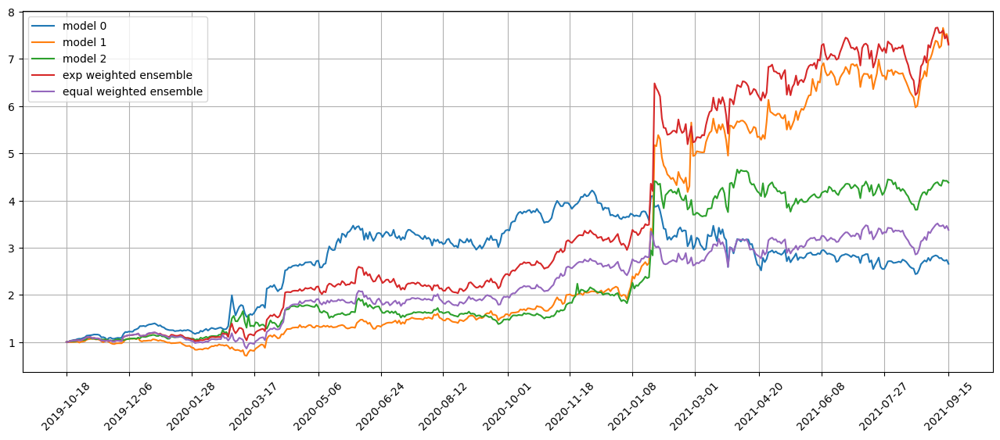

Standardization data are from 2020-11-25 to 2021-04-21
Training data are from 2021-04-22 to 2021-09-13
Testing data are from 2021-08-17 to 2021-10-11
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 25 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0177 - val_loss: 0.0169 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0176 - val_loss: 0.0170 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0174 - val_loss: 0.0169 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0173 - val_loss: 0.0171 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0173 - val_loss: 0.0170 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0172 - val_loss: 0.0169 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 4ms/step - loss: 0.0163 - val_loss: 0.0166 - lr: 0.0010
Epoch 37/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0164 - val_loss: 0.0166 - lr: 0.0010
Epoch 38/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0164 - val_loss: 0.0166 - lr: 0.0010
Epoch 39/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0164 - val_loss: 0.0166 - lr: 0.0010
Epoch 40/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0164 - val_loss: 0.0167 - lr: 0.0010
Epoch 41/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0164 - val_loss: 0.0166 - lr: 0.0010
Epoch 42/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0164 - val_loss: 0.0166 - lr: 0.0010
Epoch 43/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0163 - val_loss: 0.0166 - lr: 0.0010
Epoch 44/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0163 - val_loss

146/146 [==============================] - 1s 6ms/step - loss: 0.0168 - val_loss: 0.0168 - lr: 0.0050
Epoch 12/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0168 - val_loss: 0.0169 - lr: 0.0050
Epoch 13/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0167 - val_loss: 0.0167 - lr: 0.0025
Epoch 14/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0167 - val_loss: 0.0168 - lr: 0.0025
Epoch 15/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0166 - val_loss: 0.0167 - lr: 0.0025
Epoch 16/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0166 - val_loss: 0.0169 - lr: 0.0025
Epoch 17/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0166 - val_loss: 0.0167 - lr: 0.0025
Epoch 18/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0165 - val_loss: 0.0167 - lr: 0.0012
Epoch 19/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0165 - val_loss

Total asset on 2021-09-22 will be 7.347008756598312
It should be the same as 7.347008756598353
top_stocks by model 2 to buy on 2021-09-21 are ['CVLT', 'IVZ', 'RY', 'PUK', 'BMO', 'NUE', 'CEIX', 'SBLK', 'CM', 'GOGL']
Total asset on 2021-09-22 will be 4.313463870516818
It should be the same as 4.3134638705168475
top_stocks by return weighted ensemble to buy on 2021-09-21 are ['NUE', 'RY', 'FCX', 'AMKR', 'STLD', 'TX', 'MT', 'SLAB', 'GOGL', 'CNQ']
Total asset on 2021-09-22 will be 7.048299125248161
It should be the same as 7.048299125248186
top_stocks by equal weighted ensemble to buy on 2021-09-21 are ['COPX', 'RY', 'NUE', 'AMKR', 'STLD', 'TX', 'MT', 'SLAB', 'CNQ', 'GOGL']
Total asset on 2021-09-22 will be 3.264843499846554
It should be the same as 3.264843499846573
Testing data from 2021-08-24 to 2021-09-21 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2021-09-22 are ['FCX', 'PFG', 'VMI', 'TEX', 'RBC', 'BHP', 'GGB', 'FTAI', 'EA', 'TTMI']
Total asset on 2021-09-23 will

Total asset on 2021-10-01 will be 7.586424149121554
It should be the same as 7.586424149121595
top_stocks by model 2 to buy on 2021-09-30 are ['LIVN', 'EQT', 'LNTH', 'INSP', 'UPWK', 'RACE', 'FTNT', 'BTU', 'CEIX', 'NAVI']
Total asset on 2021-10-01 will be 4.642612343493002
It should be the same as 4.6426123434930355
top_stocks by return weighted ensemble to buy on 2021-09-30 are ['ZS', 'GIB', 'KEYS', 'MTCH', 'ASML', 'GOOG', 'MLI', 'UPWK', 'NAVI', 'RACE']
Total asset on 2021-10-01 will be 7.274208195654459
It should be the same as 7.274208195654484
top_stocks by equal weighted ensemble to buy on 2021-09-30 are ['KEYS', 'LIVN', 'GIB', 'MTCH', 'MLI', 'GOOG', 'ASML', 'UPWK', 'RACE', 'NAVI']
Total asset on 2021-10-01 will be 3.385620226612816
It should be the same as 3.3856202266128363
Testing data from 2021-09-02 to 2021-09-30 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2021-10-01 are ['COO', 'NUE', 'ALT', 'KSS', 'GNRC', 'MTD', 'NAVI', 'WAT', 'OTEX', 'STLD']
Total ass

Total asset on 2021-10-12 will be 7.373279540437913
It should be the same as 7.373279540437958
top_stocks by model 2 to buy on 2021-10-11 are ['EXPD', 'URI', 'EQIX', 'GMED', 'POST', 'XENE', 'HEI.A', 'FUL', 'ALLO', 'ZD']
Total asset on 2021-10-12 will be 4.967716739656203
It should be the same as 4.967716739656232
top_stocks by return weighted ensemble to buy on 2021-10-11 are ['KALU', 'BBWI', 'FUL', 'PAGS', 'POST', 'SBH', 'SEIC', 'GVA', 'GE', 'ZD']
Total asset on 2021-10-12 will be 7.057701863279099
It should be the same as 7.057701863279124
top_stocks by equal weighted ensemble to buy on 2021-10-11 are ['KALU', 'ALLO', 'FUL', 'SBH', 'POST', 'SEIC', 'PAGS', 'GVA', 'GE', 'ZD']
Total asset on 2021-10-12 will be 3.3186506050415967
It should be the same as 3.318650605041616
Testing data from 2021-09-14 to 2021-10-11 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2021-10-12 are ['HALO', 'HCSG', 'BSCO', 'TOTL', 'BJRI', 'ZD', 'SPHY', 'SPMB', 'LW', 'PAGS']
Total asset on 20

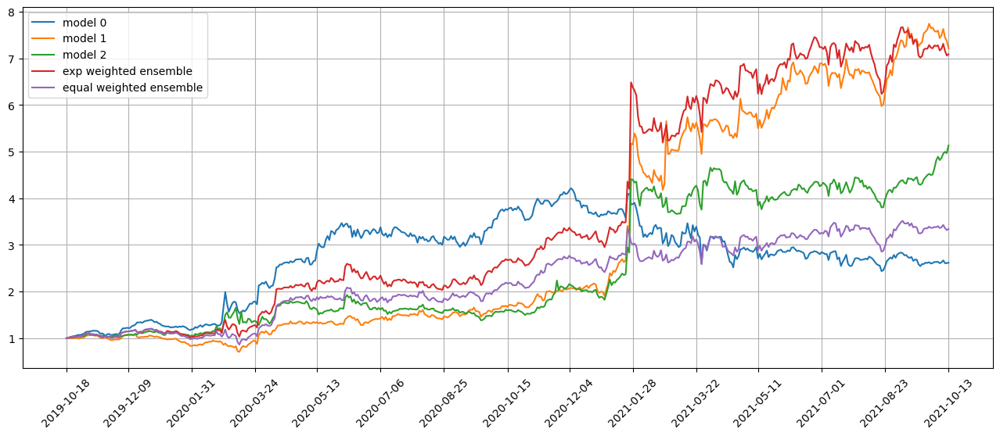

Standardization data are from 2020-12-24 to 2021-05-19
Training data are from 2021-05-20 to 2021-10-11
Testing data are from 2021-09-15 to 2021-11-08
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 26 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0175 - val_loss: 0.0200 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0173 - val_loss: 0.0202 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0172 - val_loss: 0.0205 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0172 - val_loss: 0.0203 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0170 - val_loss: 0.0204 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0170 - val_loss: 0.0202 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 6ms/step - loss: 0.0161 - val_loss: 0.0188 - lr: 0.0010
Epoch 31/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0161 - val_loss: 0.0187 - lr: 0.0010
Epoch 32/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0161 - val_loss: 0.0188 - lr: 0.0010
Epoch 33/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0161 - val_loss: 0.0188 - lr: 0.0010
Epoch 34/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0161 - val_loss: 0.0188 - lr: 0.0010
Epoch 35/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0161 - val_loss: 0.0188 - lr: 0.0010
Epoch 36/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0161 - val_loss: 0.0188 - lr: 0.0010
Epoch 37/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0161 - val_loss: 0.0188 - lr: 0.0010
Epoch 38/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0161 - val_loss

Testing data from 2021-09-17 to 2021-10-14 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2021-10-15 are ['CRK', 'MTCH', 'SFIX', 'TSCO', 'HZO', 'JDST', 'PI', 'SPR', 'WFC', 'BA']
Total asset on 2021-10-18 will be 2.7641628799031017
It should be the same as 2.764162879903135
top_stocks by model 1 to buy on 2021-10-15 are ['JDST', 'KOLD', 'SFIX', 'DAL', 'SAVE', 'W', 'SPR', 'UAL', 'ALLO', 'XENE']
Total asset on 2021-10-18 will be 7.424831946537738
It should be the same as 7.424831946537786
top_stocks by model 2 to buy on 2021-10-15 are ['W', 'STAA', 'DAL', 'RVNC', 'LNTH', 'CRL', 'AEHR', 'PI', 'JDST', 'ALLO']
Total asset on 2021-10-18 will be 5.137686918221197
It should be the same as 5.137686918221226
top_stocks by return weighted ensemble to buy on 2021-10-15 are ['HCSG', 'DELL', 'UAL', 'SFIX', 'SPR', 'PI', 'DAL', 'W', 'JDST', 'ALLO']
Total asset on 2021-10-18 will be 7.272728502298651
It should be the same as 7.27272850229868
top_stocks by equal weighted ensemble to b

top_stocks by model 0 to buy on 2021-10-26 are ['MAN', 'BRZU', 'GGB', 'SID', 'CLB', 'ATI', 'AZUL', 'DORM', 'KRG', 'XENE']
Total asset on 2021-10-27 will be 2.7893808632810138
It should be the same as 2.7893808632810484
top_stocks by model 1 to buy on 2021-10-26 are ['TNL', 'PUMP', 'AZUL', 'RJF', 'AL', 'AXP', 'MAN', 'OMC', 'GGB', 'KOLD']
Total asset on 2021-10-27 will be 7.237749989524571
It should be the same as 7.237749989524616
top_stocks by model 2 to buy on 2021-10-26 are ['MOD', 'KOLD', 'MAN', 'ATI', 'GRWG', 'JDST', 'WES', 'DUST', 'MRIN', 'AEHR']
Total asset on 2021-10-27 will be 4.891141897666337
It should be the same as 4.891141897666363
top_stocks by return weighted ensemble to buy on 2021-10-26 are ['BRZU', 'GRWG', 'AZUL', 'AXP', 'SID', 'GGB', 'OMC', 'ATI', 'MAN', 'KOLD']
Total asset on 2021-10-27 will be 7.0098530902278355
It should be the same as 7.009853090227865
top_stocks by equal weighted ensemble to buy on 2021-10-26 are ['DORM', 'BRZU', 'AXP', 'AZUL', 'SID', 'GGB', 'OM

top_stocks by model 0 to buy on 2021-11-04 are ['TUP', 'PENN', 'MDT', 'DELL', 'BCRX', 'BSX', 'APPS', 'LGIH', 'CAR', 'BOIL']
Total asset on 2021-11-05 will be 2.7843894292033187
It should be the same as 2.784389429203355
top_stocks by model 1 to buy on 2021-11-04 are ['AWK', 'GSHD', 'TUP', 'SABR', 'APPS', 'IT', 'WES', 'RVNC', 'BOIL', 'CAR']
Total asset on 2021-11-05 will be 7.260082651147772
It should be the same as 7.260082651147816
top_stocks by model 2 to buy on 2021-11-04 are ['TUP', 'LGIH', 'BCRX', 'APPS', 'BSX', 'EVRI', 'AEHR', 'BOIL', 'MRIN', 'CAR']
Total asset on 2021-11-05 will be 4.96737632252997
It should be the same as 4.967376322529996
top_stocks by return weighted ensemble to buy on 2021-11-04 are ['WES', 'BCRX', 'IT', 'RVNC', 'TUP', 'BSX', 'LGIH', 'APPS', 'BOIL', 'CAR']
Total asset on 2021-11-05 will be 7.078855844386869
It should be the same as 7.078855844386903
top_stocks by equal weighted ensemble to buy on 2021-11-04 are ['DE', 'RVNC', 'IT', 'BCRX', 'TUP', 'BSX', 'LGI

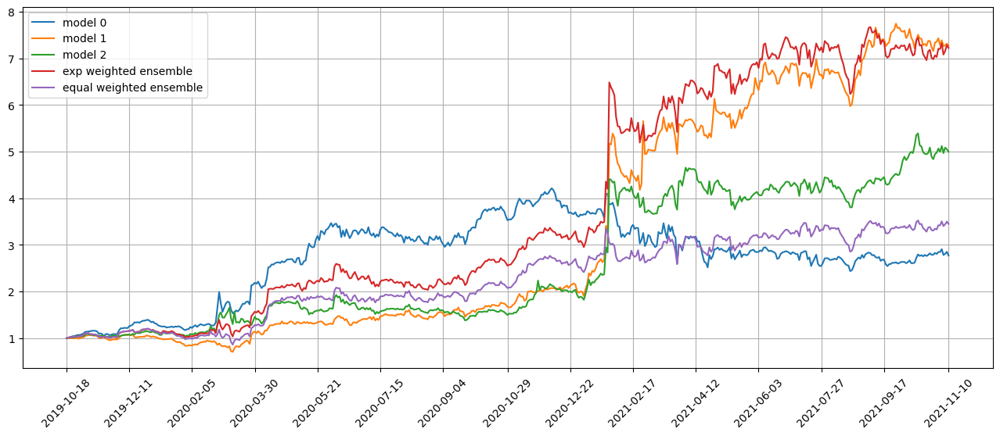

Standardization data are from 2021-01-26 to 2021-06-17
Training data are from 2021-06-18 to 2021-11-08
Testing data are from 2021-10-13 to 2021-12-07
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 27 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0176 - val_loss: 0.0202 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0174 - val_loss: 0.0204 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0173 - val_loss: 0.0203 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0171 - val_loss: 0.0203 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0171 - val_loss: 0.0202 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0171 - val_loss: 0.0204 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 6ms/step - loss: 0.0161 - val_loss: 0.0203 - lr: 0.0010
Epoch 32/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0161 - val_loss: 0.0203 - lr: 0.0010
Epoch 33/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0161 - val_loss: 0.0202 - lr: 0.0010
Epoch 34/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0161 - val_loss: 0.0201 - lr: 0.0010
Epoch 35/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0161 - val_loss: 0.0201 - lr: 0.0010
Epoch 36/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0161 - val_loss: 0.0202 - lr: 0.0010
Epoch 37/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0161 - val_loss: 0.0202 - lr: 0.0010
Epoch 38/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0161 - val_loss: 0.0202 - lr: 0.0010
Epoch 39/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0161 - val_loss

top_stocks by model 0 to buy on 2021-11-12 are ['PTEN', 'YANG', 'FTAI', 'DRIP', 'CDP', 'VTEB', 'BURL', 'LOPE', 'PRFT', 'AEHR']
Total asset on 2021-11-15 will be 2.6916196926588687
It should be the same as 2.6916196926589047
top_stocks by model 1 to buy on 2021-11-12 are ['RL', 'AKR', 'LAUR', 'HLT', 'ATUS', 'DCPH', 'DRIP', 'FTAI', 'PTEN', 'LOPE']
Total asset on 2021-11-15 will be 7.055468526498028
It should be the same as 7.055468526498072
top_stocks by model 2 to buy on 2021-11-12 are ['FTAI', 'CRK', 'AEHR', 'OII', 'ERY', 'HLT', 'PTEN', 'DRIP', 'AMR', 'DCPH']
Total asset on 2021-11-15 will be 4.807297569087148
It should be the same as 4.807297569087173
top_stocks by return weighted ensemble to buy on 2021-11-12 are ['OII', 'PRFT', 'AEHR', 'HLT', 'LOPE', 'AMR', 'FTAI', 'DRIP', 'PTEN', 'DCPH']
Total asset on 2021-11-15 will be 6.888756059359131
It should be the same as 6.888756059359164
top_stocks by equal weighted ensemble to buy on 2021-11-12 are ['OII', 'PRFT', 'HLT', 'AEHR', 'AMR', '

Testing data from 2021-10-26 to 2021-11-22 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2021-11-23 are ['BLDP', 'NSTGQ', 'CSTM', 'ASTH', 'EMN', 'BOIL', 'SM', 'DE', 'CAR', 'LEG']
Total asset on 2021-11-24 will be 2.5765493333199765
It should be the same as 2.576549333320014
top_stocks by model 1 to buy on 2021-11-23 are ['AUPH', 'MNKD', 'FUN', 'JACK', 'IMO', 'MSGS', 'ASTH', 'EQT', 'RUN', 'BOIL']
Total asset on 2021-11-24 will be 6.798571141746278
It should be the same as 6.798571141746326
top_stocks by model 2 to buy on 2021-11-23 are ['IT', 'BL', 'KRYS', 'RUN', 'NSTGQ', 'BOIL', 'WIT', 'PR', 'SWN', 'CAR']
Total asset on 2021-11-24 will be 4.417658162102879
It should be the same as 4.4176581621029065
top_stocks by return weighted ensemble to buy on 2021-11-23 are ['CSTM', 'MNKD', 'ASTH', 'WIT', 'PR', 'NSTGQ', 'RUN', 'SWN', 'CAR', 'BOIL']
Total asset on 2021-11-24 will be 6.320805147498613
It should be the same as 6.320805147498643
top_stocks by equal weighted ensemb

Total asset on 2021-12-03 will be 2.9847316189971007
It should be the same as 2.984731618997123
Testing data from 2021-11-04 to 2021-12-02 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2021-12-03 are ['HL', 'CNQ', 'AEHR', 'HRB', 'ENTA', 'CVLT', 'RRR', 'CLB', 'NEM', 'SIGI']
Total asset on 2021-12-06 will be 2.5616832661706606
It should be the same as 2.561683266170699
top_stocks by model 1 to buy on 2021-12-03 are ['TALO', 'BKR', 'VRN', 'SIGI', 'EOG', 'RRR', 'CNQ', 'DCPH', 'FNKO', 'CLB']
Total asset on 2021-12-06 will be 6.3701503990973
It should be the same as 6.37015039909735
top_stocks by model 2 to buy on 2021-12-03 are ['DAVA', 'ENTA', 'EOG', 'MUR', 'SBSW', 'RRR', 'CLB', 'CNQ', 'TALO', 'DCPH']
Total asset on 2021-12-06 will be 4.369326928658069
It should be the same as 4.369326928658099
top_stocks by return weighted ensemble to buy on 2021-12-03 are ['FNKO', 'SBSW', 'ENTA', 'EOG', 'NEM', 'DCPH', 'TALO', 'RRR', 'CNQ', 'CLB']
Total asset on 2021-12-06 will be 6.0

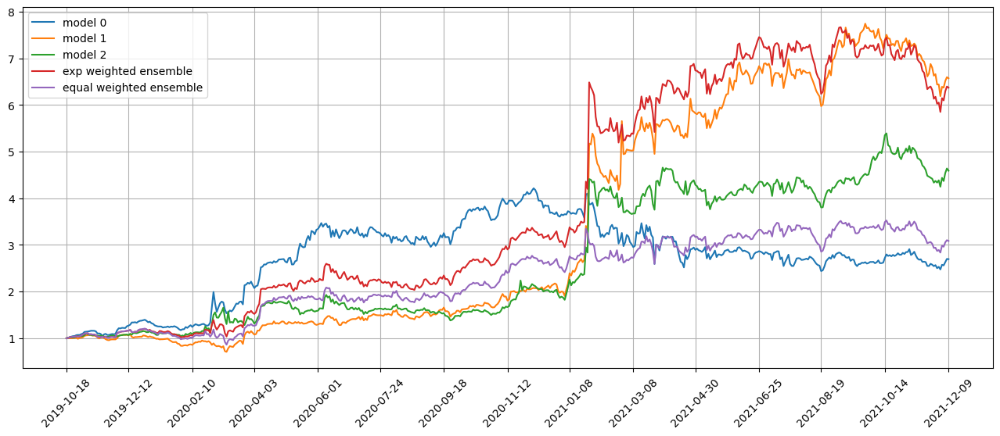

Standardization data are from 2021-02-24 to 2021-07-16
Training data are from 2021-07-19 to 2021-12-07
Testing data are from 2021-11-10 to 2022-01-05
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 28 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0177 - val_loss: 0.0287 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0175 - val_loss: 0.0284 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0174 - val_loss: 0.0296 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0174 - val_loss: 0.0295 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0174 - val_loss: 0.0298 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0173 - val_loss: 0.0291 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 6ms/step - loss: 0.0166 - val_loss: 0.0295 - lr: 0.0012
Epoch 24/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0166 - val_loss: 0.0294 - lr: 0.0012
Epoch 25/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0166 - val_loss: 0.0295 - lr: 0.0012
Epoch 26/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0166 - val_loss: 0.0294 - lr: 0.0012
Epoch 27/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0166 - val_loss: 0.0293 - lr: 0.0010
Epoch 28/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0166 - val_loss: 0.0293 - lr: 0.0010
Epoch 29/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0166 - val_loss: 0.0294 - lr: 0.0010
Epoch 30/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0166 - val_loss: 0.0289 - lr: 0.0010
Epoch 31/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0166 - val_loss

Testing data from 2021-11-17 to 2021-12-15 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2021-12-16 are ['EXPRQ', 'GES', 'SLM', 'PINC', 'FRO', 'DB', 'TGT', 'GTES', 'TV', 'PAGP']
Total asset on 2021-12-17 will be 2.6061969393905726
It should be the same as 2.6061969393906104
top_stocks by model 1 to buy on 2021-12-16 are ['ET', 'HOG', 'TGT', 'NAVI', 'DG', 'TMUS', 'EXPRQ', 'ALSN', 'KLIC', 'KRYS']
Total asset on 2021-12-17 will be 6.334234576602028
It should be the same as 6.334234576602076
top_stocks by model 2 to buy on 2021-12-16 are ['HLT', 'CAL', 'CVE', 'PAGP', 'GTES', 'CQP', 'CAR', 'DCPH', 'LNG', 'TALO']
Total asset on 2021-12-17 will be 4.2913235566558985
It should be the same as 4.291323556655927
top_stocks by return weighted ensemble to buy on 2021-12-16 are ['KRYS', 'ET', 'TELL', 'TV', 'CQP', 'FRO', 'LNG', 'TALO', 'PAGP', 'GTES']
Total asset on 2021-12-17 will be 6.2356903459024
It should be the same as 6.23569034590243
top_stocks by equal weighted ensemble 

top_stocks by model 0 to buy on 2021-12-28 are ['ADP', 'CCOI', 'ADC', 'POWI', 'GUNR', 'CDW', 'PBR', 'SPSC', 'CLB', 'LEG']
Total asset on 2021-12-29 will be 2.8152533843837113
It should be the same as 2.8152533843837473
top_stocks by model 1 to buy on 2021-12-28 are ['SRE', 'CINF', 'DHT', 'BFH', 'SPSC', 'ERJ', 'TXN', 'CNQ', 'CDW', 'DXC']
Total asset on 2021-12-29 will be 6.874983638934973
It should be the same as 6.874983638935017
top_stocks by model 2 to buy on 2021-12-28 are ['POWI', 'KOS', 'NKTR', 'SOXL', 'LEG', 'WIRE', 'ENTA', 'PDBC', 'AEHR', 'ALLK']
Total asset on 2021-12-29 will be 4.854564094729244
It should be the same as 4.854564094729273
top_stocks by return weighted ensemble to buy on 2021-12-28 are ['UDR', 'CCOI', 'WIRE', 'ITUB', 'BFH', 'CLB', 'POWI', 'CDW', 'LEG', 'ALLK']
Total asset on 2021-12-29 will be 6.97629192363541
It should be the same as 6.976291923635443
top_stocks by equal weighted ensemble to buy on 2021-12-28 are ['SPSC', 'UDR', 'CCOI', 'ITUB', 'BFH', 'CLB', 'P

Total asset on 2022-01-06 will be 3.3924872634891834
It should be the same as 3.392487263489206
Testing data from 2021-12-08 to 2022-01-05 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2022-01-06 are ['PR', 'GSHD', 'HII', 'AR', 'CIM', 'OVV', 'EQT', 'PDBC', 'HES', 'AEHR']
Total asset on 2022-01-07 will be 2.7874947701219455
It should be the same as 2.787494770121982
top_stocks by model 1 to buy on 2022-01-06 are ['SYF', 'FCNCA', 'TROW', 'AA', 'VRE', 'PTEN', 'POWI', 'EQT', 'CIM', 'LEG']
Total asset on 2022-01-07 will be 6.906976769933619
It should be the same as 6.906976769933662
top_stocks by model 2 to buy on 2022-01-06 are ['CIVI', 'FCNCA', 'COKE', 'IART', 'CHKP', 'LEG', 'PTEN', 'NKTR', 'CAR', 'EQT']
Total asset on 2022-01-07 will be 4.941248276342254
It should be the same as 4.941248276342285
top_stocks by return weighted ensemble to buy on 2022-01-06 are ['BLKB', 'HII', 'EMLP', 'PDBC', 'PTEN', 'CIM', 'POWI', 'AEHR', 'LEG', 'EQT']
Total asset on 2022-01-07 will b

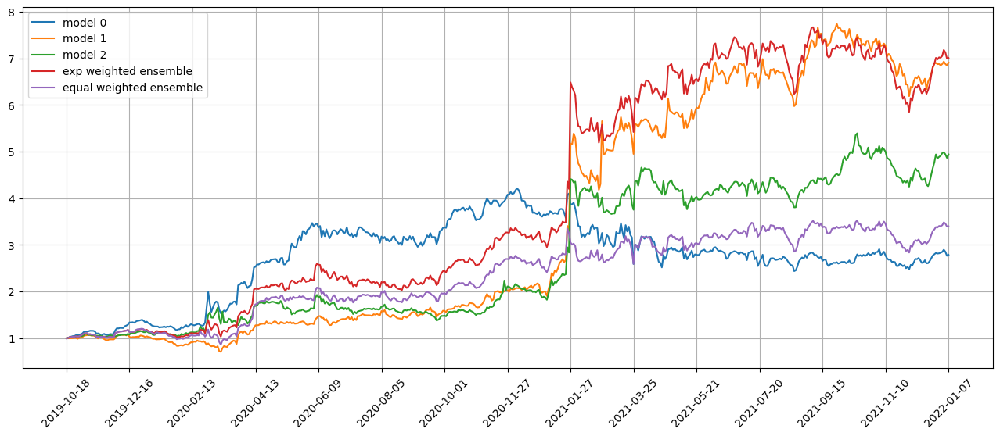

Standardization data are from 2021-03-24 to 2021-08-13
Training data are from 2021-08-16 to 2022-01-05
Testing data are from 2021-12-09 to 2022-02-03
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 29 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0200 - val_loss: 0.0233 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0198 - val_loss: 0.0226 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0195 - val_loss: 0.0242 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0195 - val_loss: 0.0232 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0194 - val_loss: 0.0237 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0193 - val_loss: 0.0231 - lr: 0.0100
Epoch 7/500
146/146 [

Epoch 22: early stopping
46/46 [==============================] - 0s 4ms/step
Model 0 training loss 0.0265889223664999
12/12 [==============================] - 0s 6ms/step
Model 0 test loss 0.042236343026161194
46/46 [==============================] - 0s 3ms/step
Model 1 training loss 0.02673046663403511
12/12 [==============================] - 0s 3ms/step
Model 1 test loss 0.042409155517816544
46/46 [==============================] - 0s 4ms/step
Model 2 training loss 0.02611636370420456
12/12 [==============================] - 0s 4ms/step
Model 2 test loss 0.042090583592653275
Correlations between old and new weights
0.9944630388813429
0.9904192614800867
0.9956982714840814
0.9833085274546844
0.997917146129649
0.9871931864965251
Weight of model 0 is 0.3180350711053966
Weight of model 1 is 0.3179307477706818
Weight of model 2 is 0.3640341811239217
Testing data from 2021-12-09 to 2022-01-06 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2022-01-07 are ['MPC', 'R', 'RE

top_stocks by model 2 to buy on 2022-01-18 are ['PCH', 'VIRT', 'ENTA', 'VGR', 'FAZ', 'VIXY', 'UVXY', 'SBS', 'DNLI', 'ASHR']
Total asset on 2022-01-19 will be 4.863978242440564
It should be the same as 4.863978242440595
top_stocks by return weighted ensemble to buy on 2022-01-18 are ['TECS', 'UUP', 'FCNCA', 'TDC', 'VIXY', 'SBS', 'UVXY', 'ARGX', 'ASHR', 'DNLI']
Total asset on 2022-01-19 will be 6.828747223198718
It should be the same as 6.828747223198756
top_stocks by equal weighted ensemble to buy on 2022-01-18 are ['TECS', 'UUP', 'TDC', 'FCNCA', 'VIXY', 'SBS', 'UVXY', 'ARGX', 'ASHR', 'DNLI']
Total asset on 2022-01-19 will be 3.3085348489613984
It should be the same as 3.308534848961424
Testing data from 2021-12-20 to 2022-01-18 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2022-01-19 are ['EVTC', 'ASML', 'KOLD', 'CSGP', 'COHU', 'LEN', 'WM', 'ATRA', 'TOL', 'EBAY']
Total asset on 2022-01-20 will be 2.7612341575083925
It should be the same as 2.7612341575084285
top_st

Total asset on 2022-01-28 will be 6.2340768635995705
It should be the same as 6.234076863599611
top_stocks by model 2 to buy on 2022-01-27 are ['FTCS', 'CBU', 'GATX', 'APH', 'ITM', 'TEX', 'AAAU', 'DOV', 'SPLV', 'PAYX']
Total asset on 2022-01-28 will be 4.661195343253024
It should be the same as 4.661195343253054
top_stocks by return weighted ensemble to buy on 2022-01-27 are ['CBU', 'FVD', 'ATO', 'FTCS', 'ETN', 'BKH', 'FCN', 'DOV', 'SPLV', 'PAYX']
Total asset on 2022-01-28 will be 6.561304078869289
It should be the same as 6.561304078869329
top_stocks by equal weighted ensemble to buy on 2022-01-27 are ['CBU', 'FVD', 'ATO', 'FTCS', 'ETN', 'BKH', 'FCN', 'DOV', 'SPLV', 'PAYX']
Total asset on 2022-01-28 will be 3.174281206048994
It should be the same as 3.1742812060490166
Testing data from 2021-12-30 to 2022-01-27 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2022-01-28 are ['EGHT', 'CBOE', 'WMT', 'AVT', 'ESPR', 'FCFS', 'FREL', 'ABT', 'IDEX', 'KMB']
Total asset on 202

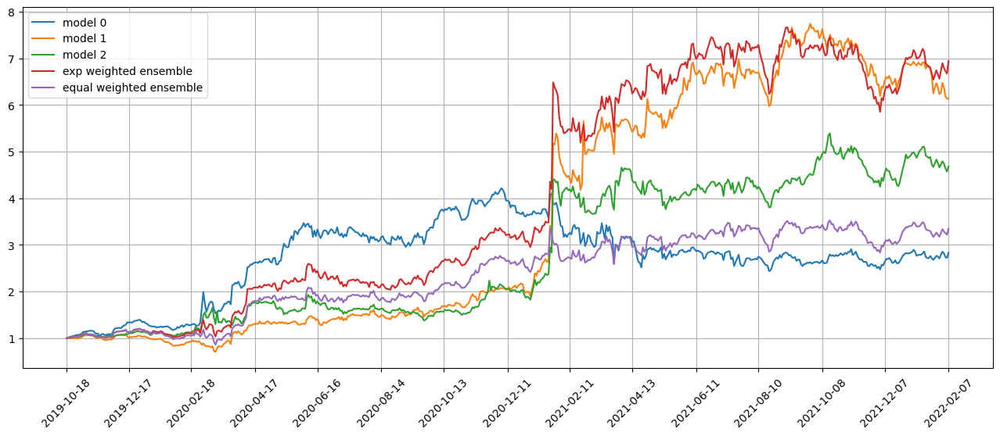

Standardization data are from 2021-04-22 to 2021-09-13
Training data are from 2021-09-14 to 2022-02-03
Testing data are from 2022-01-07 to 2022-03-04
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 30 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0207 - val_loss: 0.0358 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0204 - val_loss: 0.0346 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0202 - val_loss: 0.0359 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0202 - val_loss: 0.0348 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0200 - val_loss: 0.0368 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0199 - val_loss: 0.0343 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 6ms/step - loss: 0.0194 - val_loss: 0.0343 - lr: 0.0050
Epoch 9/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0194 - val_loss: 0.0348 - lr: 0.0050
Epoch 10/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0194 - val_loss: 0.0356 - lr: 0.0050
Epoch 11/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0193 - val_loss: 0.0342 - lr: 0.0050
Epoch 12/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0193 - val_loss: 0.0350 - lr: 0.0050
Epoch 13/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0193 - val_loss: 0.0345 - lr: 0.0050
Epoch 14/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0191 - val_loss: 0.0349 - lr: 0.0025
Epoch 15/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0191 - val_loss: 0.0348 - lr: 0.0025
Epoch 16/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0191 - val_loss:

Total asset on 2022-02-11 will be 2.854033840236024
It should be the same as 2.8540338402360645
top_stocks by model 1 to buy on 2022-02-10 are ['COHR', 'DIOD', 'GWW', 'DEO', 'SAM', 'BJ', 'CHE', 'APH', 'ORLY', 'SLAB']
Total asset on 2022-02-11 will be 6.315848197215262
It should be the same as 6.315848197215306
top_stocks by model 2 to buy on 2022-02-10 are ['SPWR', 'TSCO', 'SMTC', 'CALX', 'INSG', 'MXL', 'GTLS', 'BRO', 'BJ', 'NIU']
Total asset on 2022-02-11 will be 4.7314607972000555
It should be the same as 4.731460797200085
top_stocks by return weighted ensemble to buy on 2022-02-10 are ['GPK', 'ORLY', 'DEO', 'SMTC', 'INSG', 'SAM', 'TSCO', 'BRO', 'GTLS', 'BJ']
Total asset on 2022-02-11 will be 6.945293883927997
It should be the same as 6.945293883928045
top_stocks by equal weighted ensemble to buy on 2022-02-10 are ['GPK', 'SMTC', 'DEO', 'INSG', 'ORLY', 'SAM', 'TSCO', 'BRO', 'GTLS', 'BJ']
Total asset on 2022-02-11 will be 3.34310656709938
It should be the same as 3.343106567099404
Tes

Total asset on 2022-02-23 will be 2.69454665807411
It should be the same as 2.69454665807415
top_stocks by model 1 to buy on 2022-02-22 are ['OVV', 'TECK', 'CVX', 'MDLZ', 'UMBF', 'STZ', 'KOS', 'PEP', 'SLB', 'UE']
Total asset on 2022-02-23 will be 6.130856087508544
It should be the same as 6.130856087508583
top_stocks by model 2 to buy on 2022-02-22 are ['NOG', 'STZ', 'ERX', 'EQNR', 'SM', 'KOS', 'VRN', 'MGY', 'MTDR', 'CENN']
Total asset on 2022-02-23 will be 4.146573250331229
It should be the same as 4.14657325033126
top_stocks by return weighted ensemble to buy on 2022-02-22 are ['SM', 'ERX', 'MTDR', 'CENN', 'OVV', 'CAR', 'VRN', 'EQNR', 'STZ', 'KOS']
Total asset on 2022-02-23 will be 6.257558673109362
It should be the same as 6.257558673109407
top_stocks by equal weighted ensemble to buy on 2022-02-22 are ['NOG', 'ERX', 'CENN', 'MTDR', 'OVV', 'CAR', 'VRN', 'EQNR', 'STZ', 'KOS']
Total asset on 2022-02-23 will be 2.996638146034443
It should be the same as 2.9966381460344698
Testing data 

Total asset on 2022-03-04 will be 2.7461115004167707
It should be the same as 2.7461115004168106
top_stocks by model 1 to buy on 2022-03-03 are ['PIPR', 'AAAU', 'AYI', 'KLIC', 'DRIP', 'WIX', 'SDS', 'RVNC', 'ERY', 'TPIC']
Total asset on 2022-03-04 will be 6.264496282674553
It should be the same as 6.264496282674591
top_stocks by model 2 to buy on 2022-03-03 are ['SNDX', 'OPK', 'FORM', 'KLIC', 'EPAM', 'KOD', 'TECS', 'SDS', 'DXD', 'SRTY']
Total asset on 2022-03-04 will be 4.355251461515065
It should be the same as 4.355251461515094
top_stocks by return weighted ensemble to buy on 2022-03-03 are ['AAAU', 'KLIC', 'ERY', 'TPIC', 'TFLO', 'DXD', 'SRTY', 'TECS', 'KOD', 'SDS']
Total asset on 2022-03-04 will be 6.362400768152596
It should be the same as 6.362400768152644
top_stocks by equal weighted ensemble to buy on 2022-03-03 are ['AAAU', 'KLIC', 'ERY', 'TPIC', 'DXD', 'TFLO', 'SRTY', 'TECS', 'KOD', 'SDS']
Total asset on 2022-03-04 will be 3.0169766580362936
It should be the same as 3.016976658

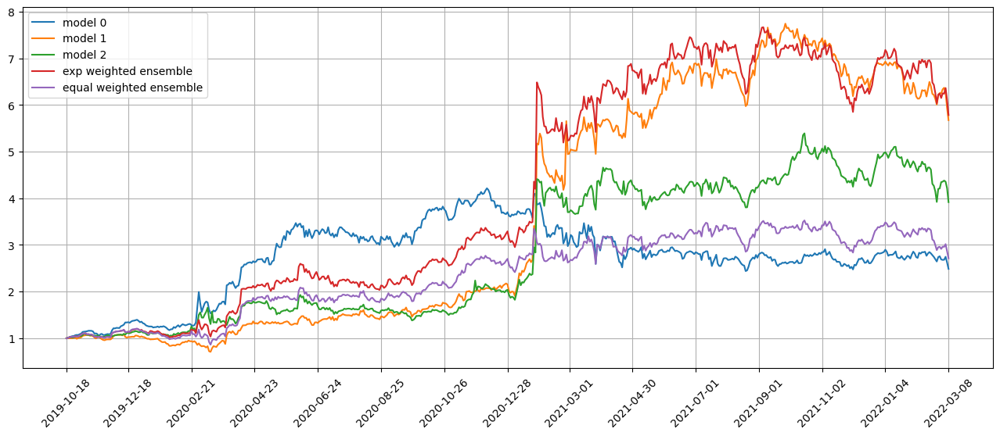

Standardization data are from 2021-05-20 to 2021-10-11
Training data are from 2021-10-12 to 2022-03-04
Testing data are from 2022-02-07 to 2022-04-01
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 31 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0230 - val_loss: 0.0470 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0225 - val_loss: 0.0466 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0223 - val_loss: 0.0502 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0221 - val_loss: 0.0494 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0220 - val_loss: 0.0492 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0219 - val_loss: 0.0455 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 6ms/step - loss: 0.0216 - val_loss: 0.0488 - lr: 0.0100
Epoch 12/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0215 - val_loss: 0.0479 - lr: 0.0100
Epoch 13/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0215 - val_loss: 0.0480 - lr: 0.0100
Epoch 14/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0211 - val_loss: 0.0476 - lr: 0.0050
Epoch 15/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0211 - val_loss: 0.0477 - lr: 0.0050
Epoch 16/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0211 - val_loss: 0.0481 - lr: 0.0050
Epoch 17/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0210 - val_loss: 0.0482 - lr: 0.0050
Epoch 18/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0210 - val_loss: 0.0454 - lr: 0.0050
Epoch 19/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0208 - val_loss

top_stocks by model 2 to buy on 2022-03-14 are ['ALLK', 'DRIP', 'BAX', 'YUMC', 'BGS', 'MDLZ', 'PSA', 'IRTC', 'K', 'KMB']
Total asset on 2022-03-15 will be 4.284926248667648
It should be the same as 4.284926248667677
top_stocks by return weighted ensemble to buy on 2022-03-14 are ['TM', 'CAG', 'BAX', 'MDLZ', 'DRIP', 'CPB', 'YUMC', 'K', 'SE', 'KMB']
Total asset on 2022-03-15 will be 6.464558747050997
It should be the same as 6.464558747051044
top_stocks by equal weighted ensemble to buy on 2022-03-14 are ['TM', 'CAG', 'BAX', 'MDLZ', 'DRIP', 'CPB', 'YUMC', 'K', 'SE', 'KMB']
Total asset on 2022-03-15 will be 3.0089848464192572
It should be the same as 3.008984846419284
Testing data from 2022-02-14 to 2022-03-14 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2022-03-15 are ['QTEC', 'SQ', 'LNG', 'GSG', 'VET', 'ESTC', 'TDOC', 'BNO', 'TWLO', 'NTRA']
Total asset on 2022-03-16 will be 2.8897174670837695
It should be the same as 2.8897174670838117
top_stocks by model 1 to buy 

top_stocks by model 2 to buy on 2022-03-23 are ['STNE', 'POST', 'NTRA', 'RVNC', 'ALLK', 'MNRO', 'ITGR', 'HRTX', 'KOD', 'DPST']
Total asset on 2022-03-24 will be 4.962063697010915
It should be the same as 4.962063697010944
top_stocks by return weighted ensemble to buy on 2022-03-23 are ['PRPL', 'SCO', 'LABU', 'MNRO', 'NTRA', 'ITGR', 'YEXT', 'STNE', 'DPST', 'KOD']
Total asset on 2022-03-24 will be 7.436957036102725
It should be the same as 7.436957036102768
top_stocks by equal weighted ensemble to buy on 2022-03-23 are ['PRPL', 'SCO', 'LABU', 'MNRO', 'NTRA', 'ITGR', 'YEXT', 'DPST', 'STNE', 'KOD']
Total asset on 2022-03-24 will be 3.472409865516657
It should be the same as 3.472409865516685
Testing data from 2022-02-24 to 2022-03-23 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2022-03-24 are ['QTEC', 'AVGO', 'GPS', 'IDEX', 'TDOC', 'CRL', 'PCTY', 'BYON', 'DPST', 'LABU']
Total asset on 2022-03-25 will be 3.313726142517156
It should be the same as 3.3137261425172
top_st

Total asset on 2022-04-04 will be 4.99492492200589
It should be the same as 4.994924922005919
top_stocks by return weighted ensemble to buy on 2022-04-01 are ['C', 'WTS', 'IRTC', 'MTB', 'TCOM', 'SMFG', 'NVR', 'USB', 'LOW', 'SNBR']
Total asset on 2022-04-04 will be 7.363558361242763
It should be the same as 7.3635583612428075
top_stocks by equal weighted ensemble to buy on 2022-04-01 are ['IRTC', 'C', 'WTS', 'MTB', 'SMFG', 'TCOM', 'NVR', 'USB', 'LOW', 'SNBR']
Total asset on 2022-04-04 will be 3.4159634093886444
It should be the same as 3.4159634093886746
Testing data from 2022-03-07 to 2022-04-01 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2022-04-04 are ['PLCE', 'USO', 'BNO', 'LABU', 'EQNR', 'VET', 'CF', 'SRTY', 'UCO', 'USFR']
Total asset on 2022-04-05 will be 3.241894807711281
It should be the same as 3.2418948077113274
top_stocks by model 1 to buy on 2022-04-04 are ['MOS', 'RRC', 'AA', 'DBC', 'EQNR', 'USO', 'GSG', 'BNO', 'CF', 'UCO']
Total asset on 2022-04-05 w

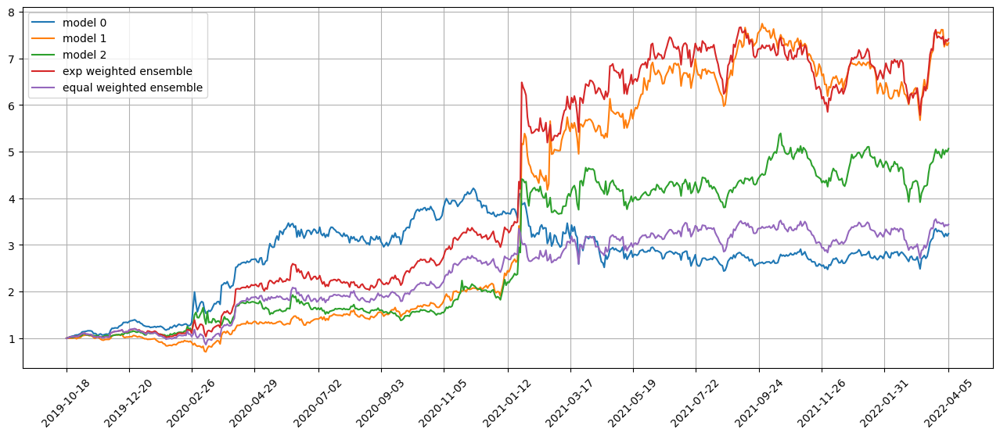

Standardization data are from 2021-06-18 to 2021-11-08
Training data are from 2021-11-09 to 2022-04-01
Testing data are from 2022-03-08 to 2022-05-02
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 32 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0261 - val_loss: 0.0259 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0253 - val_loss: 0.0260 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0251 - val_loss: 0.0256 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0250 - val_loss: 0.0262 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0248 - val_loss: 0.0271 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0248 - val_loss: 0.0260 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 6ms/step - loss: 0.0233 - val_loss: 0.0266 - lr: 0.0010
Epoch 46/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0232 - val_loss: 0.0265 - lr: 0.0010
Epoch 47/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0232 - val_loss: 0.0266 - lr: 0.0010
Epoch 48/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0232 - val_loss: 0.0265 - lr: 0.0010
Epoch 48: early stopping
Epoch 1/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0259 - val_loss: 0.0271 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0253 - val_loss: 0.0256 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0251 - val_loss: 0.0268 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0249 - val_loss: 0.0263 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 6ms/step - los

top_stocks by model 2 to buy on 2022-04-08 are ['BFH', 'TFIN', 'MPWR', 'MTSI', 'TNL', 'SLM', 'GT', 'CCL', 'KOD', 'RYAAY']
Total asset on 2022-04-11 will be 4.589540216326102
It should be the same as 4.589540216326131
top_stocks by return weighted ensemble to buy on 2022-04-08 are ['WLK', 'MTSI', 'AX', 'SMTC', 'VRTS', 'TFIN', 'LSCC', 'CCL', 'MPWR', 'SLM']
Total asset on 2022-04-11 will be 6.8557258059301605
It should be the same as 6.8557258059302
top_stocks by equal weighted ensemble to buy on 2022-04-08 are ['WLK', 'MTSI', 'AX', 'SMTC', 'VRTS', 'TFIN', 'LSCC', 'CCL', 'SLM', 'MPWR']
Total asset on 2022-04-11 will be 3.190778565037168
It should be the same as 3.190778565037202
Testing data from 2022-03-14 to 2022-04-08 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2022-04-11 are ['WDFC', 'WSFS', 'TCBI', 'SFBS', 'AVNT', 'UMBF', 'LEA', 'LABD', 'VRTS', 'SRTY']
Total asset on 2022-04-12 will be 3.1076250415553672
It should be the same as 3.107625041555416
top_stocks by 

Total asset on 2022-04-21 will be 6.819826449325061
It should be the same as 6.819826449325098
top_stocks by equal weighted ensemble to buy on 2022-04-20 are ['BTU', 'NTRS', 'ERY', 'MOMO', 'GNRC', 'CSCO', 'PRPL', 'OMCL', 'WIT', 'CHRS']
Total asset on 2022-04-21 will be 3.1568732222832727
It should be the same as 3.1568732222833096
Testing data from 2022-03-23 to 2022-04-20 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2022-04-21 are ['LABD', 'GEN', 'PMT', 'DXD', 'AGNC', 'JKS', 'HMY', 'ARR', 'VKTX', 'SRTY']
Total asset on 2022-04-22 will be 3.043944748313519
It should be the same as 3.0439447483135673
top_stocks by model 1 to buy on 2022-04-21 are ['TMF', 'ATSG', 'HESM', 'IONS', 'BTU', 'MOS', 'LNG', 'CF', 'TELL', 'SRTY']
Total asset on 2022-04-22 will be 6.469799695866035
It should be the same as 6.469799695866075
top_stocks by model 2 to buy on 2022-04-21 are ['BAC.PL', 'ATRA', 'VKTX', 'KOD', 'ORC', 'GPRE', 'TMF', 'CLM', 'ARR', 'SRTY']
Total asset on 2022-04-22 wil

Total asset on 2022-05-02 will be 5.944406487182113
It should be the same as 5.944406487182151
top_stocks by equal weighted ensemble to buy on 2022-04-29 are ['ARKW', 'DOMO', 'EB', 'TQQQ', 'DAY', 'UCO', 'PACB', 'ARKK', 'CVNA', 'SE']
Total asset on 2022-05-02 will be 2.7495989329464425
It should be the same as 2.749598932946479
Testing data from 2022-04-01 to 2022-04-29 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2022-05-02 are ['CSTM', 'TNET', 'TROW', 'ADP', 'PRKS', 'BLK', 'RPD', 'SRTY', 'MSFT', 'BAND']
Total asset on 2022-05-03 will be 2.6707192229307237
It should be the same as 2.670719222930774
top_stocks by model 1 to buy on 2022-05-02 are ['RPD', 'MGY', 'EURN', 'GUSH', 'HAL', 'PRKS', 'MRO', 'CRK', 'RRC', 'ENOV']
Total asset on 2022-05-03 will be 6.015006912674117
It should be the same as 6.015006912674158
top_stocks by model 2 to buy on 2022-05-02 are ['OII', 'SRTY', 'ALTR', 'CARG', 'RPD', 'RYTM', 'TQQQ', 'PACB', 'LABU', 'RDFN']
Total asset on 2022-05-03 wil

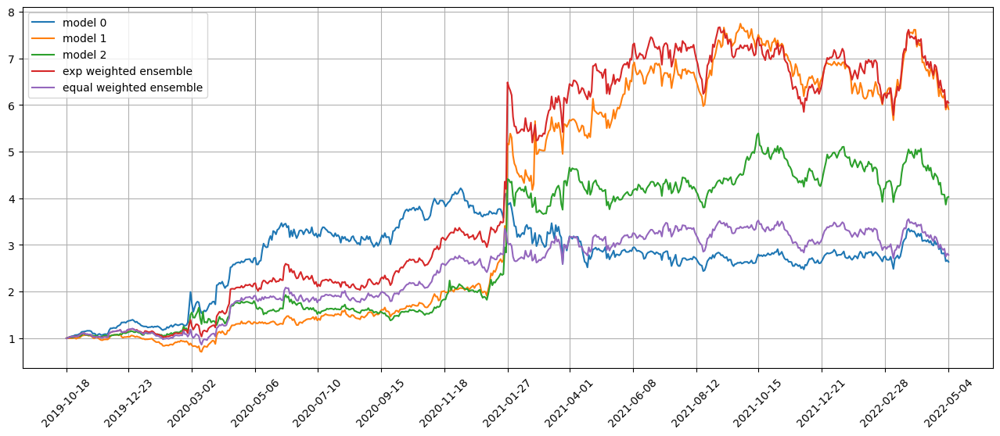

Standardization data are from 2021-07-19 to 2021-12-07
Training data are from 2021-12-08 to 2022-05-02
Testing data are from 2022-04-05 to 2022-05-31
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 33 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0267 - val_loss: 0.0328 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0262 - val_loss: 0.0334 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0260 - val_loss: 0.0338 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0257 - val_loss: 0.0335 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0257 - val_loss: 0.0332 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0256 - val_loss: 0.0330 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 6ms/step - loss: 0.0244 - val_loss: 0.0333 - lr: 0.0012
Epoch 20/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0244 - val_loss: 0.0335 - lr: 0.0012
Epoch 21/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0244 - val_loss: 0.0331 - lr: 0.0012
Epoch 22/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0243 - val_loss: 0.0336 - lr: 0.0012
Epoch 22: early stopping
46/46 [==============================] - 0s 4ms/step
Model 0 training loss 0.030038034543395042
12/12 [==============================] - 0s 4ms/step
Model 0 test loss 0.04238889366388321
46/46 [==============================] - 0s 4ms/step
Model 1 training loss 0.028703179210424423
12/12 [==============================] - 0s 4ms/step
Model 1 test loss 0.043492816388607025
46/46 [==============================] - 0s 4ms/step
Model 2 training loss 0.031051119789481163
12/12 [==============================] - 0s 4ms/step
Mode

Total asset on 2022-05-12 will be 2.459171751668749
It should be the same as 2.4591717516687845
Testing data from 2022-04-13 to 2022-05-11 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2022-05-12 are ['HUN', 'BAND', 'MAIN', 'RPD', 'EVA', 'KRNT', 'ODFL', 'JBHT', 'SRTY', 'CVNA']
Total asset on 2022-05-13 will be 2.301089461686727
It should be the same as 2.3010894616867787
top_stocks by model 1 to buy on 2022-05-12 are ['EVA', 'HRTX', 'SQQQ', 'JBHT', 'SOXS', 'BDC', 'SDS', 'KRNT', 'MIDD', 'SRTY']
Total asset on 2022-05-13 will be 5.164617020305054
It should be the same as 5.164617020305094
top_stocks by model 2 to buy on 2022-05-12 are ['MUB', 'LH', 'KBR', 'ANY', 'SRTY', 'QD', 'RPD', 'NTRA', 'SABR', 'CVNA']
Total asset on 2022-05-13 will be 3.565224367865234
It should be the same as 3.5652243678652678
top_stocks by return weighted ensemble to buy on 2022-05-12 are ['SQQQ', 'QD', 'SDS', 'JBHT', 'BDC', 'EVA', 'RPD', 'KRNT', 'CVNA', 'SRTY']
Total asset on 2022-05-13 will

Total asset on 2022-05-23 will be 2.7733316792561125
It should be the same as 2.773331679256149
Testing data from 2022-04-25 to 2022-05-20 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2022-05-23 are ['CHEF', 'HLF', 'SCHX', 'WTW', 'PFGC', 'WBA', 'HTGC', 'SAVE', 'SIGA', 'EME']
Total asset on 2022-05-24 will be 2.401509257146914
It should be the same as 2.4015092571469667
top_stocks by model 1 to buy on 2022-05-23 are ['APPN', 'EME', 'DXD', 'ROST', 'WING', 'BHC', 'SDS', 'WGO', 'SAVE', 'SRTY']
Total asset on 2022-05-24 will be 5.887655878220703
It should be the same as 5.887655878220743
top_stocks by model 2 to buy on 2022-05-23 are ['AZUL', 'NOK', 'MAIN', 'J', 'FTSL', 'PFGC', 'WDAY', 'SAVE', 'VRSN', 'AZPN']
Total asset on 2022-05-24 will be 3.7212321976928724
It should be the same as 3.721232197692906
top_stocks by return weighted ensemble to buy on 2022-05-23 are ['WGO', 'WTW', 'MAIN', 'SRTY', 'ROST', 'PFGC', 'HTGC', 'VRSN', 'EME', 'SAVE']
Total asset on 2022-05-24 

Total asset on 2022-06-02 will be 6.545801662195053
It should be the same as 6.545801662195099
top_stocks by equal weighted ensemble to buy on 2022-06-01 are ['FND', 'URBN', 'EYE', 'DKS', 'BHC', 'EDU', 'ANF', 'AZPN', 'SIGA', 'CVNA']
Total asset on 2022-06-02 will be 3.037233026777106
It should be the same as 3.0372330267771432
Model 0 changed -5.450527415401845 percent from 2021-12-09 to 2022-06-02
Model 1 changed -5.287259567381871 percent from 2021-12-09 to 2022-06-02
Model 2 changed -9.821117441258027 percent from 2021-12-09 to 2022-06-02


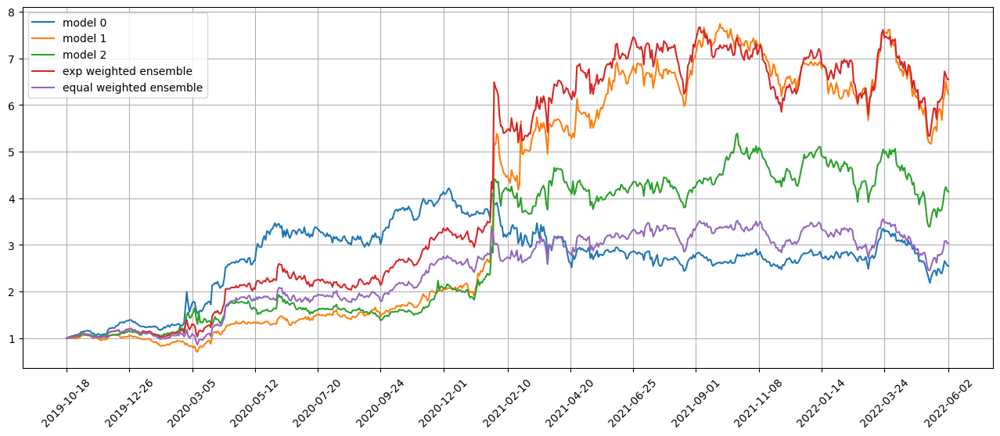

Standardization data are from 2021-08-16 to 2022-01-05
Training data are from 2022-01-06 to 2022-05-31
Testing data are from 2022-05-04 to 2022-06-29
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 34 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0280 - val_loss: 0.0366 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0273 - val_loss: 0.0360 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0269 - val_loss: 0.0363 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0267 - val_loss: 0.0374 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0266 - val_loss: 0.0359 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0264 - val_loss: 0.0370 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 6ms/step - loss: 0.0257 - val_loss: 0.0372 - lr: 0.0050
Epoch 10/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0256 - val_loss: 0.0380 - lr: 0.0050
Epoch 11/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0256 - val_loss: 0.0380 - lr: 0.0050
Epoch 12/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0255 - val_loss: 0.0377 - lr: 0.0050
Epoch 13/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0253 - val_loss: 0.0371 - lr: 0.0025
Epoch 14/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0253 - val_loss: 0.0372 - lr: 0.0025
Epoch 15/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0252 - val_loss: 0.0380 - lr: 0.0025
Epoch 16/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0252 - val_loss: 0.0369 - lr: 0.0025
Epoch 17/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0252 - val_loss

Testing data from 2022-05-11 to 2022-06-08 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2022-06-09 are ['ALT', 'ARKG', 'SHOP', 'BRFS', 'SCO', 'NEO', 'LABD', 'CVNA', 'ERY', 'AZPN']
Total asset on 2022-06-10 will be 2.6749743158068826
It should be the same as 2.674974315806934
top_stocks by model 1 to buy on 2022-06-09 are ['PODD', 'ODFL', 'WSC', 'SQQQ', 'FATE', 'WDAY', 'DXD', 'SDS', 'SIGA', 'AZPN']
Total asset on 2022-06-10 will be 6.461699526929003
It should be the same as 6.46169952692904
top_stocks by model 2 to buy on 2022-06-09 are ['IAG', 'NFLX', 'PTCT', 'WMT', 'WDAY', 'SQQQ', 'BCPC', 'AZPN', 'AMZN', 'SRTY']
Total asset on 2022-06-10 will be 4.124887141278447
It should be the same as 4.12488714127848
top_stocks by return weighted ensemble to buy on 2022-06-09 are ['PODD', 'ODFL', 'SQQQ', 'WDAY', 'WSC', 'BCPC', 'SRTY', 'ERY', 'CVNA', 'AZPN']
Total asset on 2022-06-10 will be 6.702308259370636
It should be the same as 6.702308259370679
top_stocks by equal weigh

Testing data from 2022-05-20 to 2022-06-17 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2022-06-21 are ['IRTC', 'EOG', 'KRYS', 'ARCB', 'GATX', 'RILY', 'GUSH', 'MATX', 'YINN', 'EDU']
Total asset on 2022-06-22 will be 2.4892756773327176
It should be the same as 2.4892756773327678
top_stocks by model 1 to buy on 2022-06-21 are ['EXPRQ', 'MAA', 'GTN', 'YINN', 'UNFI', 'FRO', 'GBTC', 'RILY', 'NFG', 'EDU']
Total asset on 2022-06-22 will be 6.3288798835148965
It should be the same as 6.328879883514936
top_stocks by model 2 to buy on 2022-06-21 are ['WMS', 'NAT', 'SXT', 'SPGI', 'NTNX', 'UNFI', 'SONY', 'J', 'UL', 'EDU']
Total asset on 2022-06-22 will be 3.8988992626962196
It should be the same as 3.898899262696255
top_stocks by return weighted ensemble to buy on 2022-06-21 are ['SONY', 'NTNX', 'GATX', 'GTN', 'RILY', 'UL', 'MATX', 'UNFI', 'YINN', 'EDU']
Total asset on 2022-06-22 will be 6.497895323490815
It should be the same as 6.497895323490862
top_stocks by equal weighted

Total asset on 2022-06-30 will be 3.367117044671779
It should be the same as 3.367117044671817
Testing data from 2022-06-01 to 2022-06-29 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2022-06-30 are ['TSLA', 'MXL', 'NXPI', 'RITM', 'AVGO', 'F', 'SRTY', 'BANC', 'HZO', 'EDU']
Total asset on 2022-07-01 will be 2.704943355671546
It should be the same as 2.704943355671595
top_stocks by model 1 to buy on 2022-06-30 are ['EYE', 'ORCL', 'HIBB', 'AN', 'HIMX', 'ARCB', 'FLR', 'YINN', 'SRTY', 'GBTC']
Total asset on 2022-07-01 will be 6.849280229454469
It should be the same as 6.849280229454507
top_stocks by model 2 to buy on 2022-06-30 are ['AG', 'M', 'SHOP', 'UHAL', 'SVC', 'MEOH', 'WAB', 'DUST', 'SIX', 'RWT']
Total asset on 2022-07-01 will be 4.415101781491173
It should be the same as 4.415101781491208
top_stocks by return weighted ensemble to buy on 2022-06-30 are ['SIG', 'BLD', 'HZO', 'WAB', 'UHAL', 'M', 'F', 'GBTC', 'BANC', 'ARCB']
Total asset on 2022-07-01 will be 7.293900

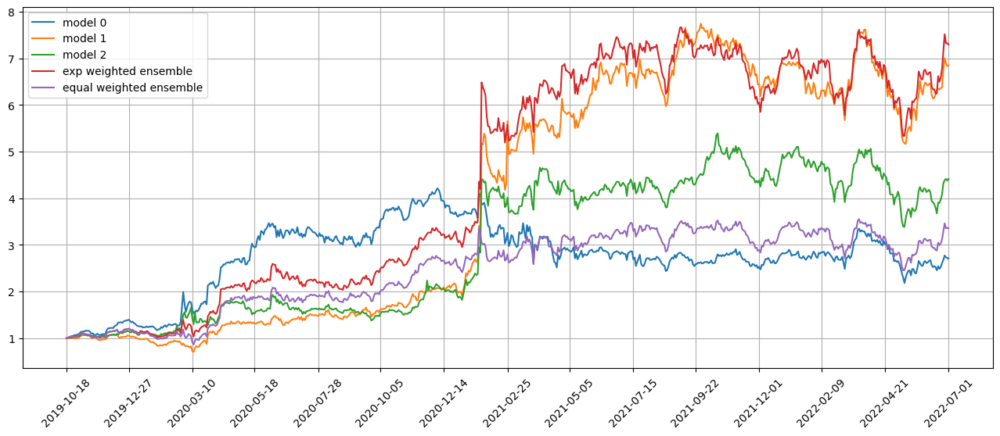

Standardization data are from 2021-09-14 to 2022-02-03
Training data are from 2022-02-04 to 2022-06-29
Testing data are from 2022-06-02 to 2022-07-28
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 35 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0265 - val_loss: 0.0414 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0259 - val_loss: 0.0399 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0257 - val_loss: 0.0407 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0256 - val_loss: 0.0429 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0255 - val_loss: 0.0408 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0254 - val_loss: 0.0429 - lr: 0.0100
Epoch 7/500
146/146 [

Epoch 22: early stopping
46/46 [==============================] - 0s 3ms/step
Model 0 training loss 0.029813427478075027
12/12 [==============================] - 0s 3ms/step
Model 0 test loss 0.030980080366134644
46/46 [==============================] - 0s 4ms/step
Model 1 training loss 0.03067314811050892
12/12 [==============================] - 0s 4ms/step
Model 1 test loss 0.031015345826745033
46/46 [==============================] - 0s 4ms/step
Model 2 training loss 0.030580250546336174
12/12 [==============================] - 0s 4ms/step
Model 2 test loss 0.030494602397084236
Correlations between old and new weights
0.9980345917692368
0.9953205668576898
0.9964320958581901
0.9920447047426436
0.9977360125773548
0.9906458817561091
Weight of model 0 is 0.33927016434171114
Weight of model 1 is 0.3465608015083941
Weight of model 2 is 0.3141690341498948
Testing data from 2022-06-02 to 2022-06-30 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2022-07-01 are ['KEY', 'GL

Total asset on 2022-07-13 will be 2.61846837302542
It should be the same as 2.6184683730254683
top_stocks by model 1 to buy on 2022-07-12 are ['QID', 'GSHD', 'AWI', 'RHI', 'ENTG', 'URA', 'CDLX', 'SYNA', 'WOLF', 'SOXS']
Total asset on 2022-07-13 will be 6.970442930336698
It should be the same as 6.970442930336737
top_stocks by model 2 to buy on 2022-07-12 are ['PCAR', 'IGT', 'GMS', 'RDFN', 'SYNA', 'LSCC', 'GSHD', 'EB', 'PIPR', 'MGNX']
Total asset on 2022-07-13 will be 4.307198524262434
It should be the same as 4.307198524262472
top_stocks by return weighted ensemble to buy on 2022-07-12 are ['URA', 'HI', 'GSHD', 'ITT', 'ENTG', 'CCJ', 'UPBD', 'WOLF', 'PIPR', 'SYNA']
Total asset on 2022-07-13 will be 7.133482304234847
It should be the same as 7.133482304234905
top_stocks by equal weighted ensemble to buy on 2022-07-12 are ['AMAT', 'HI', 'ENTG', 'GSHD', 'CCJ', 'ITT', 'UPBD', 'WOLF', 'PIPR', 'SYNA']
Total asset on 2022-07-13 will be 3.276973624673143
It should be the same as 3.2769736246731

top_stocks by model 0 to buy on 2022-07-21 are ['SIL', 'PRG', 'WPM', 'FSM', 'AG', 'IAG', 'AGQ', 'EXK', 'CDE', 'EDU']
Total asset on 2022-07-22 will be 2.896903307612881
It should be the same as 2.896903307612929
top_stocks by model 1 to buy on 2022-07-21 are ['PAAS', 'CHD', 'RCKT', 'DBRG', 'TMHC', 'EHC', 'CHRS', 'KOLD', 'RYTM', 'EDU']
Total asset on 2022-07-22 will be 7.862122203333339
It should be the same as 7.862122203333378
top_stocks by model 2 to buy on 2022-07-21 are ['HIMX', 'CDE', 'HMC', 'EHC', 'EXK', 'DBRG', 'TM', 'NAIL', 'JNUG', 'KOLD']
Total asset on 2022-07-22 will be 4.745553552663871
It should be the same as 4.745553552663915
top_stocks by return weighted ensemble to buy on 2022-07-21 are ['SIL', 'EHC', 'AG', 'DBRG', 'CDE', 'PAAS', 'WPM', 'EXK', 'EDU', 'KOLD']
Total asset on 2022-07-22 will be 7.860063329687711
It should be the same as 7.860063329687772
top_stocks by equal weighted ensemble to buy on 2022-07-21 are ['SIL', 'EHC', 'AG', 'DBRG', 'CDE', 'PAAS', 'WPM', 'EXK'

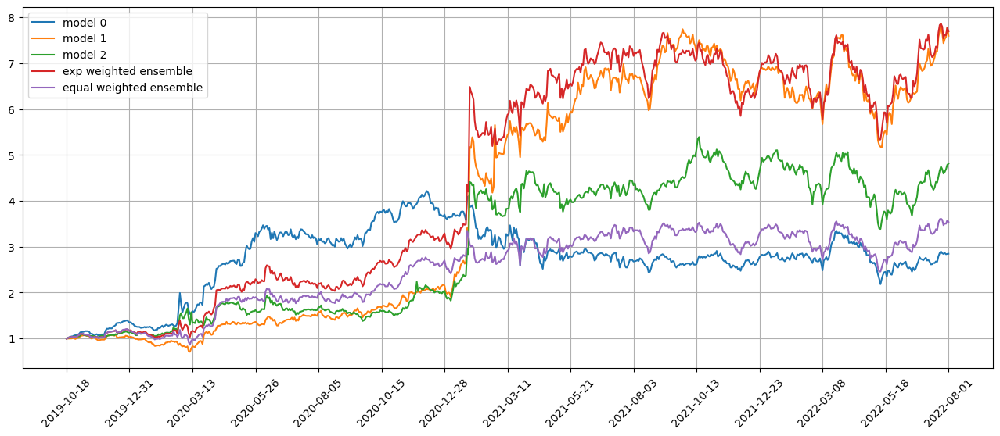

Standardization data are from 2021-10-12 to 2022-03-04
Training data are from 2022-03-07 to 2022-07-28
Testing data are from 2022-07-01 to 2022-08-25
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 36 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0287 - val_loss: 0.0270 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0279 - val_loss: 0.0267 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0275 - val_loss: 0.0266 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0273 - val_loss: 0.0269 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0271 - val_loss: 0.0271 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0271 - val_loss: 0.0266 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 8ms/step - loss: 0.0257 - val_loss: 0.0266 - lr: 0.0012
Epoch 26/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0258 - val_loss: 0.0267 - lr: 0.0012
Epoch 27/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0257 - val_loss: 0.0265 - lr: 0.0010
Epoch 28/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0257 - val_loss: 0.0268 - lr: 0.0010
Epoch 29/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0257 - val_loss: 0.0268 - lr: 0.0010
Epoch 30/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0257 - val_loss: 0.0265 - lr: 0.0010
Epoch 31/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0257 - val_loss: 0.0264 - lr: 0.0010
Epoch 31: early stopping
Epoch 1/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0290 - val_loss: 0.0270 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 6ms/step - 

Total asset on 2022-08-03 will be 3.60733957932713
It should be the same as 3.6073395793271663
Testing data from 2022-07-06 to 2022-08-02 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2022-08-03 are ['ALGN', 'AMZN', 'SNAP', 'TENB', 'NIU', 'BAND', 'BHC', 'YINN', 'SIGA', 'EDU']
Total asset on 2022-08-04 will be 3.034716553438643
It should be the same as 3.0347165534386926
top_stocks by model 1 to buy on 2022-08-03 are ['PHM', 'TTD', 'TENB', 'VRNS', 'CCS', 'SHOP', 'SIGA', 'YINN', 'GSK', 'EDU']
Total asset on 2022-08-04 will be 7.893056327510205
It should be the same as 7.893056327510245
top_stocks by model 2 to buy on 2022-08-03 are ['VRNS', 'TENB', 'IIPR', 'OKTA', 'YEXT', 'NIU', 'ZUO', 'RAMP', 'SIGA', 'AMZN']
Total asset on 2022-08-04 will be 5.045250581740624
It should be the same as 5.045250581740671
top_stocks by return weighted ensemble to buy on 2022-08-03 are ['TTD', 'ALGN', 'VRNS', 'OKTA', 'BAND', 'NIU', 'TENB', 'YINN', 'SIGA', 'EDU']
Total asset on 2022-08-04

Testing data from 2022-07-15 to 2022-08-11 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2022-08-12 are ['TWLO', 'TREE', 'MTCH', 'RAMP', 'EDU', 'AMZN', 'GSK', 'GOOG', 'GOOGL', 'ISTB']
Total asset on 2022-08-15 will be 3.1556444420418766
It should be the same as 3.1556444420419263
top_stocks by model 1 to buy on 2022-08-12 are ['RAMP', 'WKHS', 'XPO', 'TWLO', 'CZR', 'SHOP', 'GSK', 'AMZN', 'GOOGL', 'GOOG']
Total asset on 2022-08-15 will be 7.973662066095636
It should be the same as 7.973662066095678
top_stocks by model 2 to buy on 2022-08-12 are ['APPS', 'TWLO', 'MXL', 'ISTB', 'RAMP', 'WK', 'SIGA', 'GSK', 'GOOG', 'GOOGL']
Total asset on 2022-08-15 will be 5.26075605012676
It should be the same as 5.2607560501268065
top_stocks by return weighted ensemble to buy on 2022-08-12 are ['SIGA', 'AMZN', 'SHOP', 'CZR', 'WK', 'TWLO', 'RAMP', 'GSK', 'GOOG', 'GOOGL']
Total asset on 2022-08-15 will be 8.567805352614556
It should be the same as 8.56780535261462
top_stocks by equal w

Testing data from 2022-07-26 to 2022-08-22 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2022-08-23 are ['WK', 'ROKU', 'PEGA', 'EB', 'RPD', 'TREE', 'MTCH', 'RNG', 'EGHT', 'EDU']
Total asset on 2022-08-24 will be 2.877310718570933
It should be the same as 2.877310718570984
top_stocks by model 1 to buy on 2022-08-23 are ['HIMX', 'TREE', 'SPOT', 'WK', 'RNG', 'EGHT', 'TWLO', 'AMZN', 'SIGA', 'EDU']
Total asset on 2022-08-24 will be 7.440902576463035
It should be the same as 7.440902576463073
top_stocks by model 2 to buy on 2022-08-23 are ['ISTB', 'FLWS', 'TREE', 'RNG', 'FTNT', 'MTCH', 'SIGA', 'EGHT', 'EDU', 'AMZN']
Total asset on 2022-08-24 will be 4.741380173201004
It should be the same as 4.741380173201053
top_stocks by return weighted ensemble to buy on 2022-08-23 are ['EB', 'TWLO', 'WK', 'MTCH', 'AMZN', 'TREE', 'RNG', 'SIGA', 'EGHT', 'EDU']
Total asset on 2022-08-24 will be 7.901077811609719
It should be the same as 7.901077811609778
top_stocks by equal weighted ens

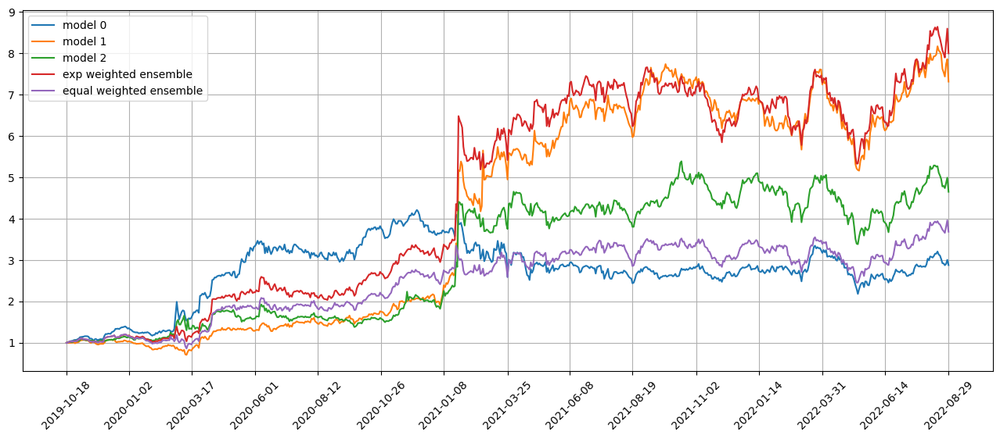

Standardization data are from 2021-11-09 to 2022-04-01
Training data are from 2022-04-04 to 2022-08-25
Testing data are from 2022-08-01 to 2022-09-23
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 37 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0267 - val_loss: 0.0294 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0263 - val_loss: 0.0290 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0261 - val_loss: 0.0281 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0260 - val_loss: 0.0283 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0259 - val_loss: 0.0290 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0258 - val_loss: 0.0290 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 7ms/step - loss: 0.0246 - val_loss: 0.0280 - lr: 0.0010
Epoch 33/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0246 - val_loss: 0.0281 - lr: 0.0010
Epoch 34/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0246 - val_loss: 0.0280 - lr: 0.0010
Epoch 35/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0246 - val_loss: 0.0280 - lr: 0.0010
Epoch 36/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0246 - val_loss: 0.0283 - lr: 0.0010
Epoch 36: early stopping
Epoch 1/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0268 - val_loss: 0.0289 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0263 - val_loss: 0.0290 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0262 - val_loss: 0.0284 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 6ms/step - lo

Testing data from 2022-08-04 to 2022-08-31 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2022-09-01 are ['KW', 'BOIL', 'BFH', 'T', 'AAOI', 'INTC', 'VZ', 'FMS', 'HCSG', 'GOOGL']
Total asset on 2022-09-02 will be 2.870217512424236
It should be the same as 2.870217512424288
top_stocks by model 1 to buy on 2022-09-01 are ['CHH', 'CUBI', 'MFA', 'BFH', 'TOON', 'ANF', 'EQX', 'CCK', 'SID', 'HCSG']
Total asset on 2022-09-02 will be 7.297027333906679
It should be the same as 7.297027333906722
top_stocks by model 2 to buy on 2022-09-01 are ['GRBK', 'ECPG', 'UMBF', 'ACMR', 'QURE', 'SID', 'KRYS', 'HCSG', 'AMZN', 'SIGA']
Total asset on 2022-09-02 will be 4.672762437445863
It should be the same as 4.67276243744591
top_stocks by return weighted ensemble to buy on 2022-09-01 are ['QURE', 'HTGC', 'SIGA', 'CHH', 'FMX', 'KW', 'UMBF', 'ANF', 'SID', 'HCSG']
Total asset on 2022-09-02 will be 7.991552594477871
It should be the same as 7.991552594477934
top_stocks by equal weighted ensembl

Testing data from 2022-08-15 to 2022-09-12 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2022-09-13 are ['SHOP', 'GPI', 'GSK', 'JJSF', 'FRPT', 'VTNR', 'FN', 'NEOG', 'SIGA', 'EDU']
Total asset on 2022-09-14 will be 2.9371350383767036
It should be the same as 2.937135038376755
top_stocks by model 1 to buy on 2022-09-13 are ['BCPC', 'SHOP', 'WBD', 'JJSF', 'DORM', 'GSK', 'GOOGL', 'VTNR', 'GOOG', 'AMZN']
Total asset on 2022-09-14 will be 7.520203964161994
It should be the same as 7.520203964162034
top_stocks by model 2 to buy on 2022-09-13 are ['WOLF', 'GOOG', 'RYTM', 'JJSF', 'FRPT', 'FN', 'GOOGL', 'VTNR', 'NEOG', 'SIGA']
Total asset on 2022-09-14 will be 4.519964201739416
It should be the same as 4.519964201739464
top_stocks by return weighted ensemble to buy on 2022-09-13 are ['DORM', 'GOOG', 'FRPT', 'GSK', 'JJSF', 'GOOGL', 'FN', 'NEOG', 'VTNR', 'SIGA']
Total asset on 2022-09-14 will be 7.9638341579997824
It should be the same as 7.963834157999846
top_stocks by equal 

Testing data from 2022-08-24 to 2022-09-21 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2022-09-22 are ['RPD', 'MDB', 'DAY', 'MTCH', 'UPWK', 'OKTA', 'W', 'RDFN', 'GOOGL', 'GOOG']
Total asset on 2022-09-23 will be 2.5236107246083455
It should be the same as 2.5236107246083965
top_stocks by model 1 to buy on 2022-09-22 are ['SIGA', 'CWB', 'GOOGL', 'ANY', 'MDB', 'CODX', 'ESTC', 'RDFN', 'SMAR', 'EDU']
Total asset on 2022-09-23 will be 6.80571655054874
It should be the same as 6.805716550548781
top_stocks by model 2 to buy on 2022-09-22 are ['TNDM', 'KNDI', 'TV', 'ALT', 'OGI', 'BYON', 'RDFN', 'ANY', 'OKTA', 'SIGA']
Total asset on 2022-09-23 will be 4.0433248254758345
It should be the same as 4.0433248254758825
top_stocks by return weighted ensemble to buy on 2022-09-22 are ['UPWK', 'EC', 'OKTA', 'ESTC', 'CODX', 'ANY', 'MDB', 'GOOGL', 'SIGA', 'RDFN']
Total asset on 2022-09-23 will be 7.020046605328554
It should be the same as 7.020046605328617
top_stocks by equal weight

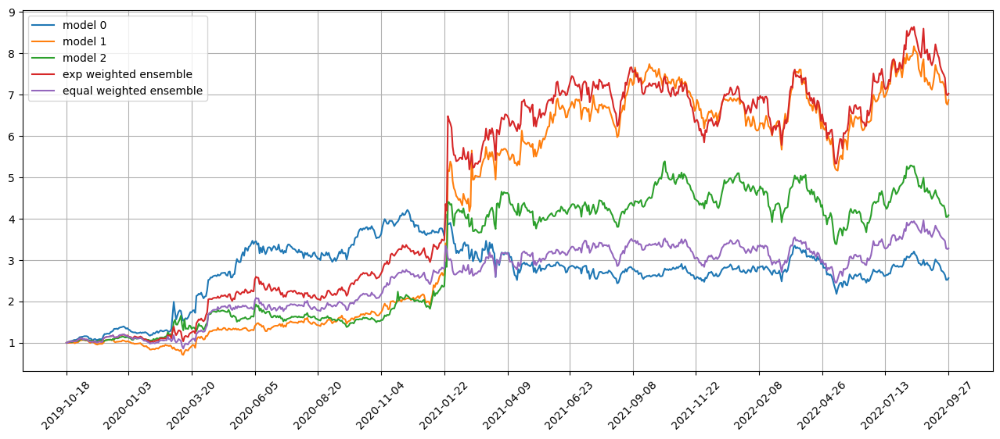

Standardization data are from 2021-12-08 to 2022-05-02
Training data are from 2022-05-03 to 2022-09-23
Testing data are from 2022-08-29 to 2022-10-21
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 38 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0250 - val_loss: 0.0298 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0244 - val_loss: 0.0297 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0241 - val_loss: 0.0298 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0238 - val_loss: 0.0298 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0238 - val_loss: 0.0304 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0237 - val_loss: 0.0299 - lr: 0.0100
Epoch 7/500
146/146 [

Epoch 38: early stopping
Epoch 1/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0249 - val_loss: 0.0298 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0244 - val_loss: 0.0292 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0240 - val_loss: 0.0291 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0239 - val_loss: 0.0293 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0238 - val_loss: 0.0295 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0238 - val_loss: 0.0290 - lr: 0.0100
Epoch 7/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0236 - val_loss: 0.0290 - lr: 0.0100
Epoch 8/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0235 - val_loss: 0.0290 - lr: 0.0100
Epoch 9/500
146/146 [==============================] - 1s 7ms/s

12/12 [==============================] - 0s 4ms/step
Model 1 test loss 0.03988170623779297
46/46 [==============================] - 0s 5ms/step
Model 2 training loss 0.026385527104139328
12/12 [==============================] - 0s 4ms/step
Model 2 test loss 0.04107850790023804
Correlations between old and new weights
0.9959517026718825
0.9967813935513169
0.9748804251337715
0.9958869507956722
0.977981541181906
0.9889213997095757
Weight of model 0 is 0.3150639569631102
Weight of model 1 is 0.36476340115241035
Weight of model 2 is 0.3201726418844794
Testing data from 2022-08-29 to 2022-09-26 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2022-09-27 are ['THG', 'BXP', 'SNN', 'SMAR', 'RCI', 'WKC', 'OKTA', 'YINN', 'SIGA', 'UBS']
Total asset on 2022-09-28 will be 2.5484649974452465
It should be the same as 2.5484649974452984
top_stocks by model 1 to buy on 2022-09-27 are ['CSIQ', 'AAP', 'VFC', 'VMC', 'GSHD', 'ECH', 'DLTR', 'ALT', 'RCUS', 'UBS']
Total asset on 2022-09-28 wi

Total asset on 2022-10-06 will be 4.340747047041779
It should be the same as 4.34074704704183
top_stocks by return weighted ensemble to buy on 2022-10-05 are ['PDCO', 'GRFS', 'VIAV', 'CINF', 'CMPR', 'IBIO', 'EWT', 'BGC', 'WTM', 'IVR']
Total asset on 2022-10-06 will be 7.578354089138073
It should be the same as 7.578354089138137
top_stocks by equal weighted ensemble to buy on 2022-10-05 are ['NMRK', 'VIAV', 'CMPR', 'CINF', 'GRFS', 'IBIO', 'EWT', 'BGC', 'WTM', 'IVR']
Total asset on 2022-10-06 will be 3.5119743562310166
It should be the same as 3.5119743562310526
Testing data from 2022-09-08 to 2022-10-05 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2022-10-06 are ['VANI', 'D', 'WELL', 'EPRT', 'WLY', 'NGG', 'PKG', 'SLGN', 'SIGA', 'LGF.A']
Total asset on 2022-10-07 will be 2.579729363815426
It should be the same as 2.579729363815481
top_stocks by model 1 to buy on 2022-10-06 are ['CIM', 'APAM', 'HBI', 'F', 'MLKN', 'SLGN', 'PRTA', 'EURN', 'FRO', 'ZS']
Total asset on 20

top_stocks by model 2 to buy on 2022-10-14 are ['AKR', 'COTY', 'SNBR', 'DRIP', 'ERY', 'KOD', 'KOLD', 'TFLO', 'PRTA', 'ALT']
Total asset on 2022-10-17 will be 4.152911521338465
It should be the same as 4.1529115213385195
top_stocks by return weighted ensemble to buy on 2022-10-14 are ['SNBR', 'EPR', 'DUST', 'SPG', 'ERY', 'MJ', 'GOOGL', 'TFLO', 'GOOG', 'ALT']
Total asset on 2022-10-17 will be 7.446937933172502
It should be the same as 7.446937933172566
top_stocks by equal weighted ensemble to buy on 2022-10-14 are ['EPR', 'SNBR', 'SPG', 'DUST', 'ERY', 'MJ', 'GOOGL', 'TFLO', 'GOOG', 'ALT']
Total asset on 2022-10-17 will be 3.4472618145730958
It should be the same as 3.447261814573133
Testing data from 2022-09-19 to 2022-10-14 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2022-10-17 are ['WK', 'YY', 'DPZ', 'SYNA', 'HELE', 'TSM', 'ALT', 'DOCU', 'TMF', 'SIGA']
Total asset on 2022-10-18 will be 2.530806946115653
It should be the same as 2.530806946115709
top_stocks by mod

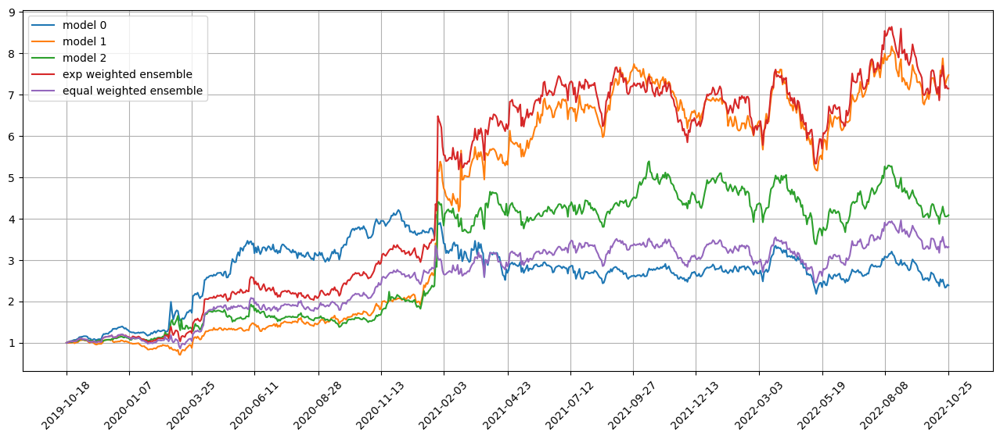

Standardization data are from 2022-01-06 to 2022-05-31
Training data are from 2022-06-01 to 2022-10-21
Testing data are from 2022-09-27 to 2022-11-18
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 39 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0228 - val_loss: 0.0413 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 6ms/step - loss: 0.0224 - val_loss: 0.0413 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0221 - val_loss: 0.0414 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0220 - val_loss: 0.0398 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0219 - val_loss: 0.0417 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 7ms/step - loss: 0.0218 - val_loss: 0.0433 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 4ms/step - loss: 0.0211 - val_loss: 0.0402 - lr: 0.0050
Epoch 12/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0211 - val_loss: 0.0420 - lr: 0.0050
Epoch 13/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0211 - val_loss: 0.0423 - lr: 0.0050
Epoch 14/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0211 - val_loss: 0.0408 - lr: 0.0050
Epoch 15/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0210 - val_loss: 0.0409 - lr: 0.0050
Epoch 16/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0210 - val_loss: 0.0424 - lr: 0.0050
Epoch 17/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0208 - val_loss: 0.0416 - lr: 0.0025
Epoch 18/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0208 - val_loss: 0.0407 - lr: 0.0025
Epoch 19/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0207 - val_loss

top_stocks by model 0 to buy on 2022-10-31 are ['SE', 'TWLO', 'ARCH', 'CMPR', 'EXAS', 'ZS', 'INSG', 'MGNI', 'GOOG', 'AMZN']
Total asset on 2022-11-01 will be 2.4509828504595386
It should be the same as 2.4509828504595923
top_stocks by model 1 to buy on 2022-10-31 are ['MGNI', 'GRWG', 'ZS', 'ZUO', 'MRVL', 'EXAS', 'INSG', 'OMI', 'SOXL', 'CGC']
Total asset on 2022-11-01 will be 8.061229420337275
It should be the same as 8.061229420337321
top_stocks by model 2 to buy on 2022-10-31 are ['PRO', 'MGNI', 'ARKW', 'ZUO', 'CGC', 'INSG', 'BAND', 'ZS', 'TWLO', 'MRVL']
Total asset on 2022-11-01 will be 4.2498837161837
It should be the same as 4.249883716183755
top_stocks by return weighted ensemble to buy on 2022-10-31 are ['TSM', 'EXAS', 'BAND', 'SOXL', 'MRVL', 'ZUO', 'MGNI', 'CGC', 'ZS', 'INSG']
Total asset on 2022-11-01 will be 7.4328244256440055
It should be the same as 7.432824425644075
top_stocks by equal weighted ensemble to buy on 2022-10-31 are ['TWLO', 'EXAS', 'SOXL', 'BAND', 'MRVL', 'ZUO'

Total asset on 2022-11-09 will be 3.227174532316561
It should be the same as 3.2271745323165986
Testing data from 2022-10-12 to 2022-11-08 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2022-11-09 are ['AR', 'TTMI', 'TVTX', 'SEM', 'THC', 'MOG.A', 'AMZN', 'DVN', 'TFIN', 'EQT']
Total asset on 2022-11-10 will be 2.407538429525077
It should be the same as 2.4075384295251294
top_stocks by model 1 to buy on 2022-11-09 are ['CLF', 'FSLR', 'BCPC', 'FCN', 'EQT', 'TSEM', 'GRPN', 'OMCL', 'TUP', 'ROG']
Total asset on 2022-11-10 will be 7.446723891902679
It should be the same as 7.446723891902728
top_stocks by model 2 to buy on 2022-11-09 are ['MCK', 'K', 'G', 'EQT', 'EA', 'RCM', 'COMM', 'ERIC', 'TFIN', 'ROG']
Total asset on 2022-11-10 will be 4.092208697990057
It should be the same as 4.092208697990111
top_stocks by return weighted ensemble to buy on 2022-11-09 are ['FIZZ', 'EA', 'COMM', 'RCM', 'BCPC', 'GRPN', 'TUP', 'TFIN', 'EQT', 'ROG']
Total asset on 2022-11-10 will be 6.913

Total asset on 2022-11-18 will be 7.550443613126967
It should be the same as 7.550443613127035
top_stocks by equal weighted ensemble to buy on 2022-11-17 are ['KWEB', 'AZTA', 'WDFC', 'JD', 'FBIN', 'LGND', 'NAIL', 'TSM', 'ACMR', 'UHAL']
Total asset on 2022-11-18 will be 3.5393684836878876
It should be the same as 3.539368483687927
Testing data from 2022-10-21 to 2022-11-17 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2022-11-18 are ['PRG', 'ALLY', 'WMS', 'LUMN', 'GFI', 'GOOGL', 'NHI', 'CDLX', 'EBS', 'AMZN']
Total asset on 2022-11-21 will be 2.6067702807948545
It should be the same as 2.606770280794908
top_stocks by model 1 to buy on 2022-11-18 are ['ALLY', 'MED', 'NUGT', 'JNUG', 'AUPH', 'CIM', 'GBTC', 'SBSW', 'ATUS', 'ROG']
Total asset on 2022-11-21 will be 7.919152083754428
It should be the same as 7.919152083754482
top_stocks by model 2 to buy on 2022-11-18 are ['YANG', 'FNF', 'SBSW', 'NLY', 'FAF', 'SBLK', 'MED', 'AQN', 'META', 'UHAL']
Total asset on 2022-11-21 w

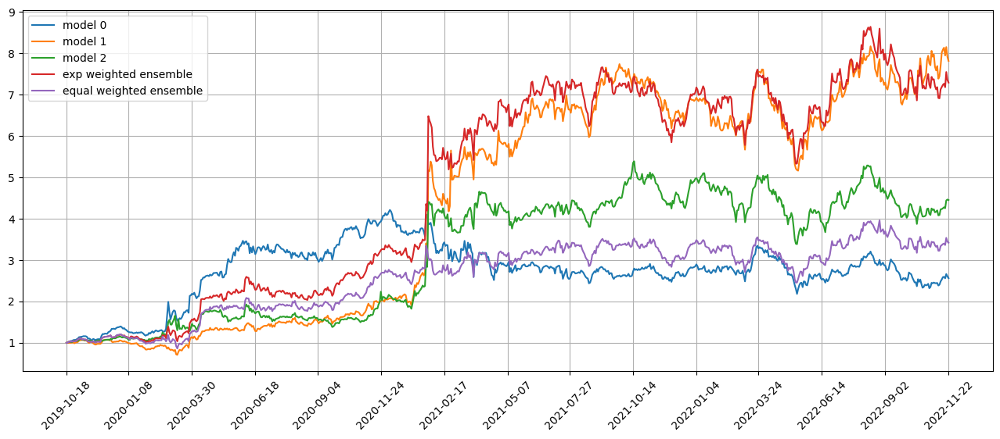

Standardization data are from 2022-02-04 to 2022-06-29
Training data are from 2022-06-30 to 2022-11-18
Testing data are from 2022-10-25 to 2022-12-19
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 40 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0245 - val_loss: 0.0389 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0238 - val_loss: 0.0385 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0235 - val_loss: 0.0403 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0234 - val_loss: 0.0394 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0233 - val_loss: 0.0389 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0232 - val_loss: 0.0394 - lr: 0.0100
Epoch 7/500
146/146 [

Epoch 22: early stopping
46/46 [==============================] - 0s 3ms/step
Model 0 training loss 0.02978074923157692
12/12 [==============================] - 0s 3ms/step
Model 0 test loss 0.03608551621437073
46/46 [==============================] - 0s 3ms/step
Model 1 training loss 0.029743487015366554
12/12 [==============================] - 0s 3ms/step
Model 1 test loss 0.036561351269483566
46/46 [==============================] - 0s 3ms/step
Model 2 training loss 0.029733510687947273
12/12 [==============================] - 0s 3ms/step
Model 2 test loss 0.03641856834292412
Correlations between old and new weights
0.9982923643757797
0.9934894317904925
0.9924789812034469
0.9847742199652176
0.9965073373679968
0.9866755565069913
Weight of model 0 is 0.29792083334490005
Weight of model 1 is 0.3826402924480351
Weight of model 2 is 0.31943887420706474
Testing data from 2022-10-25 to 2022-11-21 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2022-11-22 are ['WST', 'ANG

top_stocks by model 1 to buy on 2022-12-01 are ['CHRW', 'BC', 'HLF', 'GOOG', 'LGF.A', 'RAMP', 'EHTH', 'MANU', 'LABD', 'UHAL']
Total asset on 2022-12-02 will be 8.350668290985222
It should be the same as 8.350668290985276
top_stocks by model 2 to buy on 2022-12-01 are ['HOUS', 'CDLX', 'VRNS', 'MGNI', 'TRUP', 'LABD', 'RAMP', 'GOOGL', 'GOOG', 'UHAL']
Total asset on 2022-12-02 will be 4.378864169916674
It should be the same as 4.3788641699167234
top_stocks by return weighted ensemble to buy on 2022-12-01 are ['CDLX', 'BC', 'BTG', 'GOOG', 'TRUP', 'EHTH', 'MGNI', 'HOUS', 'LABD', 'UHAL']
Total asset on 2022-12-02 will be 7.81221410105328
It should be the same as 7.81221410105335
top_stocks by equal weighted ensemble to buy on 2022-12-01 are ['CDLX', 'BC', 'BTG', 'GOOG', 'TRUP', 'EHTH', 'MGNI', 'HOUS', 'LABD', 'UHAL']
Total asset on 2022-12-02 will be 3.687574109471506
It should be the same as 3.687574109471548
Testing data from 2022-11-03 to 2022-12-01 have shape (2295, 20, 30), (2295,)
top_s

top_stocks by model 1 to buy on 2022-12-12 are ['TV', 'EHTH', 'QRTEA', 'BCC', 'HBI', 'EB', 'VUZI', 'MANU', 'GOOGL', 'GOOG']
Total asset on 2022-12-13 will be 8.430260343746804
It should be the same as 8.430260343746857
top_stocks by model 2 to buy on 2022-12-12 are ['WTI', 'GOOG', 'QRTEA', 'STNE', 'BNO', 'USO', 'MANU', 'DBO', 'KEX', 'UHAL']
Total asset on 2022-12-13 will be 4.496243685284772
It should be the same as 4.496243685284823
top_stocks by return weighted ensemble to buy on 2022-12-12 are ['DKS', 'PLAY', 'GOOGL', 'SBRA', 'MANU', 'LNG', 'KEX', 'GOOG', 'EB', 'IIPR']
Total asset on 2022-12-13 will be 7.896712749628124
It should be the same as 7.896712749628197
top_stocks by equal weighted ensemble to buy on 2022-12-12 are ['OGI', 'QRTEA', 'MANU', 'DKS', 'PLAY', 'SBRA', 'LNG', 'KEX', 'EB', 'IIPR']
Total asset on 2022-12-13 will be 3.7460399678153147
It should be the same as 3.746039967815356
Testing data from 2022-11-14 to 2022-12-12 have shape (2295, 20, 30), (2295,)
top_stocks by

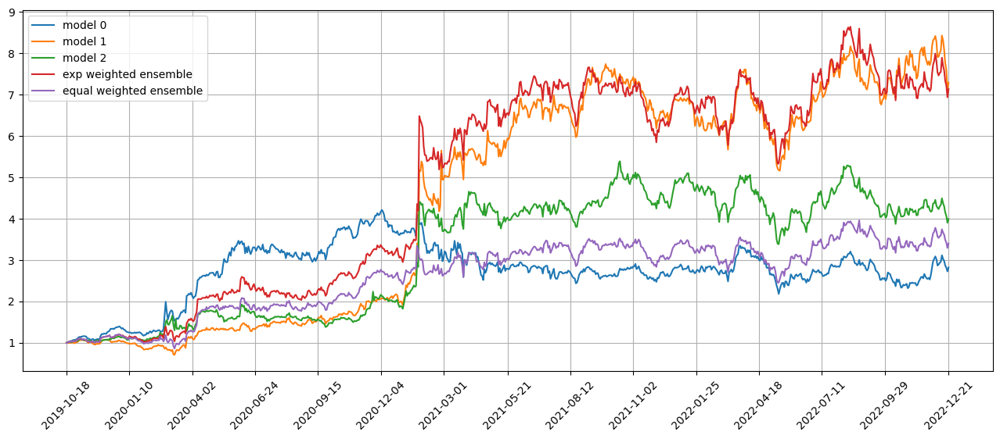

Standardization data are from 2022-03-07 to 2022-07-28
Training data are from 2022-07-29 to 2022-12-19
Testing data are from 2022-11-22 to 2023-01-19
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 41 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0269 - val_loss: 0.0331 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0263 - val_loss: 0.0333 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0260 - val_loss: 0.0342 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0258 - val_loss: 0.0339 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0256 - val_loss: 0.0342 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0255 - val_loss: 0.0340 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 4ms/step - loss: 0.0242 - val_loss: 0.0341 - lr: 0.0010
Epoch 26/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0242 - val_loss: 0.0348 - lr: 0.0010
Epoch 26: early stopping
46/46 [==============================] - 0s 3ms/step
Model 0 training loss 0.02993018366396427
12/12 [==============================] - 0s 3ms/step
Model 0 test loss 0.028048276901245117
46/46 [==============================] - 0s 4ms/step
Model 1 training loss 0.03006099723279476
12/12 [==============================] - 0s 3ms/step
Model 1 test loss 0.028317546471953392
46/46 [==============================] - 0s 3ms/step
Model 2 training loss 0.0288013257086277
12/12 [==============================] - 0s 2ms/step
Model 2 test loss 0.028753602877259254
Correlations between old and new weights
0.9992333237481952
0.9951902698341587
0.99835344836183
0.9876405426901111
0.9900469929275935
0.9886310250757971
Weight of model 0 is 0.3456444769693006
Weigh

Testing data from 2022-12-01 to 2022-12-29 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2022-12-30 are ['SMFG', 'TBF', 'MUFG', 'ERJ', 'YANG', 'VIXY', 'TBT', 'UVXY', 'TMV', 'MANU']
Total asset on 2023-01-03 will be 2.764362338042638
It should be the same as 2.7643623380426985
top_stocks by model 1 to buy on 2022-12-30 are ['VGLT', 'VIXY', 'WOR', 'UVXY', 'TMV', 'KOLD', 'ZROZ', 'PLCE', 'MOG.A', 'MANU']
Total asset on 2023-01-03 will be 7.514954440708055
It should be the same as 7.514954440708111
top_stocks by model 2 to buy on 2022-12-30 are ['SIGI', 'MRIN', 'TZA', 'DUST', 'VIXY', 'SRTY', 'UVXY', 'KOLD', 'AVXL', 'YANG']
Total asset on 2023-01-03 will be 4.000055480995918
It should be the same as 4.000055480995972
top_stocks by return weighted ensemble to buy on 2022-12-30 are ['SPXU', 'AVXL', 'TBT', 'TMV', 'MOG.A', 'YANG', 'KOLD', 'VIXY', 'UVXY', 'MANU']
Total asset on 2023-01-03 will be 6.998446007820085
It should be the same as 6.9984460078201565
top_stocks by equa

Testing data from 2022-12-12 to 2023-01-10 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2023-01-11 are ['MO', 'FTSM', 'TMV', 'DOMO', 'ACB', 'YEXT', 'YANG', 'DUST', 'PTLC', 'INSG']
Total asset on 2023-01-12 will be 3.16005570369897
It should be the same as 3.1600557036990287
top_stocks by model 1 to buy on 2023-01-11 are ['WDAY', 'MET', 'EXPRQ', 'HD', 'INSG', 'LMT', 'PKW', 'PII', 'TGTX', 'ARWR']
Total asset on 2023-01-12 will be 8.28506543151304
It should be the same as 8.2850654315131
top_stocks by model 2 to buy on 2023-01-11 are ['NRG', 'WWW', 'KOS', 'SPDN', 'YEXT', 'LAUR', 'PTLC', 'TTWO', 'ARWR', 'MPLX']
Total asset on 2023-01-12 will be 4.085558284320344
It should be the same as 4.0855582843204
top_stocks by return weighted ensemble to buy on 2023-01-11 are ['GSG', 'BNO', 'UCO', 'YANG', 'MO', 'CENN', 'DUST', 'ARWR', 'YEXT', 'INSG']
Total asset on 2023-01-12 will be 7.478836604749523
It should be the same as 7.478836604749595
top_stocks by equal weighted ensemb

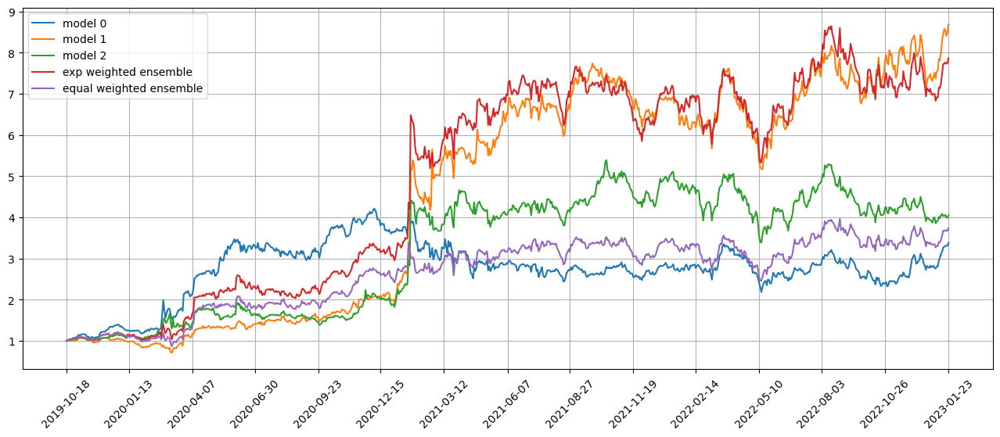

Standardization data are from 2022-04-04 to 2022-08-25
Training data are from 2022-08-26 to 2023-01-19
Testing data are from 2022-12-21 to 2023-02-16
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 42 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0266 - val_loss: 0.0247 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0258 - val_loss: 0.0248 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0255 - val_loss: 0.0247 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0252 - val_loss: 0.0251 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0251 - val_loss: 0.0248 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0250 - val_loss: 0.0247 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 4ms/step - loss: 0.0237 - val_loss: 0.0243 - lr: 0.0050
Epoch 25/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0235 - val_loss: 0.0244 - lr: 0.0025
Epoch 26/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0235 - val_loss: 0.0243 - lr: 0.0025
Epoch 27/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0235 - val_loss: 0.0244 - lr: 0.0025
Epoch 28/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0235 - val_loss: 0.0247 - lr: 0.0025
Epoch 29/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0234 - val_loss: 0.0246 - lr: 0.0025
Epoch 30/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0233 - val_loss: 0.0245 - lr: 0.0012
Epoch 31/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0233 - val_loss: 0.0243 - lr: 0.0012
Epoch 32/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0233 - val_loss

top_stocks by model 1 to buy on 2023-01-24 are ['SRNE', 'APT', 'VNO', 'JMST', 'SCO', 'VANI', 'CAL', 'FLWS', 'IBIO', 'VNLA']
Total asset on 2023-01-25 will be 8.760712619783074
It should be the same as 8.760712619783138
top_stocks by model 2 to buy on 2023-01-24 are ['NI', 'VKTX', 'PNW', 'PPL', 'L', 'NVCR', 'AUPH', 'WEN', 'UNG', 'GBIL']
Total asset on 2023-01-25 will be 4.112041595122217
It should be the same as 4.112041595122273
top_stocks by return weighted ensemble to buy on 2023-01-24 are ['NVCR', 'VKTX', 'JMST', 'IBIO', 'RGNX', 'CHRS', 'WEN', 'KRYS', 'PNW', 'MOH']
Total asset on 2023-01-25 will be 8.061197747272525
It should be the same as 8.0611977472726
top_stocks by equal weighted ensemble to buy on 2023-01-24 are ['RGNX', 'IBIO', 'NVCR', 'JMST', 'VKTX', 'KRYS', 'CHRS', 'WEN', 'MOH', 'PNW']
Total asset on 2023-01-25 will be 3.8311748985479914
It should be the same as 3.8311748985480376
Testing data from 2022-12-23 to 2023-01-24 have shape (2295, 20, 30), (2295,)
top_stocks by mo

Total asset on 2023-02-03 will be 9.386809475181972
It should be the same as 9.386809475182044
top_stocks by model 2 to buy on 2023-02-02 are ['RVNC', 'PBR.A', 'ITUB', 'BLDP', 'KNDI', 'RJF', 'TECH', 'WMT', 'ATOS', 'NLY']
Total asset on 2023-02-03 will be 4.330526622106397
It should be the same as 4.330526622106452
top_stocks by return weighted ensemble to buy on 2023-02-02 are ['WTI', 'KNDI', 'RVNC', 'PLXS', 'XELA', 'PBR.A', 'ATOS', 'WMT', 'RJF', 'NLY']
Total asset on 2023-02-03 will be 8.587530494053041
It should be the same as 8.58753049405312
top_stocks by equal weighted ensemble to buy on 2023-02-02 are ['MDRX', 'KNDI', 'PLXS', 'RVNC', 'XELA', 'PBR.A', 'WMT', 'ATOS', 'RJF', 'NLY']
Total asset on 2023-02-03 will be 4.17717906775233
It should be the same as 4.177179067752377
Testing data from 2023-01-05 to 2023-02-02 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2023-02-03 are ['RMD', 'WPM', 'PBR', 'LLY', 'XOM', 'WU', 'PPL', 'MCD', 'VICI', 'LMT']
Total asset on 2

top_stocks by model 1 to buy on 2023-02-13 are ['UAL', 'IGLB', 'EZA', 'IGOV', 'IUSB', 'BZUN', 'EWD', 'LQD', 'COLD', 'EMB']
Total asset on 2023-02-14 will be 9.227266384456403
It should be the same as 9.22726638445648
top_stocks by model 2 to buy on 2023-02-13 are ['IIPR', 'HYLS', 'WPM', 'URBN', 'BZUN', 'LQD', 'IUSB', 'RWT', 'MRVL', 'EMB']
Total asset on 2023-02-14 will be 4.061911233528889
It should be the same as 4.061911233528948
top_stocks by return weighted ensemble to buy on 2023-02-13 are ['PCY', 'EWD', 'RWT', 'HYG', 'IGIB', 'IGLB', 'VWOB', 'IUSB', 'LQD', 'EMB']
Total asset on 2023-02-14 will be 8.374365864867896
It should be the same as 8.374365864867977
top_stocks by equal weighted ensemble to buy on 2023-02-13 are ['BZUN', 'EWD', 'HYG', 'IGIB', 'IGLB', 'RWT', 'VWOB', 'IUSB', 'LQD', 'EMB']
Total asset on 2023-02-14 will be 4.066619602033376
It should be the same as 4.066619602033427
Testing data from 2023-01-17 to 2023-02-13 have shape (2295, 20, 30), (2295,)
top_stocks by mode

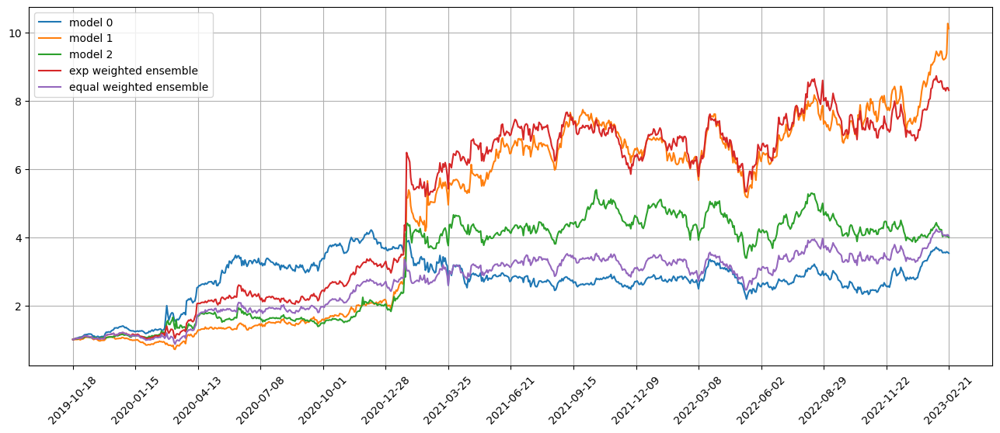

Standardization data are from 2022-05-03 to 2022-09-23
Training data are from 2022-09-26 to 2023-02-16
Testing data are from 2023-01-23 to 2023-03-17
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 43 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0239 - val_loss: 0.0230 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0235 - val_loss: 0.0230 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0234 - val_loss: 0.0230 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0232 - val_loss: 0.0231 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0231 - val_loss: 0.0230 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0231 - val_loss: 0.0230 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 4ms/step - loss: 0.0219 - val_loss: 0.0226 - lr: 0.0010
Epoch 40/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0219 - val_loss: 0.0226 - lr: 0.0010
Epoch 41/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0219 - val_loss: 0.0226 - lr: 0.0010
Epoch 42/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0218 - val_loss: 0.0226 - lr: 0.0010
Epoch 43/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0219 - val_loss: 0.0225 - lr: 0.0010
Epoch 44/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0219 - val_loss: 0.0226 - lr: 0.0010
Epoch 45/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0219 - val_loss: 0.0226 - lr: 0.0010
Epoch 46/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0219 - val_loss: 0.0227 - lr: 0.0010
Epoch 47/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0218 - val_loss

top_stocks by model 2 to buy on 2023-02-23 are ['NMIH', 'WMS', 'QD', 'VNLA', 'MUR', 'CAL', 'FXN', 'CTLT', 'TAP', 'PTLC']
Total asset on 2023-02-24 will be 4.094280130188818
It should be the same as 4.0942801301888725
top_stocks by return weighted ensemble to buy on 2023-02-23 are ['DRIP', 'PKX', 'DBA', 'J', 'WMS', 'FXN', 'TAP', 'RIO', 'QD', 'PTLC']
Total asset on 2023-02-24 will be 8.257849111084779
It should be the same as 8.257849111084864
top_stocks by equal weighted ensemble to buy on 2023-02-23 are ['DRIP', 'PKX', 'DBA', 'J', 'WMS', 'FXN', 'RIO', 'QD', 'TAP', 'PTLC']
Total asset on 2023-02-24 will be 4.02699446220279
It should be the same as 4.026994462202838
Testing data from 2023-01-26 to 2023-02-23 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2023-02-24 are ['UNG', 'WST', 'FRHC', 'TTWO', 'SRNE', 'ZTS', 'UFPI', 'EA', 'TOON', 'PTLC']
Total asset on 2023-02-27 will be 3.7031148321630534
It should be the same as 3.7031148321631138
top_stocks by model 1 to buy 

Total asset on 2023-03-07 will be 4.033887784093723
It should be the same as 4.0338877840937775
top_stocks by return weighted ensemble to buy on 2023-03-06 are ['RWM', 'FAZ', 'YANG', 'SPXU', 'SDS', 'MU', 'PRLB', 'LGF.A', 'ANY', 'BG']
Total asset on 2023-03-07 will be 8.540615179452647
It should be the same as 8.540615179452736
top_stocks by equal weighted ensemble to buy on 2023-03-06 are ['FAZ', 'RWM', 'SPXU', 'SDS', 'PRLB', 'YANG', 'MU', 'LGF.A', 'ANY', 'BG']
Total asset on 2023-03-07 will be 4.0515652737294685
It should be the same as 4.051565273729516
Testing data from 2023-02-06 to 2023-03-06 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2023-03-07 are ['EHC', 'GFI', 'J', 'FNKO', 'BABA', 'TTWO', 'PPC', 'SRNE', 'OMI', 'PTLC']
Total asset on 2023-03-08 will be 3.752861154070478
It should be the same as 3.7528611540705383
top_stocks by model 1 to buy on 2023-03-07 are ['GFI', 'TFX', 'ECPG', 'TTWO', 'LULU', 'WU', 'VNET', 'BTU', 'ENTA', 'SRNE']
Total asset on 2023-

Testing data from 2023-02-15 to 2023-03-15 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2023-03-16 are ['GNRC', 'MXL', 'VICR', 'VUZI', 'GOGO', 'VSTO', 'MARA', 'WKHS', 'BYON', 'IBIO']
Total asset on 2023-03-17 will be 4.0782940407025725
It should be the same as 4.078294040702631
top_stocks by model 1 to buy on 2023-03-16 are ['MXL', 'MPWR', 'TTD', 'ZBRA', 'VYX', 'SYNA', 'AAOI', 'NLY', 'IBIO', 'TDC']
Total asset on 2023-03-17 will be 9.144580003013193
It should be the same as 9.144580003013271
top_stocks by model 2 to buy on 2023-03-16 are ['OC', 'MU', 'MRIN', 'MRVL', 'MPWR', 'ON', 'EVH', 'TDC', 'SYNA', 'IBIO']
Total asset on 2023-03-17 will be 4.101142977426784
It should be the same as 4.101142977426836
top_stocks by return weighted ensemble to buy on 2023-03-16 are ['EXPE', 'SFIX', 'VYX', 'MPWR', 'BYON', 'SYNA', 'NLY', 'MXL', 'TDC', 'IBIO']
Total asset on 2023-03-17 will be 8.336972164828213
It should be the same as 8.336972164828303
top_stocks by equal weighted e

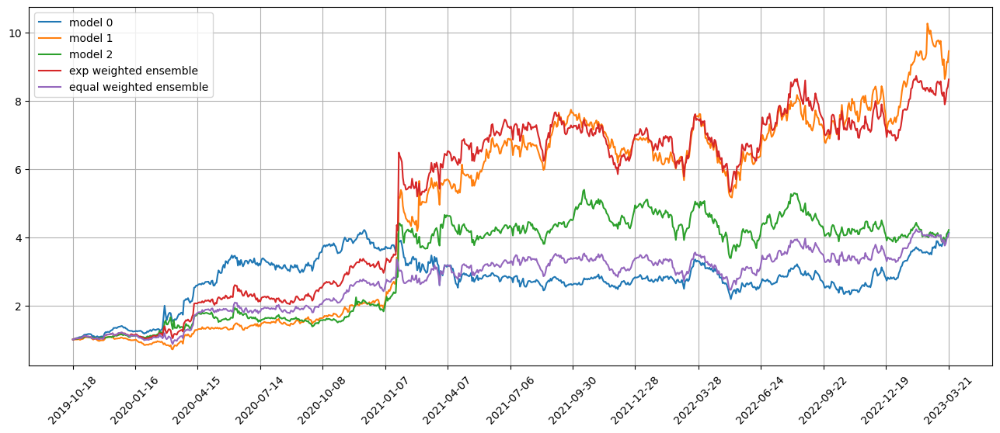

Standardization data are from 2022-06-01 to 2022-10-21
Training data are from 2022-10-24 to 2023-03-17
Testing data are from 2023-02-21 to 2023-04-17
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 44 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0210 - val_loss: 0.0337 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0207 - val_loss: 0.0326 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0205 - val_loss: 0.0350 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0204 - val_loss: 0.0339 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0204 - val_loss: 0.0327 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0203 - val_loss: 0.0343 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 4ms/step - loss: 0.0204 - val_loss: 0.0330 - lr: 0.0100
Epoch 8/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0203 - val_loss: 0.0327 - lr: 0.0100
Epoch 9/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0203 - val_loss: 0.0327 - lr: 0.0100
Epoch 10/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0202 - val_loss: 0.0338 - lr: 0.0100
Epoch 11/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0199 - val_loss: 0.0331 - lr: 0.0050
Epoch 12/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0199 - val_loss: 0.0328 - lr: 0.0050
Epoch 13/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0199 - val_loss: 0.0328 - lr: 0.0050
Epoch 14/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0199 - val_loss: 0.0330 - lr: 0.0050
Epoch 15/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0198 - val_loss: 

top_stocks by model 0 to buy on 2023-03-24 are ['SYNA', 'TREX', 'MATX', 'TSLA', 'CRM', 'WGO', 'UPBD', 'WW', 'SATS', 'FNKO']
Total asset on 2023-03-27 will be 3.961747341575177
It should be the same as 3.961747341575238
top_stocks by model 1 to buy on 2023-03-24 are ['BG', 'ELAN', 'SKYY', 'YELP', 'CAKE', 'TV', 'COO', 'ALLK', 'CRM', 'MTCH']
Total asset on 2023-03-27 will be 9.465548802916944
It should be the same as 9.465548802917027
top_stocks by model 2 to buy on 2023-03-24 are ['MU', 'EB', 'UPBD', 'PATK', 'SYNA', 'MXL', 'DKS', 'ST', 'MTCH', 'ALLK']
Total asset on 2023-03-27 will be 4.190591563460225
It should be the same as 4.190591563460277
top_stocks by return weighted ensemble to buy on 2023-03-24 are ['COO', 'MATX', 'CRM', 'FNKO', 'MXL', 'WGO', 'BOOT', 'SYNA', 'MTCH', 'UPBD']
Total asset on 2023-03-27 will be 8.580532622614633
It should be the same as 8.580532622614728
top_stocks by equal weighted ensemble to buy on 2023-03-24 are ['MCRB', 'YELP', 'ST', 'WGO', 'MXL', 'BOOT', 'ALLK

Total asset on 2023-04-04 will be 4.222173088336297
It should be the same as 4.222173088336344
Testing data from 2023-03-07 to 2023-04-03 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2023-04-04 are ['ATUS', 'BYON', 'FNKO', 'QTWO', 'CDLX', 'CABO', 'TREE', 'TWLO', 'BGFV', 'EVA']
Total asset on 2023-04-05 will be 4.120745333626313
It should be the same as 4.120745333626375
top_stocks by model 1 to buy on 2023-04-04 are ['CABO', 'SQM', 'MTCH', 'BZUN', 'LAAC', 'MRVL', 'BLDP', 'PLUG', 'QCOM', 'ALTM']
Total asset on 2023-04-05 will be 9.342179201246465
It should be the same as 9.342179201246553
top_stocks by model 2 to buy on 2023-04-04 are ['WOLF', 'TDOC', 'LAAC', 'RPD', 'EXPI', 'GLOB', 'ALTM', 'MRVL', 'ZS', 'MVIS']
Total asset on 2023-04-05 will be 4.3176908692661184
It should be the same as 4.317690869266168
top_stocks by return weighted ensemble to buy on 2023-04-04 are ['INSG', 'QCOM', 'GPRO', 'LAAC', 'PLUG', 'ZS', 'BYON', 'MRVL', 'CABO', 'ALTM']
Total asset on 2023

Testing data from 2023-03-16 to 2023-04-13 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2023-04-14 are ['PBR', 'CRK', 'VFC', 'PBR.A', 'OLLI', 'DBI', 'WBD', 'DK', 'AMED', 'BRFS']
Total asset on 2023-04-17 will be 4.421075719168371
It should be the same as 4.4210757191684396
top_stocks by model 1 to buy on 2023-04-14 are ['PBR', 'CVNA', 'AMR', 'ITCI', 'KBH', 'GME', 'WW', 'KW', 'BRFS', 'OLLI']
Total asset on 2023-04-17 will be 9.699434216310218
It should be the same as 9.699434216310307
top_stocks by model 2 to buy on 2023-04-14 are ['WBD', 'PEB', 'ASTH', 'HBI', 'VKTX', 'CRI', 'BRFS', 'KW', 'DBI', 'BKD']
Total asset on 2023-04-17 will be 4.355653849464965
It should be the same as 4.355653849465019
top_stocks by return weighted ensemble to buy on 2023-04-14 are ['KBH', 'KW', 'DBI', 'WBD', 'PBR.A', 'PBR', 'HBI', 'BKD', 'OLLI', 'BRFS']
Total asset on 2023-04-17 will be 8.77088562647727
It should be the same as 8.770885626477373
top_stocks by equal weighted ensemble to b

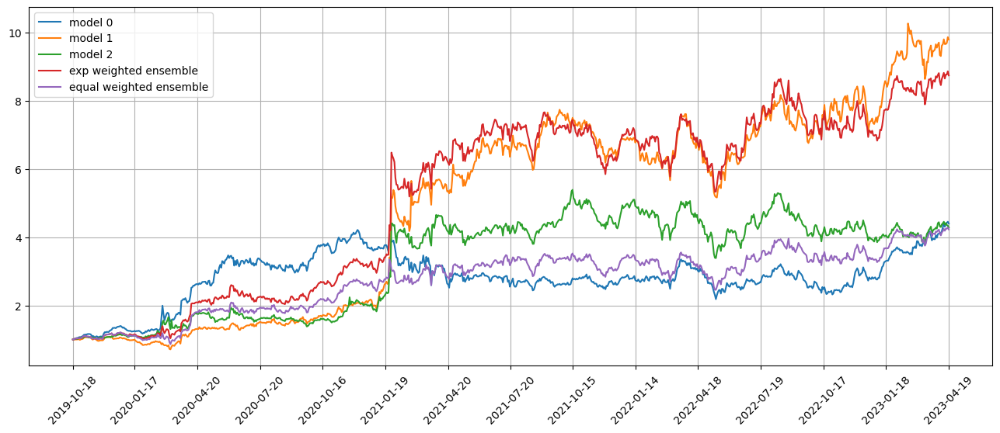

Standardization data are from 2022-06-30 to 2022-11-18
Training data are from 2022-11-21 to 2023-04-17
Testing data are from 2023-03-21 to 2023-05-15
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 45 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0228 - val_loss: 0.0214 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0223 - val_loss: 0.0215 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0220 - val_loss: 0.0211 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0218 - val_loss: 0.0216 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0217 - val_loss: 0.0212 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0216 - val_loss: 0.0211 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 4ms/step - loss: 0.0213 - val_loss: 0.0216 - lr: 0.0100
Epoch 9/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0209 - val_loss: 0.0212 - lr: 0.0050
Epoch 10/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0208 - val_loss: 0.0209 - lr: 0.0050
Epoch 11/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0208 - val_loss: 0.0212 - lr: 0.0050
Epoch 12/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0208 - val_loss: 0.0212 - lr: 0.0050
Epoch 13/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0208 - val_loss: 0.0215 - lr: 0.0050
Epoch 14/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0206 - val_loss: 0.0211 - lr: 0.0025
Epoch 15/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0206 - val_loss: 0.0212 - lr: 0.0025
Epoch 16/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0206 - val_loss:

Total asset on 2023-04-21 will be 8.485133000226966
It should be the same as 8.48513300022707
top_stocks by equal weighted ensemble to buy on 2023-04-20 are ['VTLE', 'PZZA', 'SU', 'LIT', 'NTR', 'MOS', 'VOD', 'LMBS', 'EBS', 'VKTX']
Total asset on 2023-04-21 will be 4.137151952922348
It should be the same as 4.1371519529223955
Testing data from 2023-03-23 to 2023-04-20 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2023-04-21 are ['FXI', 'SNAP', 'MARA', 'PAR', 'GBTC', 'BABA', 'BZUN', 'RIOT', 'SBLK', 'JD']
Total asset on 2023-04-24 will be 4.136810888695267
It should be the same as 4.136810888695335
top_stocks by model 1 to buy on 2023-04-21 are ['ACHC', 'PZZA', 'GOGL', 'WW', 'GSG', 'EB', 'JD', 'HRTX', 'SBLK', 'VKTX']
Total asset on 2023-04-24 will be 9.731353143490628
It should be the same as 9.731353143490715
top_stocks by model 2 to buy on 2023-04-21 are ['TTWO', 'BANC', 'ASHR', 'AAOI', 'EQNR', 'SBLK', 'WW', 'JD', 'WAL', 'CDLX']
Total asset on 2023-04-24 will be 4.2

Total asset on 2023-05-02 will be 8.311589107525402
It should be the same as 8.3115891075255
top_stocks by equal weighted ensemble to buy on 2023-05-01 are ['UMBF', 'MGY', 'UUP', 'TDOC', 'GOGL', 'CIEN', 'SATS', 'VRNS', 'ZYME', 'BTI']
Total asset on 2023-05-02 will be 3.964444672484694
It should be the same as 3.9644446724847406
Testing data from 2023-04-03 to 2023-05-01 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2023-05-02 are ['VFC', 'TECH', 'BGNE', 'GOOG', 'GEVO', 'GXC', 'GGB', 'AMD', 'BB', 'BVN']
Total asset on 2023-05-03 will be 3.8914498182214627
It should be the same as 3.89144981822153
top_stocks by model 1 to buy on 2023-05-02 are ['SIG', 'CENX', 'GGB', 'BB', 'RDFN', 'VNLA', 'BIG', 'BYON', 'CUBI', 'BVN']
Total asset on 2023-05-03 will be 9.59440782761056
It should be the same as 9.59440782761065
top_stocks by model 2 to buy on 2023-05-02 are ['PRPL', 'BB', 'EWT', 'ACMR', 'ALGN', 'CHGG', 'FLWS', 'GGB', 'CLF', 'BVN']
Total asset on 2023-05-03 will be 3.999

Total asset on 2023-05-11 will be 3.379507499493737
It should be the same as 3.3795074994937857
Testing data from 2023-04-13 to 2023-05-10 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2023-05-11 are ['SPDN', 'TWM', 'SDS', 'SPXS', 'TZA', 'SOXS', 'SRTY', 'FHN', 'EVA', 'RRR']
Total asset on 2023-05-12 will be 3.2911491843894933
It should be the same as 3.2911491843895604
top_stocks by model 1 to buy on 2023-05-11 are ['SDS', 'SABR', 'SPXU', 'FHN', 'INDB', 'SH', 'SRTY', 'TWM', 'RWM', 'SPDN']
Total asset on 2023-05-12 will be 9.259444409803512
It should be the same as 9.259444409803601
top_stocks by model 2 to buy on 2023-05-11 are ['SPXU', 'SDS', 'TWM', 'VAC', 'TZA', 'FUN', 'SRTY', 'MPC', 'PSQ', 'SPDN']
Total asset on 2023-05-12 will be 3.6330690773259295
It should be the same as 3.6330690773259837
top_stocks by return weighted ensemble to buy on 2023-05-11 are ['DOG', 'SH', 'RWM', 'SPXU', 'SPXS', 'SDS', 'TZA', 'TWM', 'SRTY', 'SPDN']
Total asset on 2023-05-12 will be 

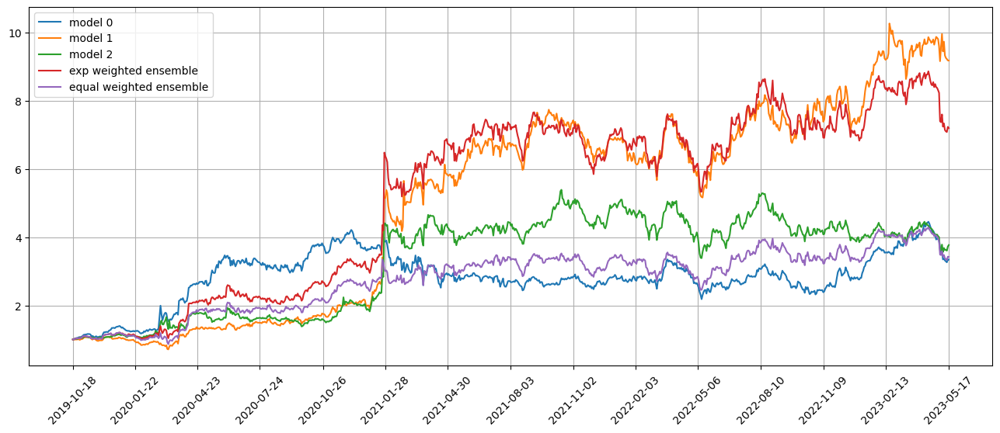

Standardization data are from 2022-07-29 to 2022-12-19
Training data are from 2022-12-20 to 2023-05-15
Testing data are from 2023-04-19 to 2023-06-13
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 46 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0210 - val_loss: 0.0230 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0207 - val_loss: 0.0231 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0206 - val_loss: 0.0232 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0204 - val_loss: 0.0232 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0204 - val_loss: 0.0233 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0203 - val_loss: 0.0232 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 4ms/step - loss: 0.0195 - val_loss: 0.0230 - lr: 0.0010
Epoch 32/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0195 - val_loss: 0.0230 - lr: 0.0010
Epoch 33/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0195 - val_loss: 0.0229 - lr: 0.0010
Epoch 34/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0195 - val_loss: 0.0231 - lr: 0.0010
Epoch 35/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0195 - val_loss: 0.0230 - lr: 0.0010
Epoch 36/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0195 - val_loss: 0.0230 - lr: 0.0010
Epoch 37/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0195 - val_loss: 0.0230 - lr: 0.0010
Epoch 38/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0195 - val_loss: 0.0229 - lr: 0.0010
Epoch 39/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0194 - val_loss

146/146 [==============================] - 1s 4ms/step - loss: 0.0195 - val_loss: 0.0229 - lr: 0.0010
Epoch 38: early stopping
46/46 [==============================] - 0s 4ms/step
Model 0 training loss 0.025407666340470314
12/12 [==============================] - 0s 3ms/step
Model 0 test loss 0.03127456456422806
46/46 [==============================] - 0s 4ms/step
Model 1 training loss 0.0254069734364748
12/12 [==============================] - 0s 4ms/step
Model 1 test loss 0.03126733750104904
46/46 [==============================] - 0s 4ms/step
Model 2 training loss 0.025501610711216927
12/12 [==============================] - 0s 4ms/step
Model 2 test loss 0.031330931931734085
Correlations between old and new weights
0.9888898071502401
0.9964656973905027
0.9742038825311947
0.9902911390557941
0.9897691025206017
0.9955726706462262
Weight of model 0 is 0.3983117273509263
Weight of model 1 is 0.3496644032777538
Weight of model 2 is 0.25202386937131993
Testing data from 2023-04-19 to 2023-

top_stocks by model 0 to buy on 2023-05-25 are ['GGB', 'EWZ', 'WAL', 'CEIX', 'KOLD', 'BRZU', 'BYON', 'SKX', 'GBTC', 'BANC']
Total asset on 2023-05-26 will be 3.3075507177488803
It should be the same as 3.3075507177489474
top_stocks by model 1 to buy on 2023-05-25 are ['NEM', 'AGI', 'BABA', 'WPM', 'ASHR', 'TGT', 'KEY', 'GBTC', 'KOLD', 'IDEX']
Total asset on 2023-05-26 will be 9.111999901136084
It should be the same as 9.111999901136173
top_stocks by model 2 to buy on 2023-05-25 are ['HL', 'AGCO', 'MPC', 'ENB', 'PPLT', 'GOLF', 'NEM', 'GBTC', 'PTLC', 'WAL']
Total asset on 2023-05-26 will be 3.580252114369951
It should be the same as 3.5802521143700057
top_stocks by return weighted ensemble to buy on 2023-05-25 are ['WPM', 'GGB', 'KEY', 'AGCO', 'AEM', 'BABA', 'NEM', 'TGT', 'KOLD', 'GBTC']
Total asset on 2023-05-26 will be 6.997574201440404
It should be the same as 6.997574201440503
top_stocks by equal weighted ensemble to buy on 2023-05-25 are ['WPM', 'PTLC', 'KEY', 'AEM', 'AGCO', 'BABA', 

Total asset on 2023-06-07 will be 3.6882010689920546
It should be the same as 3.6882010689921207
top_stocks by model 1 to buy on 2023-06-06 are ['SID', 'AMCX', 'LPG', 'IQ', 'FHN', 'MDU', 'NWN', 'KOLD', 'LABD', 'DG']
Total asset on 2023-06-07 will be 10.063139176385212
It should be the same as 10.063139176385302
top_stocks by model 2 to buy on 2023-06-06 are ['RRC', 'JKS', 'MDU', 'BF.B', 'ROST', 'KOLD', 'VTNR', 'DG', 'IEP', 'FHN']
Total asset on 2023-06-07 will be 3.7531544746315606
It should be the same as 3.753154474631618
top_stocks by return weighted ensemble to buy on 2023-06-06 are ['GIII', 'IQ', 'NWN', 'VTNR', 'KOLD', 'DOX', 'DG', 'MDU', 'LABD', 'FHN']
Total asset on 2023-06-07 will be 7.9490877702148
It should be the same as 7.9490877702148985
top_stocks by equal weighted ensemble to buy on 2023-06-06 are ['ROST', 'IQ', 'NWN', 'VTNR', 'DOX', 'KOLD', 'MDU', 'LABD', 'DG', 'FHN']
Total asset on 2023-06-07 will be 3.6934286589474006
It should be the same as 3.693428658947451
Testing

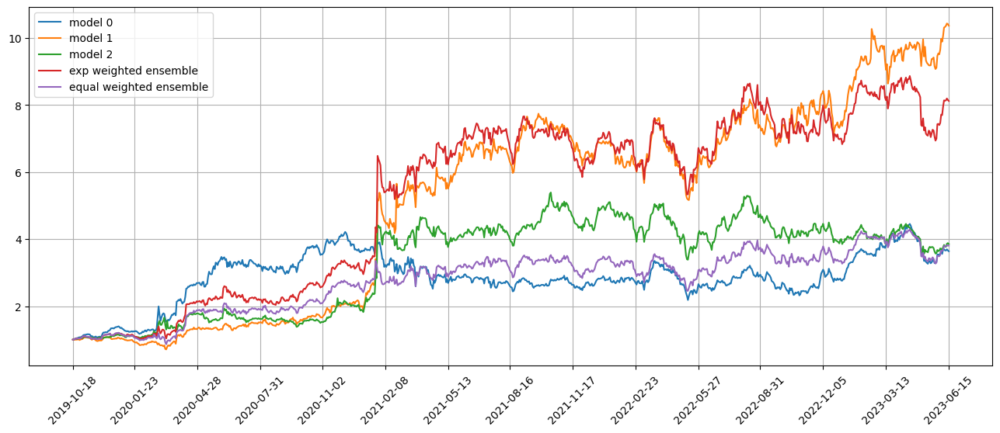

Standardization data are from 2022-08-26 to 2023-01-19
Training data are from 2023-01-20 to 2023-06-13
Testing data are from 2023-05-17 to 2023-07-13
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 47 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0211 - val_loss: 0.0241 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0209 - val_loss: 0.0246 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0208 - val_loss: 0.0248 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0207 - val_loss: 0.0244 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0206 - val_loss: 0.0254 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0206 - val_loss: 0.0245 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 4ms/step - loss: 0.0197 - val_loss: 0.0243 - lr: 0.0010
Epoch 37/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0196 - val_loss: 0.0244 - lr: 0.0010
Epoch 38/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0197 - val_loss: 0.0243 - lr: 0.0010
Epoch 39/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0197 - val_loss: 0.0243 - lr: 0.0010
Epoch 40/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0196 - val_loss: 0.0244 - lr: 0.0010
Epoch 41/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0196 - val_loss: 0.0243 - lr: 0.0010
Epoch 42/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0197 - val_loss: 0.0243 - lr: 0.0010
Epoch 43/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0197 - val_loss: 0.0243 - lr: 0.0010
Epoch 44/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0197 - val_loss

top_stocks by model 0 to buy on 2023-06-20 are ['TNET', 'USO', 'PPLT', 'BNO', 'KBWB', 'TGNA', 'DBO', 'EURN', 'OII', 'UCO']
Total asset on 2023-06-21 will be 3.6304529641088217
It should be the same as 3.6304529641088865
top_stocks by model 1 to buy on 2023-06-20 are ['BFH', 'ABG', 'BKR', 'UCO', 'NYCB', 'OII', 'TNET', 'SLB', 'PSX', 'EURN']
Total asset on 2023-06-21 will be 10.484620713274555
It should be the same as 10.484620713274643
top_stocks by model 2 to buy on 2023-06-20 are ['TECK', 'HUM', 'TDW', 'RBA', 'HL', 'BANC', 'NG', 'BGNE', 'VRN', 'KOLD']
Total asset on 2023-06-21 will be 3.873740124859972
It should be the same as 3.873740124860033
top_stocks by return weighted ensemble to buy on 2023-06-20 are ['USO', 'PSX', 'OLN', 'TTE', 'CIVI', 'TDW', 'OII', 'SLB', 'UCO', 'EURN']
Total asset on 2023-06-21 will be 8.166653348065918
It should be the same as 8.166653348066017
top_stocks by equal weighted ensemble to buy on 2023-06-20 are ['USO', 'HAL', 'OLN', 'CIVI', 'TTE', 'OII', 'SLB', '

top_stocks by model 0 to buy on 2023-06-29 are ['TNK', 'INSW', 'NVDA', 'CHRW', 'EURN', 'BGNE', 'TGNA', 'TRUP', 'KBWB', 'FHN']
Total asset on 2023-06-30 will be 3.554381943055806
It should be the same as 3.5543819430558727
top_stocks by model 1 to buy on 2023-06-29 are ['SSRM', 'BRFS', 'SIX', 'GPN', 'INSW', 'DHR', 'EURN', 'MRCY', 'IEP', 'DPST']
Total asset on 2023-06-30 will be 11.00579667740471
It should be the same as 11.005796677404799
top_stocks by model 2 to buy on 2023-06-29 are ['COTY', 'OXM', 'WKC', 'PRKS', 'CPA', 'JNUG', 'INSW', 'MNST', 'AEM', 'SIX']
Total asset on 2023-06-30 will be 3.985443814647293
It should be the same as 3.985443814647354
top_stocks by return weighted ensemble to buy on 2023-06-29 are ['BGNE', 'AEM', 'JNUG', 'NAT', 'KBWB', 'SSRM', 'SIX', 'EURN', 'INSW', 'DPST']
Total asset on 2023-06-30 will be 8.378838625705843
It should be the same as 8.378838625705942
top_stocks by equal weighted ensemble to buy on 2023-06-29 are ['BGNE', 'TNK', 'NAT', 'AEM', 'SSRM', 'J

Total asset on 2023-07-11 will be 3.959455696027983
It should be the same as 3.9594556960280363
Testing data from 2023-06-09 to 2023-07-10 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2023-07-11 are ['YANG', 'COF', 'MNRO', 'STNE', 'RMBS', 'CWT', 'STRA', 'SCO', 'IDEX', 'IEP']
Total asset on 2023-07-12 will be 3.7719639850261046
It should be the same as 3.771963985026172
top_stocks by model 1 to buy on 2023-07-11 are ['FRO', 'SNDX', 'IDEX', 'ALLY', 'MTH', 'STNE', 'IEP', 'TECK', 'MNRO', 'PTLC']
Total asset on 2023-07-12 will be 11.762457357428707
It should be the same as 11.762457357428797
top_stocks by model 2 to buy on 2023-07-11 are ['FSLR', 'IDEX', 'IBN', 'PTLC', 'CHDN', 'ARWR', 'TPH', 'SCO', 'LLY', 'SUM']
Total asset on 2023-07-12 will be 4.021935852051954
It should be the same as 4.021935852052013
top_stocks by return weighted ensemble to buy on 2023-07-11 are ['FSLR', 'TECK', 'COF', 'CVCO', 'STNE', 'MNRO', 'PTLC', 'SCO', 'IDEX', 'IEP']
Total asset on 2023-07-1

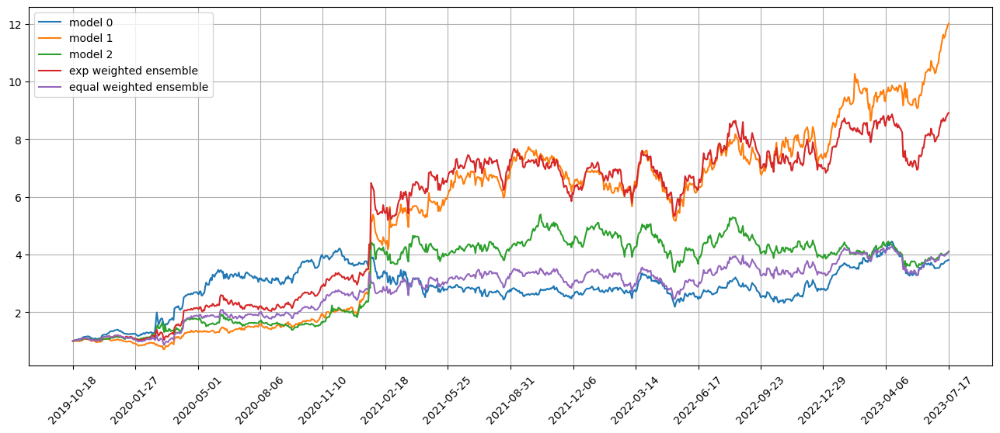

Standardization data are from 2022-09-26 to 2023-02-16
Training data are from 2023-02-17 to 2023-07-13
Testing data are from 2023-06-15 to 2023-08-10
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 48 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0204 - val_loss: 0.0197 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0202 - val_loss: 0.0197 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0200 - val_loss: 0.0197 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0199 - val_loss: 0.0195 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0199 - val_loss: 0.0195 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0198 - val_loss: 0.0196 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 4ms/step - loss: 0.0201 - val_loss: 0.0197 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0200 - val_loss: 0.0196 - lr: 0.0100
Epoch 7/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0196 - val_loss: 0.0194 - lr: 0.0050
Epoch 8/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0196 - val_loss: 0.0194 - lr: 0.0050
Epoch 9/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0195 - val_loss: 0.0195 - lr: 0.0050
Epoch 10/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0195 - val_loss: 0.0195 - lr: 0.0050
Epoch 11/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0195 - val_loss: 0.0195 - lr: 0.0050
Epoch 12/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0193 - val_loss: 0.0194 - lr: 0.0025
Epoch 13/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0193 - val_loss: 0.

Total asset on 2023-07-24 will be 4.147964455438116
It should be the same as 4.147964455438169
Testing data from 2023-06-23 to 2023-07-21 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2023-07-24 are ['TPR', 'NUS', 'PRKS', 'TKO', 'VSAT', 'FUN', 'DDD', 'OMC', 'SIX', 'IPG']
Total asset on 2023-07-25 will be 3.8994945491112625
It should be the same as 3.89949454911133
top_stocks by model 1 to buy on 2023-07-24 are ['OMC', 'SMCI', 'SNY', 'MA', 'HRI', 'MANU', 'TWLO', 'TTD', 'AAOI', 'GIB']
Total asset on 2023-07-25 will be 12.222526709721393
It should be the same as 12.222526709721484
top_stocks by model 2 to buy on 2023-07-24 are ['CYRX', 'LGF.A', 'LABU', 'DNLI', 'VEEV', 'RH', 'XNCR', 'IPG', 'FUN', 'OMC']
Total asset on 2023-07-25 will be 4.249269471428978
It should be the same as 4.249269471429039
top_stocks by return weighted ensemble to buy on 2023-07-24 are ['CYRX', 'TWLO', 'MA', 'KHC', 'LGF.A', 'MANU', 'FUN', 'GIB', 'IPG', 'OMC']
Total asset on 2023-07-25 will be 9.

Total asset on 2023-08-02 will be 4.178083211691592
It should be the same as 4.178083211691646
Testing data from 2023-07-05 to 2023-08-01 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2023-08-02 are ['SNN', 'AA', 'ASX', 'GOGL', 'SBLK', 'CYRX', 'PAAS', 'CWEN', 'PAG', 'SIMO']
Total asset on 2023-08-03 will be 3.673225698442002
It should be the same as 3.6732256984420695
top_stocks by model 1 to buy on 2023-08-02 are ['YUMC', 'GSHD', 'SID', 'GGB', 'BRZU', 'ANY', 'XLG', 'SUNWQ', 'EYE', 'SIMO']
Total asset on 2023-08-03 will be 11.653129402056344
It should be the same as 11.653129402056429
top_stocks by model 2 to buy on 2023-08-02 are ['CGNX', 'IOVA', 'VRSN', 'BAC.PL', 'SAP', 'MMSI', 'BTAI', 'RHI', 'EXPO', 'SEDG']
Total asset on 2023-08-03 will be 4.317600820854206
It should be the same as 4.31760082085427
top_stocks by return weighted ensemble to buy on 2023-08-02 are ['YUMC', 'AA', 'VALE', 'SID', 'GGB', 'SPSC', 'SUNWQ', 'ASX', 'BAC.PL', 'SIMO']
Total asset on 2023-08

Total asset on 2023-08-11 will be 3.958108027778677
It should be the same as 3.9581080277787306
Testing data from 2023-07-14 to 2023-08-10 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2023-08-11 are ['LAAC', 'TAN', 'TSEM', 'TECL', 'PBW', 'CPA', 'PI', 'TPR', 'HE', 'EBIXQ']
Total asset on 2023-08-14 will be 3.5536601832979433
It should be the same as 3.5536601832980135
top_stocks by model 1 to buy on 2023-08-11 are ['EYE', 'TPR', 'INGR', 'XLG', 'VRRM', 'GRBK', 'TDC', 'TUP', 'EBIXQ', 'HE']
Total asset on 2023-08-14 will be 10.968010302985135
It should be the same as 10.968010302985215
top_stocks by model 2 to buy on 2023-08-11 are ['EBIXQ', 'RMD', 'FTNT', 'PAYC', 'EXR', 'HE', 'PANW', 'ADI', 'MCHP', 'SVXY']
Total asset on 2023-08-14 will be 4.386538462825379
It should be the same as 4.386538462825446
top_stocks by return weighted ensemble to buy on 2023-08-11 are ['GRMN', 'FWRD', 'VRRM', 'FORM', 'SVXY', 'TDC', 'TECL', 'TPR', 'EBIXQ', 'HE']
Total asset on 2023-08-14 wi

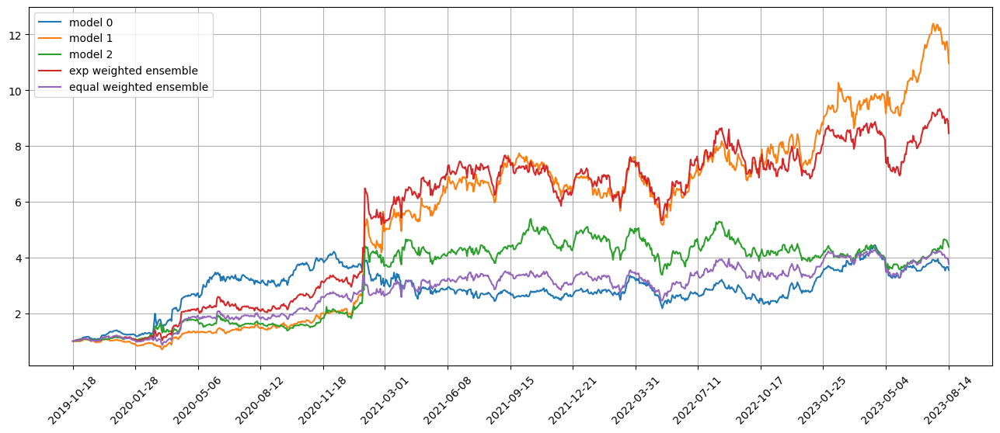

Standardization data are from 2022-10-24 to 2023-03-17
Training data are from 2023-03-20 to 2023-08-10
Testing data are from 2023-07-17 to 2023-09-08
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 49 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0196 - val_loss: 0.0194 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0194 - val_loss: 0.0193 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0192 - val_loss: 0.0193 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0192 - val_loss: 0.0194 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0191 - val_loss: 0.0195 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0190 - val_loss: 0.0194 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 4ms/step - loss: 0.0189 - val_loss: 0.0192 - lr: 0.0050
Epoch 12/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0189 - val_loss: 0.0192 - lr: 0.0050
Epoch 13/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0188 - val_loss: 0.0193 - lr: 0.0050
Epoch 14/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0188 - val_loss: 0.0194 - lr: 0.0050
Epoch 15/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0186 - val_loss: 0.0191 - lr: 0.0025
Epoch 16/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0186 - val_loss: 0.0191 - lr: 0.0025
Epoch 17/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0186 - val_loss: 0.0192 - lr: 0.0025
Epoch 18/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0186 - val_loss: 0.0194 - lr: 0.0025
Epoch 19/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0186 - val_loss

Total asset on 2023-08-17 will be 3.720221523700903
It should be the same as 3.7202215237009577
Testing data from 2023-07-20 to 2023-08-16 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2023-08-17 are ['ENPH', 'TGT', 'HES', 'EQNR', 'DG', 'NTR', 'IEP', 'SIGA', 'RSPT', 'KOD']
Total asset on 2023-08-18 will be 3.2425554969576
It should be the same as 3.2425554969576704
top_stocks by model 1 to buy on 2023-08-17 are ['HES', 'FHB', 'UI', 'NTR', 'TDS', 'SAGE', 'XLG', 'RSPT', 'KOD', 'SIGA']
Total asset on 2023-08-18 will be 10.633929944435984
It should be the same as 10.633929944436064
top_stocks by model 2 to buy on 2023-08-17 are ['TTE', 'SIMO', 'FLR', 'HES', 'FHB', 'SU', 'EQNR', 'TDS', 'IEP', 'AAOI']
Total asset on 2023-08-18 will be 4.281199084219269
It should be the same as 4.2811990842193355
top_stocks by return weighted ensemble to buy on 2023-08-17 are ['BOH', 'FHB', 'CBSH', 'HES', 'NTR', 'IEP', 'TDS', 'SIGA', 'KOD', 'RSPT']
Total asset on 2023-08-18 will be 8.2593

Total asset on 2023-08-28 will be 3.665798244739908
It should be the same as 3.6657982447399644
Testing data from 2023-07-31 to 2023-08-25 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2023-08-28 are ['ZION', 'ENTA', 'SMCI', 'FHB', 'PNC', 'UI', 'CBU', 'KEY', 'NKTR', 'HE']
Total asset on 2023-08-29 will be 3.216652033645344
It should be the same as 3.216652033645416
top_stocks by model 1 to buy on 2023-08-28 are ['TGT', 'FIBK', 'UGI', 'ENTA', 'UBSI', 'IBTX', 'LEG', 'CBU', 'HE', 'NKTR']
Total asset on 2023-08-29 will be 10.751888552415945
It should be the same as 10.751888552416023
top_stocks by model 2 to buy on 2023-08-28 are ['WAFD', 'PB', 'PNC', 'ZION', 'EXTR', 'FHB', 'AUB', 'BANC', 'KOD', 'HE']
Total asset on 2023-08-29 will be 4.368322024464366
It should be the same as 4.368322024464431
top_stocks by return weighted ensemble to buy on 2023-08-28 are ['PNC', 'PB', 'CBU', 'KEY', 'ENTA', 'ZION', 'FHB', 'BANC', 'NKTR', 'HE']
Total asset on 2023-08-29 will be 8.3172

Testing data from 2023-08-09 to 2023-09-06 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2023-09-07 are ['SPR', 'SAVE', 'THS', 'UMBF', 'IEP', 'GTES', 'NMRK', 'XLG', 'VMI', 'BANC']
Total asset on 2023-09-08 will be 3.1902872172122954
It should be the same as 3.1902872172123686
top_stocks by model 1 to buy on 2023-09-07 are ['HE', 'UBSI', 'IDEX', 'USB', 'AUB', 'VMI', 'RSPT', 'CPRI', 'CBSH', 'XELA']
Total asset on 2023-09-08 will be 10.799122636630853
It should be the same as 10.799122636630937
top_stocks by model 2 to buy on 2023-09-07 are ['WTI', 'MGY', 'URI', 'VMI', 'NSC', 'LUV', 'PGRE', 'FLR', 'PENN', 'BANC']
Total asset on 2023-09-08 will be 4.332597076697746
It should be the same as 4.332597076697808
top_stocks by return weighted ensemble to buy on 2023-09-07 are ['WTI', 'SAVE', 'PSQ', 'FLR', 'NSC', 'IDEX', 'XELA', 'CBSH', 'BANC', 'VMI']
Total asset on 2023-09-08 will be 8.39785554350103
It should be the same as 8.397855543501148
top_stocks by equal weighted ens

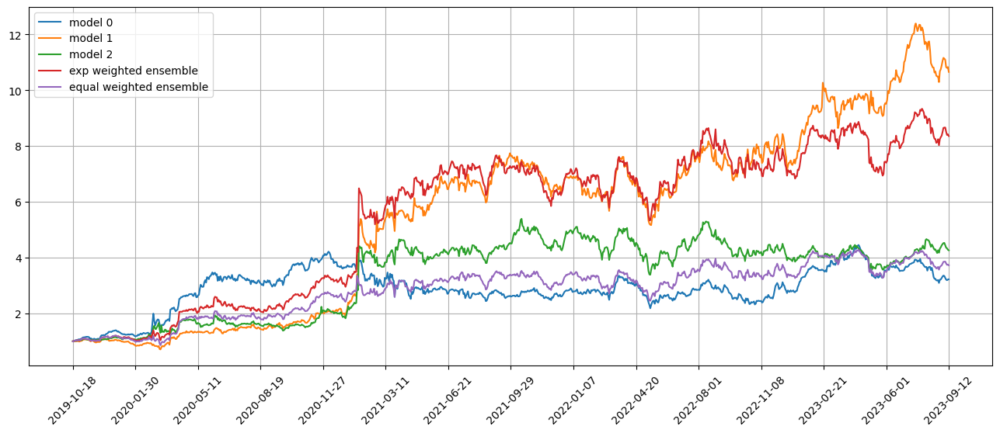

Standardization data are from 2022-11-21 to 2023-04-17
Training data are from 2023-04-18 to 2023-09-08
Testing data are from 2023-08-14 to 2023-10-06
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 50 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0190 - val_loss: 0.0172 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0188 - val_loss: 0.0169 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0187 - val_loss: 0.0169 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0187 - val_loss: 0.0166 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0186 - val_loss: 0.0169 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0186 - val_loss: 0.0168 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 4ms/step - loss: 0.0186 - val_loss: 0.0168 - lr: 0.0100
Epoch 8/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0185 - val_loss: 0.0171 - lr: 0.0100
Epoch 9/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0185 - val_loss: 0.0170 - lr: 0.0100
Epoch 10/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0182 - val_loss: 0.0169 - lr: 0.0050
Epoch 11/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0182 - val_loss: 0.0168 - lr: 0.0050
Epoch 12/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0182 - val_loss: 0.0168 - lr: 0.0050
Epoch 13/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0182 - val_loss: 0.0169 - lr: 0.0050
Epoch 14/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0182 - val_loss: 0.0168 - lr: 0.0050
Epoch 15/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0180 - val_loss: 

146/146 [==============================] - 1s 4ms/step - loss: 0.0178 - val_loss: 0.0166 - lr: 0.0012
Epoch 23/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0178 - val_loss: 0.0165 - lr: 0.0012
Epoch 24/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0178 - val_loss: 0.0166 - lr: 0.0012
Epoch 25/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0178 - val_loss: 0.0166 - lr: 0.0012
Epoch 26/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0178 - val_loss: 0.0165 - lr: 0.0010
Epoch 27/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0178 - val_loss: 0.0165 - lr: 0.0010
Epoch 28/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0178 - val_loss: 0.0165 - lr: 0.0010
Epoch 29/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0178 - val_loss: 0.0165 - lr: 0.0010
Epoch 30/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0178 - val_loss

Total asset on 2023-09-14 will be 3.7805155206877648
It should be the same as 3.780515520687826
Testing data from 2023-08-16 to 2023-09-13 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2023-09-14 are ['APLS', 'OMI', 'YINN', 'RIO', 'TXN', 'DG', 'CWEB', 'BURL', 'CSIQ', 'YANG']
Total asset on 2023-09-15 will be 3.3045049820527113
It should be the same as 3.3045049820527868
top_stocks by model 1 to buy on 2023-09-14 are ['AA', 'ENR', 'DNN', 'APLS', 'TXN', 'ROST', 'PLCE', 'DFS', 'BURL', 'CGC']
Total asset on 2023-09-15 will be 11.024638142560358
It should be the same as 11.024638142560446
top_stocks by model 2 to buy on 2023-09-14 are ['VNLA', 'SAVE', 'RIO', 'CIEN', 'HIMX', 'BTI', 'UMC', 'TXN', 'AAOI', 'QTEC']
Total asset on 2023-09-15 will be 4.330705582459535
It should be the same as 4.330705582459598
top_stocks by return weighted ensemble to buy on 2023-09-14 are ['BTI', 'APLS', 'QTEC', 'UMC', 'VNLA', 'RIO', 'YANG', 'PLCE', 'BURL', 'TXN']
Total asset on 2023-09-15 wi

Total asset on 2023-09-25 will be 3.623891708894829
It should be the same as 3.6238917088948908
Testing data from 2023-08-25 to 2023-09-22 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2023-09-25 are ['SILJ', 'IAG', 'NUGT', 'HL', 'PPLT', 'GOGL', 'QTEC', 'JNUG', 'HE', 'EXPRQ']
Total asset on 2023-09-26 will be 3.1424569205579447
It should be the same as 3.14245692055802
top_stocks by model 1 to buy on 2023-09-25 are ['SIVR', 'HL', 'AGQ', 'PLAY', 'NUGT', 'JNUG', 'PPLT', 'FCEL', 'EXPRQ', 'HE']
Total asset on 2023-09-26 will be 10.292152089440108
It should be the same as 10.292152089440197
top_stocks by model 2 to buy on 2023-09-25 are ['CSTM', 'EPC', 'MLI', 'CENX', 'LYG', 'EBAY', 'IAG', 'TROX', 'QTEC', 'XELA']
Total asset on 2023-09-26 will be 4.173631420951903
It should be the same as 4.173631420951967
top_stocks by return weighted ensemble to buy on 2023-09-25 are ['LYG', 'SILJ', 'FCEL', 'IAG', 'HL', 'NUGT', 'PPLT', 'JNUG', 'EXPRQ', 'HE']
Total asset on 2023-09-26 w

Testing data from 2023-09-06 to 2023-10-03 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2023-10-04 are ['KOS', 'OXY', 'PZA', 'RRC', 'CBU', 'HBI', 'VET', 'AR', 'OVV', 'RSPT']
Total asset on 2023-10-05 will be 2.9994959224481077
It should be the same as 2.999495922448183
top_stocks by model 1 to buy on 2023-10-04 are ['AER', 'EXLS', 'DHT', 'WRK', 'SWBI', 'RRC', 'CBU', 'RSPT', 'OVV', 'XELA']
Total asset on 2023-10-05 will be 10.162111544353662
It should be the same as 10.162111544353765
top_stocks by model 2 to buy on 2023-10-04 are ['TWM', 'WEC', 'PB', 'SRTY', 'OVV', 'HOMB', 'PZA', 'SWBI', 'RSPT', 'XELA']
Total asset on 2023-10-05 will be 4.063021784345262
It should be the same as 4.063021784345328
top_stocks by return weighted ensemble to buy on 2023-10-04 are ['WRK', 'KOS', 'AER', 'PB', 'RRC', 'CBU', 'SWBI', 'OVV', 'XELA', 'RSPT']
Total asset on 2023-10-05 will be 7.713575541651545
It should be the same as 7.713575541651655
top_stocks by equal weighted ensemble to

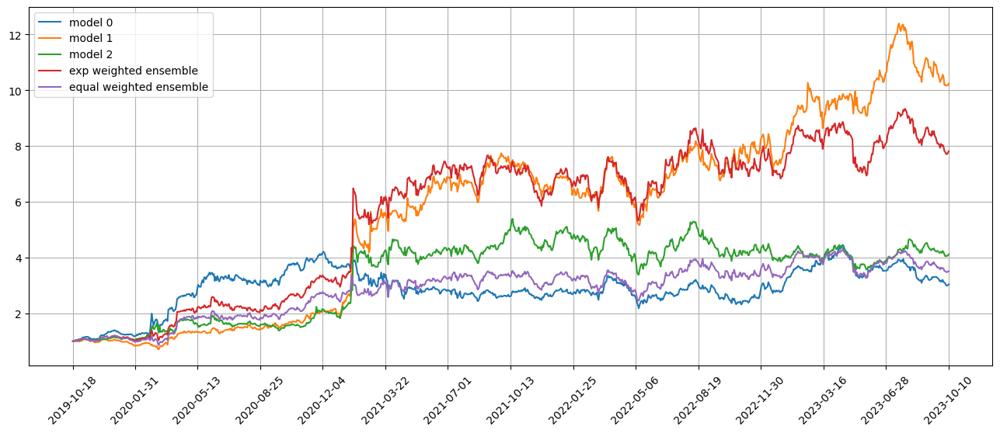

Standardization data are from 2022-12-20 to 2023-05-15
Training data are from 2023-05-16 to 2023-10-06
Testing data are from 2023-09-12 to 2023-11-03
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 51 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0171 - val_loss: 0.0209 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0169 - val_loss: 0.0214 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0169 - val_loss: 0.0209 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0168 - val_loss: 0.0212 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0167 - val_loss: 0.0208 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0167 - val_loss: 0.0209 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 4ms/step - loss: 0.0163 - val_loss: 0.0209 - lr: 0.0025
Epoch 14/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0162 - val_loss: 0.0211 - lr: 0.0025
Epoch 15/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0162 - val_loss: 0.0214 - lr: 0.0025
Epoch 16/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0162 - val_loss: 0.0213 - lr: 0.0025
Epoch 17/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0161 - val_loss: 0.0212 - lr: 0.0012
Epoch 18/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0161 - val_loss: 0.0211 - lr: 0.0012
Epoch 19/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0161 - val_loss: 0.0212 - lr: 0.0012
Epoch 20/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0161 - val_loss: 0.0212 - lr: 0.0012
Epoch 21/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0161 - val_loss

Testing data from 2023-09-18 to 2023-10-13 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2023-10-16 are ['RYTM', 'CVX', 'COP', 'COMT', 'VET', 'PSX', 'PR', 'PBF', 'MPC', 'EXPRQ']
Total asset on 2023-10-17 will be 2.9488171365772162
It should be the same as 2.9488171365772935
top_stocks by model 1 to buy on 2023-10-16 are ['TBF', 'BCS', 'SMFG', 'HMY', 'EURN', 'AGI', 'IDEX', 'UVXY', 'VIXY', 'EXPRQ']
Total asset on 2023-10-17 will be 10.573149134648844
It should be the same as 10.573149134648942
top_stocks by model 2 to buy on 2023-10-16 are ['ESTC', 'CVX', 'HMY', 'PBF', 'CVI', 'PSX', 'COLB', 'MPC', 'IDEX', 'EXPRQ']
Total asset on 2023-10-17 will be 4.291186661713263
It should be the same as 4.291186661713333
top_stocks by return weighted ensemble to buy on 2023-10-16 are ['VIXY', 'SMFG', 'HMY', 'COLB', 'PSX', 'PBF', 'CVX', 'MPC', 'IDEX', 'EXPRQ']
Total asset on 2023-10-17 will be 7.990715099462151
It should be the same as 7.990715099462264
top_stocks by equal weighted

top_stocks by model 0 to buy on 2023-10-25 are ['OMC', 'CTRE', 'EXTR', 'SGH', 'PERI', 'IRWD', 'ACHC', 'CUBI', 'CDE', 'IDEX']
Total asset on 2023-10-26 will be 2.8185692978326213
It should be the same as 2.8185692978327
top_stocks by model 1 to buy on 2023-10-25 are ['UBSI', 'IRWD', 'TECS', 'ZION', 'ABCB', 'TCBI', 'WBA', 'VRSN', 'AMBA', 'MPWR']
Total asset on 2023-10-26 will be 9.949806000809525
It should be the same as 9.94980600080963
top_stocks by model 2 to buy on 2023-10-25 are ['PERI', 'XPO', 'ZUO', 'SCO', 'RACE', 'DXC', 'IBTX', 'AMR', 'IDEX', 'ONTO']
Total asset on 2023-10-26 will be 4.047335225972633
It should be the same as 4.047335225972702
top_stocks by return weighted ensemble to buy on 2023-10-25 are ['IRWD', 'FHB', 'COF', 'VRSN', 'CDE', 'PERI', 'CUBI', 'ONTO', 'AMBA', 'IDEX']
Total asset on 2023-10-26 will be 7.372966572417861
It should be the same as 7.372966572417976
top_stocks by equal weighted ensemble to buy on 2023-10-25 are ['VRSN', 'FHB', 'IRWD', 'COF', 'PERI', 'ON

Testing data from 2023-10-06 to 2023-11-02 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2023-11-03 are ['MANH', 'NOG', 'VET', 'NVO', 'AME', 'CNQ', 'CARS', 'VRN', 'RACE', 'ALV']
Total asset on 2023-11-06 will be 3.0652538306937727
It should be the same as 3.06525383069385
top_stocks by model 1 to buy on 2023-11-03 are ['HTH', 'HZO', 'WM', 'WDFC', 'RACE', 'DY', 'OEF', 'H', 'VET', 'DG']
Total asset on 2023-11-06 will be 10.089728932206388
It should be the same as 10.0897289322065
top_stocks by model 2 to buy on 2023-11-03 are ['FLR', 'FND', 'OEF', 'WSO', 'GRBK', 'TEL', 'PTEN', 'VET', 'XHB', 'TT']
Total asset on 2023-11-06 will be 4.176785662917648
It should be the same as 4.176785662917717
top_stocks by return weighted ensemble to buy on 2023-11-03 are ['TT', 'H', 'PTEN', 'NOG', 'CNQ', 'APA', 'SLB', 'OXY', 'RACE', 'VET']
Total asset on 2023-11-06 will be 7.258518254371133
It should be the same as 7.258518254371257
top_stocks by equal weighted ensemble to buy on 2023-

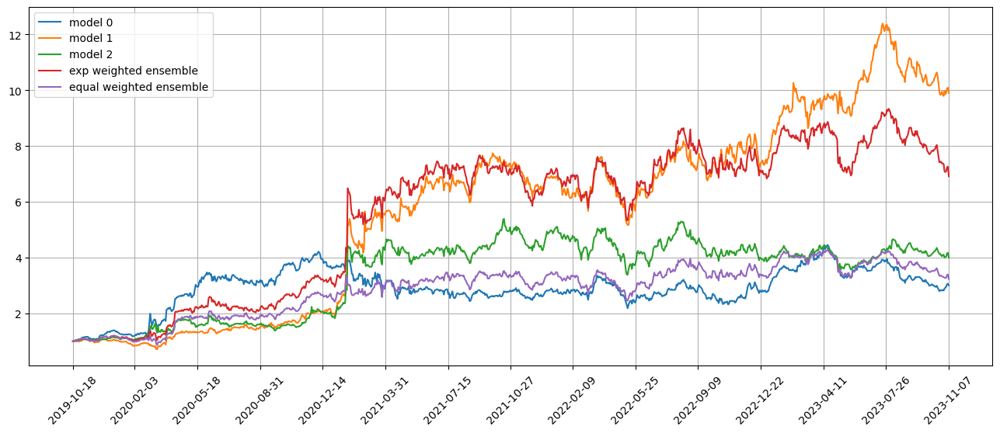

Standardization data are from 2023-01-20 to 2023-06-13
Training data are from 2023-06-14 to 2023-11-03
Testing data are from 2023-10-10 to 2023-12-04
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 52 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0174 - val_loss: 0.0255 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0172 - val_loss: 0.0267 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0170 - val_loss: 0.0260 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0170 - val_loss: 0.0269 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0170 - val_loss: 0.0260 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0169 - val_loss: 0.0262 - lr: 0.0100
Epoch 7/500
146/146 [

46/46 [==============================] - 0s 4ms/step
Model 1 training loss 0.025758638978004456
12/12 [==============================] - 0s 3ms/step
Model 1 test loss 0.026316281408071518
46/46 [==============================] - 0s 3ms/step
Model 2 training loss 0.025177855044603348
12/12 [==============================] - 0s 2ms/step
Model 2 test loss 0.025634635239839554
Correlations between old and new weights
0.9995183414764988
0.9932878962547386
0.9995830975857724
0.9904175622240214
0.999607650155833
0.991398957398841
Weight of model 0 is 0.29662772402261983
Weight of model 1 is 0.35488932365652903
Weight of model 2 is 0.34848295232085125
Testing data from 2023-10-10 to 2023-11-06 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2023-11-07 are ['BTU', 'SE', 'H', 'DDD', 'AEIS', 'SHO', 'RRR', 'REMX', 'PAYC', 'IDEX']
Total asset on 2023-11-08 will be 3.0291950363375215
It should be the same as 3.029195036337599
top_stocks by model 1 to buy on 2023-11-07 are ['RRR', 

top_stocks by model 2 to buy on 2023-11-15 are ['CPRX', 'FTDR', 'BOOT', 'EPD', 'IYH', 'TBT', 'REGN', 'FCFS', 'UNIT', 'IVW']
Total asset on 2023-11-16 will be 4.2491963353291835
It should be the same as 4.249196335329253
top_stocks by return weighted ensemble to buy on 2023-11-15 are ['OHI', 'SLCA', 'YANG', 'CRTO', 'RSPT', 'FCFS', 'BOOT', 'BBY', 'IVW', 'UNIT']
Total asset on 2023-11-16 will be 7.620073767822505
It should be the same as 7.620073767822634
top_stocks by equal weighted ensemble to buy on 2023-11-15 are ['OHI', 'SLCA', 'YANG', 'RSPT', 'FCFS', 'BOOT', 'CRTO', 'IVW', 'BBY', 'UNIT']
Total asset on 2023-11-16 will be 3.5833532379394923
It should be the same as 3.58335323793956
Testing data from 2023-10-19 to 2023-11-15 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2023-11-16 are ['ATRA', 'FIVE', 'CWEN', 'GEO', 'RSPT', 'DEO', 'UNF', 'PTCT', 'CQP', 'IVW']
Total asset on 2023-11-17 will be 3.3040807336315297
It should be the same as 3.304080733631608
top_stocks

Total asset on 2023-11-28 will be 4.117001961877425
It should be the same as 4.117001961877498
top_stocks by return weighted ensemble to buy on 2023-11-27 are ['JDST', 'PSLV', 'VIRT', 'CQP', 'PSQ', 'SPDN', 'TBT', 'TBF', 'UUP', 'IVW']
Total asset on 2023-11-28 will be 7.612810908426436
It should be the same as 7.612810908426564
top_stocks by equal weighted ensemble to buy on 2023-11-27 are ['JDST', 'PSLV', 'VIRT', 'PSQ', 'CQP', 'TBT', 'SPDN', 'TBF', 'UUP', 'IVW']
Total asset on 2023-11-28 will be 3.5845091965847584
It should be the same as 3.584509196584826
Testing data from 2023-10-30 to 2023-11-27 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2023-11-28 are ['EZA', 'GDXJ', 'ABT', 'HMY', 'RACE', 'QSR', 'SHAK', 'CWH', 'EGO', 'IVW']
Total asset on 2023-11-29 will be 3.3308391112947113
It should be the same as 3.3308391112947877
top_stocks by model 1 to buy on 2023-11-28 are ['SPB', 'FAZ', 'EGO', 'SHAK', 'GFI', 'SRTY', 'MDRX', 'BTAI', 'HMY', 'IVW']
Total asset on 2023

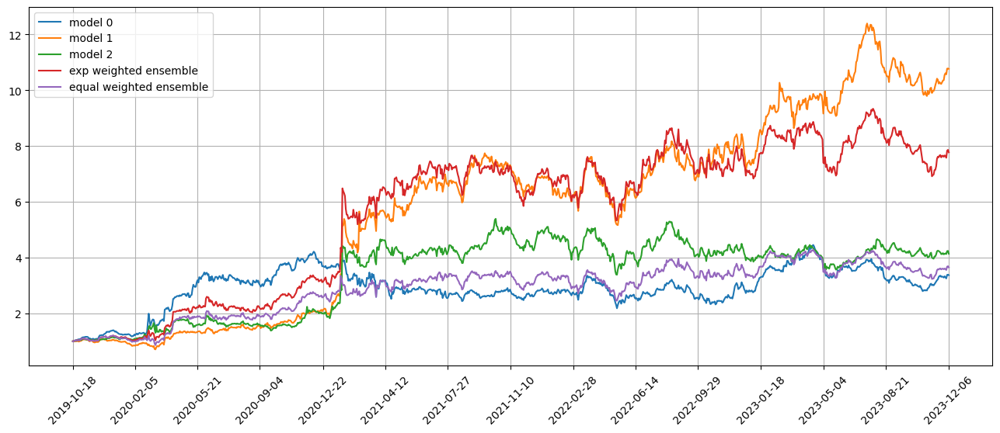

Standardization data are from 2023-02-17 to 2023-07-13
Training data are from 2023-07-14 to 2023-12-04
Testing data are from 2023-11-07 to 2024-01-03
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 53 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0187 - val_loss: 0.0195 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0184 - val_loss: 0.0198 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0182 - val_loss: 0.0193 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0181 - val_loss: 0.0193 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0180 - val_loss: 0.0196 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0180 - val_loss: 0.0193 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 4ms/step - loss: 0.0172 - val_loss: 0.0193 - lr: 0.0010
Epoch 36/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0171 - val_loss: 0.0195 - lr: 0.0010
Epoch 37/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0172 - val_loss: 0.0193 - lr: 0.0010
Epoch 38/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0172 - val_loss: 0.0193 - lr: 0.0010
Epoch 39/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0172 - val_loss: 0.0194 - lr: 0.0010
Epoch 40/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0171 - val_loss: 0.0195 - lr: 0.0010
Epoch 41/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0172 - val_loss: 0.0194 - lr: 0.0010
Epoch 42/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0171 - val_loss: 0.0195 - lr: 0.0010
Epoch 43/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0171 - val_loss

Total asset on 2023-12-08 will be 3.3944645912718467
It should be the same as 3.394464591271923
top_stocks by model 1 to buy on 2023-12-07 are ['SCCO', 'EXC', 'CLNE', 'PRG', 'REMX', 'XLG', 'URBN', 'SPIP', 'TM', 'EXPRQ']
Total asset on 2023-12-08 will be 10.892406739269797
It should be the same as 10.892406739269909
top_stocks by model 2 to buy on 2023-12-07 are ['AN', 'SCCO', 'TM', 'ATUS', 'PRG', 'LIVN', 'CLNE', 'URBN', 'EXPRQ', 'IDEX']
Total asset on 2023-12-08 will be 4.160644433783883
It should be the same as 4.160644433783957
top_stocks by return weighted ensemble to buy on 2023-12-07 are ['JDST', 'ATUS', 'EXC', 'SCCO', 'LIVN', 'PRG', 'CLNE', 'URBN', 'TM', 'EXPRQ']
Total asset on 2023-12-08 will be 7.918808487171969
It should be the same as 7.918808487172097
top_stocks by equal weighted ensemble to buy on 2023-12-07 are ['ATUS', 'JDST', 'EXC', 'SCCO', 'LIVN', 'PRG', 'CLNE', 'URBN', 'TM', 'EXPRQ']
Total asset on 2023-12-08 will be 3.7174322214972695
It should be the same as 3.717432

top_stocks by model 1 to buy on 2023-12-18 are ['TBT', 'LPG', 'AGI', 'FWONK', 'TMV', 'RNR', 'AZN', 'ARMK', 'IDEX', 'EXPRQ']
Total asset on 2023-12-19 will be 11.601678623512946
It should be the same as 11.60167862351306
top_stocks by model 2 to buy on 2023-12-18 are ['TCOM', 'OHI', 'DBX', 'RDY', 'IRBT', 'NVDA', 'TKO', 'FWONK', 'ARMK', 'ANY']
Total asset on 2023-12-19 will be 4.431081128100657
It should be the same as 4.431081128100732
top_stocks by return weighted ensemble to buy on 2023-12-18 are ['RDY', 'IRBT', 'RNR', 'TCOM', 'VOD', 'AZN', 'FWONK', 'ARMK', 'TMV', 'EXPRQ']
Total asset on 2023-12-19 will be 8.233956790615826
It should be the same as 8.233956790615952
top_stocks by equal weighted ensemble to buy on 2023-12-18 are ['IRBT', 'RNR', 'RDY', 'TCOM', 'VOD', 'AZN', 'FWONK', 'ARMK', 'TMV', 'EXPRQ']
Total asset on 2023-12-19 will be 3.890183396773591
It should be the same as 3.890183396773657
Testing data from 2023-11-20 to 2023-12-18 have shape (2295, 20, 30), (2295,)
top_stocks

Total asset on 2023-12-29 will be 12.341079376678932
It should be the same as 12.34107937667904
top_stocks by model 2 to buy on 2023-12-28 are ['ARGX', 'APLS', 'LNG', 'ANY', 'HTHT', 'BWXT', 'CQP', 'MO', 'ABEV', 'COMT']
Total asset on 2023-12-29 will be 4.803737517882577
It should be the same as 4.803737517882656
top_stocks by return weighted ensemble to buy on 2023-12-28 are ['CQP', 'RMBS', 'ECH', 'MDB', 'BRFS', 'MO', 'APLS', 'BWXT', 'COMT', 'ABEV']
Total asset on 2023-12-29 will be 8.436474369219852
It should be the same as 8.436474369219981
top_stocks by equal weighted ensemble to buy on 2023-12-28 are ['TM', 'RMBS', 'ECH', 'MDB', 'BRFS', 'MO', 'BWXT', 'APLS', 'COMT', 'ABEV']
Total asset on 2023-12-29 will be 3.8792944542331753
It should be the same as 3.8792944542332397
Testing data from 2023-11-30 to 2023-12-28 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2023-12-29 are ['APLS', 'GIS', 'FIZZ', 'BCE', 'CAG', 'NWE', 'MRIN', 'K', 'LANC', 'RCM']
Total asset on 202

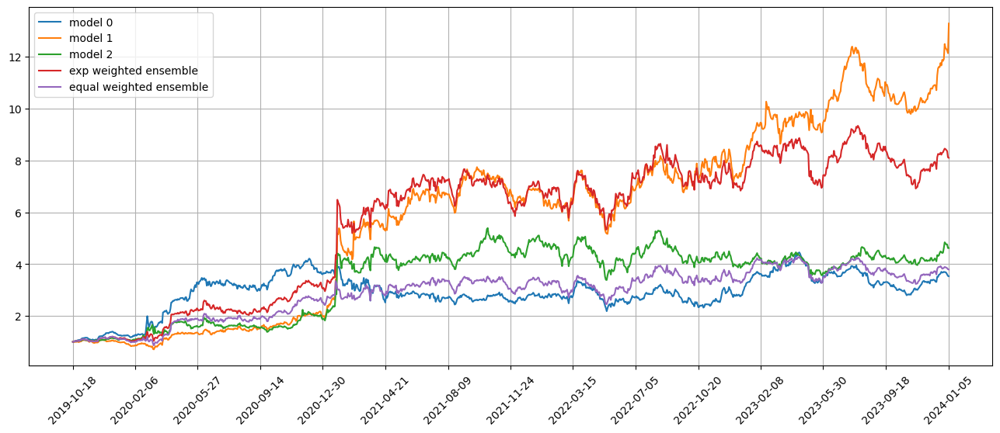

Standardization data are from 2023-03-20 to 2023-08-10
Training data are from 2023-08-11 to 2024-01-03
Testing data are from 2023-12-06 to 2024-02-01
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 54 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0181 - val_loss: 0.0206 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0178 - val_loss: 0.0205 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0177 - val_loss: 0.0206 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0176 - val_loss: 0.0206 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0176 - val_loss: 0.0207 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0176 - val_loss: 0.0206 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 4ms/step - loss: 0.0170 - val_loss: 0.0202 - lr: 0.0025
Epoch 14/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0170 - val_loss: 0.0204 - lr: 0.0025
Epoch 15/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0170 - val_loss: 0.0206 - lr: 0.0025
Epoch 16/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0170 - val_loss: 0.0202 - lr: 0.0025
Epoch 17/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0169 - val_loss: 0.0205 - lr: 0.0012
Epoch 18/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0169 - val_loss: 0.0204 - lr: 0.0012
Epoch 19/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0168 - val_loss: 0.0204 - lr: 0.0012
Epoch 20/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0168 - val_loss: 0.0206 - lr: 0.0012
Epoch 21/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0169 - val_loss

top_stocks by model 2 to buy on 2024-01-12 are ['SMPL', 'EOG', 'SRNE', 'IDEX', 'BCE', 'CVX', 'CAG', 'SPWR', 'RUSHA', 'LABU']
Total asset on 2024-01-16 will be 4.5293081986204085
It should be the same as 4.529308198620487
top_stocks by return weighted ensemble to buy on 2024-01-12 are ['ZOM', 'BMY', 'SPWR', 'VTLE', 'CAG', 'EOG', 'BCE', 'CVX', 'RUSHA', 'LABU']
Total asset on 2024-01-16 will be 7.951286298516942
It should be the same as 7.951286298517079
top_stocks by equal weighted ensemble to buy on 2024-01-12 are ['BMY', 'SPWR', 'ZOM', 'VTLE', 'CAG', 'EOG', 'BCE', 'CVX', 'RUSHA', 'LABU']
Total asset on 2024-01-16 will be 3.7093819416723868
It should be the same as 3.7093819416724525
Testing data from 2023-12-14 to 2024-01-12 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2024-01-16 are ['GRFS', 'FNV', 'MUR', 'CVX', 'NNDM', 'ANY', 'USO', 'GSG', 'UCO', 'SRNE']
Total asset on 2024-01-17 will be 3.488842958402123
It should be the same as 3.4888429584022016
top_stocks by

Total asset on 2024-01-25 will be 13.89600360622008
It should be the same as 13.896003606220187
top_stocks by model 2 to buy on 2024-01-24 are ['EWH', 'MCHI', 'FXI', 'GXC', 'CCEP', 'UUUU', 'RUSHA', 'SRNE', 'LABU', 'IDEX']
Total asset on 2024-01-25 will be 4.5957853993736855
It should be the same as 4.5957853993737645
top_stocks by return weighted ensemble to buy on 2024-01-24 are ['FTI', 'UUUU', 'EWH', 'FXI', 'EOG', 'GXC', 'RUSHA', 'LABU', 'SRNE', 'IDEX']
Total asset on 2024-01-25 will be 8.224447421622697
It should be the same as 8.224447421622836
top_stocks by equal weighted ensemble to buy on 2024-01-24 are ['UUUU', 'FTI', 'EWH', 'FXI', 'EOG', 'GXC', 'RUSHA', 'LABU', 'SRNE', 'IDEX']
Total asset on 2024-01-25 will be 3.836815282815057
It should be the same as 3.836815282815122
Testing data from 2023-12-26 to 2024-01-24 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2024-01-25 are ['PII', 'UVXY', 'HRL', 'VIXY', 'GD', 'LAAC', 'WWW', 'IDEX', 'LABU', 'SAVE']
Total ass

top_stocks by model 1 to buy on 2024-02-02 are ['CEIX', 'ARGX', 'FCX', 'COPX', 'LVS', 'GGB', 'GXC', 'SAVE', 'MLCO', 'IDEX']
Total asset on 2024-02-05 will be 14.323464866741775
It should be the same as 14.323464866741881
top_stocks by model 2 to buy on 2024-02-02 are ['CNX', 'FXI', 'AGQ', 'CTRA', 'ASHR', 'ATUS', 'GXC', 'VANI', 'EQT', 'RRC']
Total asset on 2024-02-05 will be 4.404155193991085
It should be the same as 4.404155193991164
top_stocks by return weighted ensemble to buy on 2024-02-02 are ['TD', 'BTU', 'ATUS', 'MLCO', 'ASHR', 'GGB', 'VANI', 'GXC', 'RRC', 'EQT']
Total asset on 2024-02-05 will be 8.139452878271154
It should be the same as 8.139452878271294
top_stocks by equal weighted ensemble to buy on 2024-02-02 are ['AKR', 'MLCO', 'BTU', 'ATUS', 'ASHR', 'GGB', 'VANI', 'GXC', 'RRC', 'EQT']
Total asset on 2024-02-05 will be 3.766602252963789
It should be the same as 3.766602252963855
Model 0 changed 1.0585584302242534 percent from 2023-08-14 to 2024-02-05
Model 1 changed 30.5931

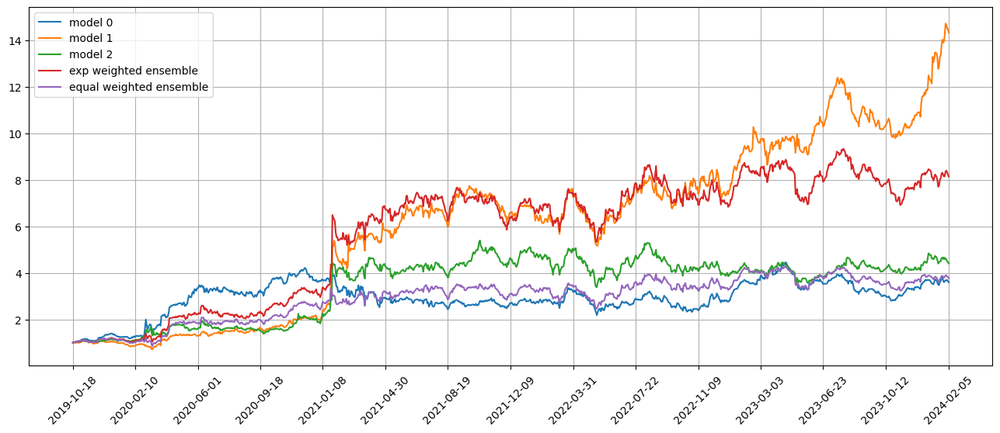

Standardization data are from 2023-04-18 to 2023-09-08
Training data are from 2023-09-11 to 2024-02-01
Testing data are from 2024-01-05 to 2024-03-01
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 55 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0176 - val_loss: 0.0194 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0174 - val_loss: 0.0193 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0173 - val_loss: 0.0196 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0172 - val_loss: 0.0193 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0171 - val_loss: 0.0193 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0171 - val_loss: 0.0195 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 4ms/step - loss: 0.0171 - val_loss: 0.0195 - lr: 0.0100
Epoch 10/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0168 - val_loss: 0.0198 - lr: 0.0050
Epoch 11/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0168 - val_loss: 0.0195 - lr: 0.0050
Epoch 12/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0168 - val_loss: 0.0196 - lr: 0.0050
Epoch 13/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0168 - val_loss: 0.0198 - lr: 0.0050
Epoch 14/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0168 - val_loss: 0.0195 - lr: 0.0050
Epoch 15/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0167 - val_loss: 0.0196 - lr: 0.0050
Epoch 16/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0167 - val_loss: 0.0197 - lr: 0.0050
Epoch 17/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0166 - val_loss

top_stocks by model 0 to buy on 2024-02-08 are ['SQQQ', 'SPXS', 'OHI', 'QID', 'WDFC', 'HTHT', 'POR', 'PSQ', 'TJX', 'SOXS']
Total asset on 2024-02-09 will be 3.6660038274884177
It should be the same as 3.6660038274884963
top_stocks by model 1 to buy on 2024-02-08 are ['DXJ', 'VNET', 'AEE', 'HTHT', 'ANSS', 'FWONK', 'ZTO', 'WDFC', 'BILI', 'CQP']
Total asset on 2024-02-09 will be 14.657208389678763
It should be the same as 14.657208389678877
top_stocks by model 2 to buy on 2024-02-08 are ['BIDU', 'TKO', 'TJX', 'PTGX', 'DVAX', 'AEE', 'ZTO', 'CQQQ', 'SOXS', 'BILI']
Total asset on 2024-02-09 will be 4.410093079958554
It should be the same as 4.410093079958633
top_stocks by return weighted ensemble to buy on 2024-02-08 are ['WDFC', 'GDS', 'POR', 'CQQQ', 'AEE', 'HTHT', 'ZTO', 'SOXS', 'TJX', 'BILI']
Total asset on 2024-02-09 will be 8.37727343851122
It should be the same as 8.37727343851136
top_stocks by equal weighted ensemble to buy on 2024-02-08 are ['PSQ', 'GDS', 'CQQQ', 'POR', 'AEE', 'ZTO',

Total asset on 2024-02-21 will be 3.6152181338121476
It should be the same as 3.6152181338122267
top_stocks by model 1 to buy on 2024-02-20 are ['OHI', 'YPF', 'EXEL', 'CDNS', 'POWI', 'SPWR', 'RMBS', 'SNPS', 'SPB', 'SRNE']
Total asset on 2024-02-21 will be 14.328166293670881
It should be the same as 14.328166293670998
top_stocks by model 2 to buy on 2024-02-20 are ['RMBS', 'ES', 'CAG', 'LABU', 'DEI', 'MPW', 'SNPS', 'FR', 'POWI', 'SRNE']
Total asset on 2024-02-21 will be 4.401626417807987
It should be the same as 4.401626417808065
top_stocks by return weighted ensemble to buy on 2024-02-20 are ['RMBS', 'ES', 'CSGS', 'CAG', 'OHI', 'FR', 'SPB', 'SNPS', 'POWI', 'SRNE']
Total asset on 2024-02-21 will be 7.9993203627906695
It should be the same as 7.999320362790817
top_stocks by equal weighted ensemble to buy on 2024-02-20 are ['RMBS', 'CSGS', 'CAG', 'ES', 'OHI', 'SPB', 'FR', 'SNPS', 'POWI', 'SRNE']
Total asset on 2024-02-21 will be 3.7500001086832655
It should be the same as 3.75000010868333

Total asset on 2024-02-29 will be 3.658180001159842
It should be the same as 3.658180001159913
Testing data from 2024-01-31 to 2024-02-28 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2024-02-29 are ['EQT', 'GTHX', 'CCI', 'CC', 'YY', 'EL', 'HLF', 'ALT', 'SLB', 'AHT']
Total asset on 2024-03-01 will be 3.7640639314291864
It should be the same as 3.7640639314292654
top_stocks by model 1 to buy on 2024-02-29 are ['CCI', 'CC', 'TZA', 'SDS', 'HLF', 'RYN', 'SH', 'HR', 'NUS', 'SRNE']
Total asset on 2024-03-01 will be 14.102319619919811
It should be the same as 14.10231961991994
top_stocks by model 2 to buy on 2024-02-29 are ['LEG', 'NBR', 'FCPT', 'GFI', 'YY', 'EVRG', 'PLUG', 'ECH', 'SO', 'SLB']
Total asset on 2024-03-01 will be 4.263238925955367
It should be the same as 4.263238925955446
top_stocks by return weighted ensemble to buy on 2024-02-29 are ['SH', 'CC', 'CCI', 'YY', 'HLF', 'AHT', 'HR', 'SLB', 'NUS', 'SRNE']
Total asset on 2024-03-01 will be 7.772514561532833
It s

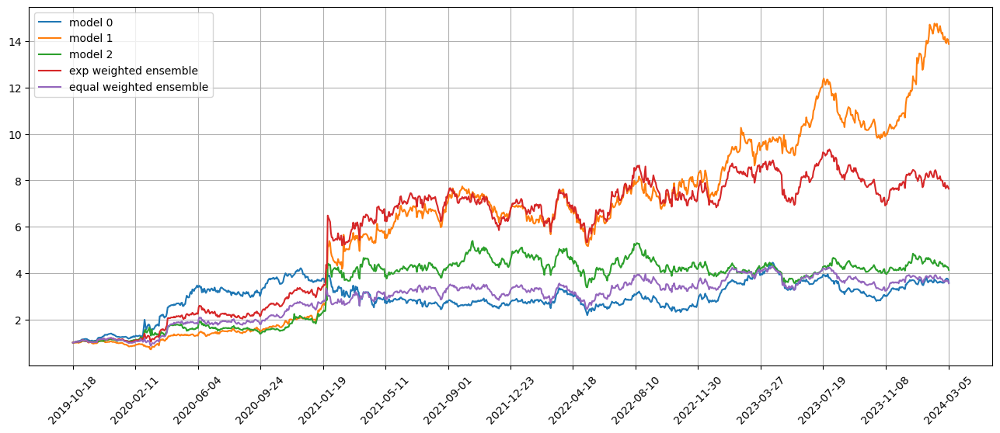

Standardization data are from 2023-05-16 to 2023-10-06
Training data are from 2023-10-09 to 2024-03-01
Testing data are from 2024-02-05 to 2024-04-01
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 56 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0166 - val_loss: 0.0203 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0165 - val_loss: 0.0208 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0164 - val_loss: 0.0212 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0163 - val_loss: 0.0199 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0162 - val_loss: 0.0209 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0162 - val_loss: 0.0218 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 4ms/step - loss: 0.0156 - val_loss: 0.0233 - lr: 0.0012
Epoch 19/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0156 - val_loss: 0.0232 - lr: 0.0012
Epoch 20/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0156 - val_loss: 0.0233 - lr: 0.0012
Epoch 21/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0156 - val_loss: 0.0231 - lr: 0.0012
Epoch 21: early stopping
46/46 [==============================] - 0s 3ms/step
Model 0 training loss 0.02413407899439335
12/12 [==============================] - 0s 2ms/step
Model 0 test loss 0.0265569519251585
46/46 [==============================] - 0s 3ms/step
Model 1 training loss 0.02511572279036045
12/12 [==============================] - 0s 3ms/step
Model 1 test loss 0.02724570780992508
46/46 [==============================] - 0s 5ms/step
Model 2 training loss 0.024753006175160408
12/12 [==============================] - 0s 3ms/step
Model 2 

Testing data from 2024-02-13 to 2024-03-12 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2024-03-13 are ['HEI.A', 'AMR', 'IRDM', 'STAG', 'MHK', 'ANY', 'EMR', 'ALT', 'IRWD', 'SRNE']
Total asset on 2024-03-14 will be 3.587812411576931
It should be the same as 3.5878124115770085
top_stocks by model 1 to buy on 2024-03-13 are ['SPDN', 'TM', 'SDOW', 'SUNWQ', 'UVXY', 'VIXY', 'DXD', 'DOG', 'ALT', 'VANI']
Total asset on 2024-03-14 will be 13.400140641911314
It should be the same as 13.400140641911445
top_stocks by model 2 to buy on 2024-03-13 are ['HEI.A', 'GNRC', 'ALT', 'COLD', 'FLEX', 'UVXY', 'HAS', 'TTWO', 'MDRX', 'FSLR']
Total asset on 2024-03-14 will be 4.0511062912205
It should be the same as 4.051106291220583
top_stocks by return weighted ensemble to buy on 2024-03-13 are ['VIXY', 'TM', 'STAG', 'ANY', 'HEI.A', 'VKTX', 'IRWD', 'EMR', 'FSLR', 'ALT']
Total asset on 2024-03-14 will be 7.472182943158384
It should be the same as 7.4721829431585345
top_stocks by equal weig

top_stocks by model 0 to buy on 2024-03-22 are ['WIT', 'AMX', 'TNET', 'ATHM', 'MGNX', 'BIDU', 'HTHT', 'CWK', 'INO', 'SRNE']
Total asset on 2024-03-25 will be 3.7184862464324477
It should be the same as 3.718486246432523
top_stocks by model 1 to buy on 2024-03-22 are ['SAVA', 'JD', 'PHG', 'RCUS', 'PUK', 'MD', 'BIDU', 'ATHM', 'INO', 'SRNE']
Total asset on 2024-03-25 will be 13.606943236380173
It should be the same as 13.606943236380307
top_stocks by model 2 to buy on 2024-03-22 are ['TBT', 'CWEB', 'TMV', 'INO', 'TECK', 'CHRW', 'ATHM', 'MDRX', 'MD', 'SRNE']
Total asset on 2024-03-25 will be 4.250200158254646
It should be the same as 4.250200158254728
top_stocks by return weighted ensemble to buy on 2024-03-22 are ['ABR', 'RCUS', 'SAVA', 'HTHT', 'PHG', 'BIDU', 'ATHM', 'MD', 'INO', 'SRNE']
Total asset on 2024-03-25 will be 7.671184360757876
It should be the same as 7.671184360758025
top_stocks by equal weighted ensemble to buy on 2024-03-22 are ['CME', 'ABR', 'SAVA', 'PHG', 'HTHT', 'BIDU', 

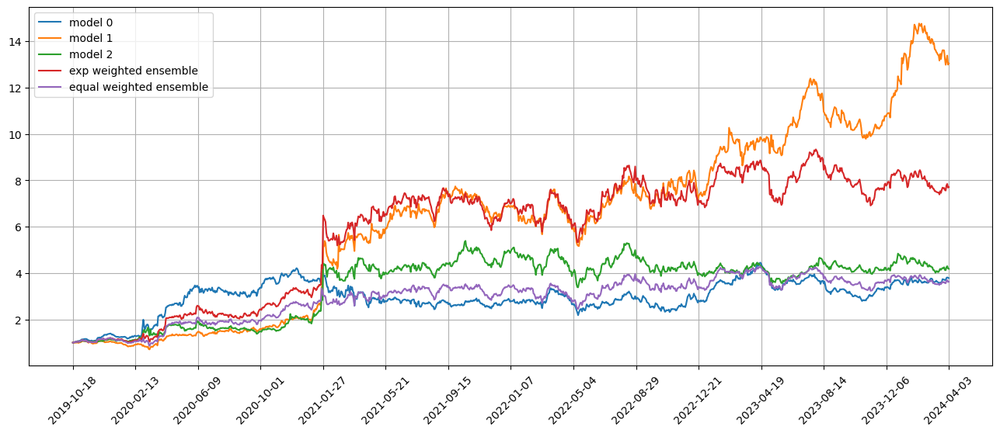

Standardization data are from 2023-06-14 to 2023-11-03
Training data are from 2023-11-06 to 2024-04-01
Testing data are from 2024-03-05 to 2024-04-29
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 57 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 5ms/step - loss: 0.0174 - val_loss: 0.0192 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0173 - val_loss: 0.0196 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0172 - val_loss: 0.0192 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0171 - val_loss: 0.0191 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0171 - val_loss: 0.0198 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0170 - val_loss: 0.0201 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 4ms/step - loss: 0.0164 - val_loss: 0.0200 - lr: 0.0025
Epoch 20/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0164 - val_loss: 0.0194 - lr: 0.0025
Epoch 21/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0164 - val_loss: 0.0197 - lr: 0.0025
Epoch 22/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0164 - val_loss: 0.0196 - lr: 0.0025
Epoch 23/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0163 - val_loss: 0.0198 - lr: 0.0012
Epoch 24/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0163 - val_loss: 0.0196 - lr: 0.0012
Epoch 25/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0163 - val_loss: 0.0191 - lr: 0.0012
Epoch 26/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0163 - val_loss: 0.0195 - lr: 0.0012
Epoch 27/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0163 - val_loss

Total asset on 2024-04-04 will be 3.8498642907824943
It should be the same as 3.849864290782571
top_stocks by model 1 to buy on 2024-04-03 are ['QTWO', 'TRIP', 'SBLK', 'BAND', 'NTAP', 'GOGL', 'ALT', 'SUNWQ', 'NSTGQ', 'VANI']
Total asset on 2024-04-04 will be 13.303700392813415
It should be the same as 13.303700392813552
top_stocks by model 2 to buy on 2024-04-03 are ['KPTI', 'NVRO', 'SGMO', 'ELME', 'RYTM', 'URBN', 'KRYS', 'NBIX', 'GRFS', 'AGIO']
Total asset on 2024-04-04 will be 4.2442986992463085
It should be the same as 4.244298699246393
top_stocks by return weighted ensemble to buy on 2024-04-03 are ['LULU', 'GBIL', 'ALT', 'SBLK', 'BAND', 'GOGL', 'NTAP', 'SUNWQ', 'NSTGQ', 'VANI']
Total asset on 2024-04-04 will be 7.796242889400207
It should be the same as 7.796242889400358
top_stocks by equal weighted ensemble to buy on 2024-04-03 are ['GBIL', 'LULU', 'ALT', 'SBLK', 'BAND', 'GOGL', 'NTAP', 'SUNWQ', 'NSTGQ', 'VANI']
Total asset on 2024-04-04 will be 3.6677041797848897
It should be th

top_stocks by model 0 to buy on 2024-04-12 are ['RGNX', 'INO', 'PTC', 'SABR', 'SWBI', 'NOW', 'MGNX', 'SRNE', 'BBVA', 'MSTR']
Total asset on 2024-04-15 will be 3.4596285488968066
It should be the same as 3.4596285488968856
top_stocks by model 1 to buy on 2024-04-12 are ['GOGL', 'GE', 'GL', 'NVDA', 'SMCI', 'BVN', 'ALT', 'SUNWQ', 'NSTGQ', 'VANI']
Total asset on 2024-04-15 will be 13.272144606463575
It should be the same as 13.272144606463712
top_stocks by model 2 to buy on 2024-04-12 are ['BMRN', 'ARGX', 'GRFS', 'INSP', 'MCRB', 'INGN', 'RGNX', 'AGIO', 'ARWR', 'GBIL']
Total asset on 2024-04-15 will be 4.066706544574035
It should be the same as 4.066706544574123
top_stocks by return weighted ensemble to buy on 2024-04-12 are ['MRVL', 'SWBI', 'MSTR', 'MGNX', 'BBVA', 'RGNX', 'ALT', 'SUNWQ', 'NSTGQ', 'VANI']
Total asset on 2024-04-15 will be 7.498834752132549
It should be the same as 7.4988347521327
top_stocks by equal weighted ensemble to buy on 2024-04-12 are ['MRVL', 'SWBI', 'MSTR', 'MGNX',

Total asset on 2024-04-23 will be 3.2412318509192297
It should be the same as 3.2412318509193057
Testing data from 2024-03-25 to 2024-04-22 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2024-04-23 are ['STLD', 'LRCX', 'PCAR', 'AMAT', 'GPS', 'APH', 'META', 'SMH', 'SRNE', 'NVDA']
Total asset on 2024-04-24 will be 3.471723550137823
It should be the same as 3.4717235501379013
top_stocks by model 1 to buy on 2024-04-23 are ['VKTX', 'MU', 'META', 'MRIN', 'MGNX', 'NVDA', 'SMCI', 'SUNWQ', 'NSTGQ', 'VANI']
Total asset on 2024-04-24 will be 12.363510298726247
It should be the same as 12.363510298726393
top_stocks by model 2 to buy on 2024-04-23 are ['INSM', 'BGNE', 'RCUS', 'CLDX', 'AAPL', 'ASND', 'BPMC', 'MGNX', 'HRTX', 'RYTM']
Total asset on 2024-04-24 will be 3.982128135511564
It should be the same as 3.982128135511654
top_stocks by return weighted ensemble to buy on 2024-04-23 are ['VST', 'URI', 'MRIN', 'PCAR', 'AVGO', 'META', 'SMCI', 'NVDA', 'SUNWQ', 'NSTGQ']
Total asset

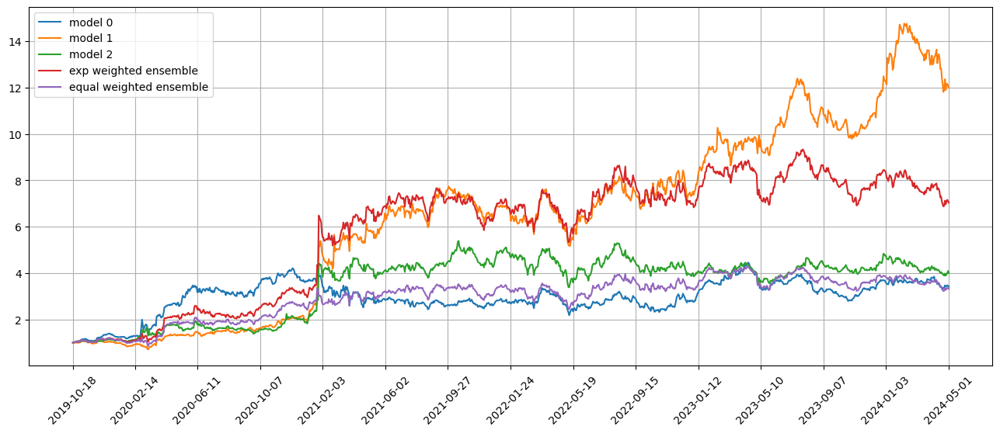

Standardization data are from 2023-07-14 to 2023-12-04
Training data are from 2023-12-05 to 2024-04-29
Testing data are from 2024-04-03 to 2024-05-28
Training data have shape (185895, 20, 30), (185895,)
Testing data have shape (45900, 20, 30), (45900,)
Running iteration 58 out of 58 iterations
Epoch 1/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0182 - val_loss: 0.0229 - lr: 0.0100
Epoch 2/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0182 - val_loss: 0.0218 - lr: 0.0100
Epoch 3/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0180 - val_loss: 0.0223 - lr: 0.0100
Epoch 4/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0180 - val_loss: 0.0209 - lr: 0.0100
Epoch 5/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0179 - val_loss: 0.0212 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0179 - val_loss: 0.0215 - lr: 0.0100
Epoch 7/500
146/146 [

146/146 [==============================] - 1s 4ms/step - loss: 0.0179 - val_loss: 0.0212 - lr: 0.0100
Epoch 6/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0179 - val_loss: 0.0210 - lr: 0.0100
Epoch 7/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0179 - val_loss: 0.0215 - lr: 0.0100
Epoch 8/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0178 - val_loss: 0.0216 - lr: 0.0100
Epoch 9/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0178 - val_loss: 0.0218 - lr: 0.0100
Epoch 10/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0177 - val_loss: 0.0222 - lr: 0.0100
Epoch 11/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0178 - val_loss: 0.0224 - lr: 0.0100
Epoch 12/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0175 - val_loss: 0.0210 - lr: 0.0050
Epoch 13/500
146/146 [==============================] - 1s 4ms/step - loss: 0.0175 - val_loss: 0.

Total asset on 2024-05-03 will be 3.491971584913896
It should be the same as 3.4919715849139745
top_stocks by model 1 to buy on 2024-05-02 are ['AON', 'NSTGQ', 'BHP', 'ALSN', 'GE', 'GPK', 'HI', 'BYD', 'TEX', 'IGM']
Total asset on 2024-05-03 will be 12.31345384378694
It should be the same as 12.313453843787086
top_stocks by model 2 to buy on 2024-05-02 are ['AEM', 'LNG', 'AON', 'BLKB', 'FANG', 'CENX', 'PVH', 'CNC', 'IGM', 'BVN']
Total asset on 2024-05-03 will be 4.044960195052648
It should be the same as 4.044960195052738
top_stocks by return weighted ensemble to buy on 2024-05-02 are ['VRTS', 'TNET', 'CNC', 'ALV', 'TEX', 'CINF', 'BYD', 'FHI', 'ALSN', 'IGM']
Total asset on 2024-05-03 will be 7.192779810877948
It should be the same as 7.192779810878096
top_stocks by equal weighted ensemble to buy on 2024-05-02 are ['VRTS', 'TNET', 'TEX', 'ALV', 'CINF', 'BYD', 'CNC', 'FHI', 'ALSN', 'IGM']
Total asset on 2024-05-03 will be 3.3876291581813
It should be the same as 3.3876291581813764
Testing

top_stocks by model 1 to buy on 2024-05-13 are ['CQP', 'BLDR', 'ATKR', 'ORI', 'LRN', 'JELD', 'GL', 'MDRX', 'INO', 'SRNE']
Total asset on 2024-05-14 will be 13.12067737229422
It should be the same as 13.12067737229437
top_stocks by model 2 to buy on 2024-05-13 are ['LDOS', 'MEDP', 'KMB', 'BSX', 'PHG', 'BLDR', 'HIBB', 'MPLX', 'WWD', 'INO']
Total asset on 2024-05-14 will be 4.257142847439647
It should be the same as 4.257142847439733
top_stocks by return weighted ensemble to buy on 2024-05-13 are ['BWXT', 'MPLX', 'BLDR', 'GEO', 'AL', 'WWD', 'ATKR', 'GL', 'INO', 'SRNE']
Total asset on 2024-05-14 will be 7.341156506582058
It should be the same as 7.341156506582208
top_stocks by equal weighted ensemble to buy on 2024-05-13 are ['DIS', 'MPLX', 'GEO', 'BLDR', 'AL', 'WWD', 'ATKR', 'GL', 'INO', 'SRNE']
Total asset on 2024-05-14 will be 3.4340471755224016
It should be the same as 3.4340471755224766
Testing data from 2024-04-16 to 2024-05-13 have shape (2295, 20, 30), (2295,)
top_stocks by model 0

top_stocks by model 2 to buy on 2024-05-22 are ['SFM', 'AMAT', 'TTMI', 'SMCI', 'INO', 'ASML', 'BVN', 'HWM', 'TSM', 'NVDA']
Total asset on 2024-05-23 will be 4.327838540590648
It should be the same as 4.327838540590729
top_stocks by return weighted ensemble to buy on 2024-05-22 are ['HLI', 'CW', 'ARES', 'NRG', 'DFS', 'CB', 'COF', 'STE', 'ATGE', 'GL']
Total asset on 2024-05-23 will be 7.104511076069835
It should be the same as 7.104511076069987
top_stocks by equal weighted ensemble to buy on 2024-05-22 are ['NRG', 'HLI', 'ARES', 'CW', 'CB', 'DFS', 'COF', 'STE', 'ATGE', 'GL']
Total asset on 2024-05-23 will be 3.3249940897636185
It should be the same as 3.3249940897636963
Testing data from 2024-04-25 to 2024-05-22 have shape (2295, 20, 30), (2295,)
top_stocks by model 0 to buy on 2024-05-23 are ['HLNE', 'INO', 'GLOB', 'CAKE', 'CBRL', 'HLI', 'TGNA', 'CNNE', 'PERI', 'GL']
Total asset on 2024-05-24 will be 3.3083320890489336
It should be the same as 3.308332089049011
top_stocks by model 1 to 

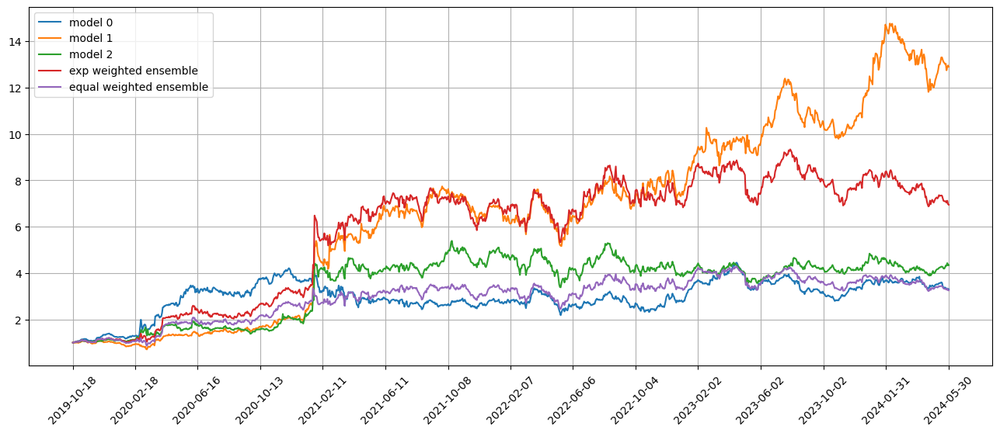

In [19]:
# Retrain all the rest
# %run C:\Projects\Stock_price_prediction\Experiments\CNN_Class.ipynb
ftd = 100
ltd = 199
print(f'Running {num_iters} iterations; first iteration already completed.')
first_run = False

for num_iter in range(1, num_iters):
    # Find train and test data
    ftd += seq_length
    ltd += seq_length
    data_train, x_train, y_train, data_test, x_test, y_test, ret_d_train, ret_d_test, sic_train, sic_test = prep_train_test_data(data, seq_length, ftd, ltd, all_days)
    print(f'Running iteration {num_iter+1} out of {num_iters} iterations')
    CNN_model.retrain_model(x_train, y_train, ret_d_train, sic_train) 
    CNN_model.evaluate_model(x_train, y_train, ret_d_train, sic_train, x_test, y_test, ret_d_test, sic_test, batch_size)

    if save:
        for i in range(model_params['num_models']):
            CNN_model.model_dict[i].save(f"models/model_{i}_{all_days[ftd]}_{all_days[ltd]}.keras")

    gc.collect()
    
    # Check how much the weights are trained
    print("Correlations between old and new weights")
    for i in range(num_of_models):
        new_weights[i] = CNN_model.model_dict[i].get_weights()
        print(np.corrcoef(old_weights[i][0][0][0], new_weights[i][0][0][0])[0, 1])
        x = old_weights[i][-1]
        y = new_weights[i][-1]
        print(np.corrcoef(x.reshape(80, ), y.reshape(80, ))[0, 1])
    old_weights = new_weights.copy()
    
    total_asset_dict, total_dict, position_dict_all, return_dict = simulate(ftd, ltd, total_dict, first_run, num_stocks, total_asset_dict, 
                                                                            position_dict_all, return_dict)